# 데이터문제해결 및 실습 기말 프로젝트
## 배틀그라운드 승리확률 예측
## 18011722 황찬웅, 18011730 전승찬

https://www.kaggle.com/competitions/pubg-finish-placement-prediction

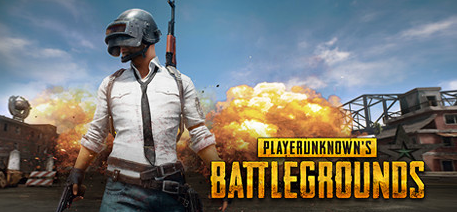

## 0. import data & package

In [ ]:
from IPython.display import Image
import warnings
warnings.filterwarnings('ignore')
# Core
import numpy as np 
import pandas as pd 

#row 출력제한 해제
pd.set_option('display.max_row', 500)
#column 출력제한 해제
pd.set_option('display.max_columns', 100)

# 시각화
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import style
plt.rc('font', family='Malgun Gothic')

# models
from datetime import datetime
from scipy.stats import skew  # for some statistics
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import scipy.stats as stats
import sklearn.linear_model as linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics

# preprocessing
from sklearn.model_selection import train_test_split 

In [ ]:
import os
if os.name == 'nt':
    font_family = "Malgun Gothic"
else:
    font_family = "AppleGothic"
sns.set(font=font_family, rc ={"axes.unicode_minus" : False})   

In [ ]:
if os.name == 'nt' or os.name == 'Linux' or os.name == 'Darwin':
    path = './'
else:
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/Colab Notebooks/PUBG_Project/'
    
train = pd.read_csv(path + 'train_V2.csv')
test = pd.read_csv(path + 'test_V2.csv')

In [ ]:
train.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4446966 entries, 0 to 4446965
Data columns (total 29 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Id               object 
 1   groupId          object 
 2   matchId          object 
 3   assists          int64  
 4   boosts           int64  
 5   damageDealt      float64
 6   DBNOs            int64  
 7   headshotKills    int64  
 8   heals            int64  
 9   killPlace        int64  
 10  killPoints       int64  
 11  kills            int64  
 12  killStreaks      int64  
 13  longestKill      float64
 14  matchDuration    int64  
 15  matchType        object 
 16  maxPlace         int64  
 17  numGroups        int64  
 18  rankPoints       int64  
 19  revives          int64  
 20  rideDistance     float64
 21  roadKills        int64  
 22  swimDistance     float64
 23  teamKills        int64  
 24  vehicleDestroys  int64  
 25  walkDistance     float64
 26  weaponsAcquired  int64  
 27  winPoints   

In [ ]:
test.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,0,0,0,0.00,1884,squad-fpp,28,28,1500,0,0.0,0,0.0,0,0,588.0,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,0,2,1,361.90,1811,duo-fpp,48,47,1503,2,4669.0,0,0.0,0,0,2017.0,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,0,0,0,0.00,1793,squad-fpp,28,27,1565,0,0.0,0,0.0,0,0,787.8,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,0,0,0,0.00,1834,duo-fpp,45,44,1465,0,0.0,0,0.0,0,0,1812.0,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,0,3,1,60.06,1326,squad-fpp,28,27,1480,1,0.0,0,0.0,0,0,2963.0,4,0


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1934174 entries, 0 to 1934173
Data columns (total 28 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Id               object 
 1   groupId          object 
 2   matchId          object 
 3   assists          int64  
 4   boosts           int64  
 5   damageDealt      float64
 6   DBNOs            int64  
 7   headshotKills    int64  
 8   heals            int64  
 9   killPlace        int64  
 10  killPoints       int64  
 11  kills            int64  
 12  killStreaks      int64  
 13  longestKill      float64
 14  matchDuration    int64  
 15  matchType        object 
 16  maxPlace         int64  
 17  numGroups        int64  
 18  rankPoints       int64  
 19  revives          int64  
 20  rideDistance     float64
 21  roadKills        int64  
 22  swimDistance     float64
 23  teamKills        int64  
 24  vehicleDestroys  int64  
 25  walkDistance     float64
 26  weaponsAcquired  int64  
 27  winPoints   

## 변수설명

DBNO - Down But Not Out 의 축약어. 기절상태가 되었지만 적 팀원이 부활시켜 사망하지 않은 적 플레이어의 수입니다.(솔로의 경우 팀원이 없어 0이 될 수밖에 없다)


Assists - 이 플레이어가 피해를 입었고 팀원들에 의해 사망한 적 플레이어의 수입니다.


boosts - 사용된 부스트 항목(에너지 드링크, 진통제, 아드레날린 주사기)의 수입니다.


DamageDealt - 가한 총 피해량입니다. 참고: 자신이 입힌 피해는 차감됩니다.


headshotKills - 헤드샷으로 사망한 적 플레이어의 수입니다.


heals - 사용된 치유 아이템(구급 상자, 붕대, 의료용 키트)의 수입니다.


Id - 플레이어 아이디


killPlace - 죽인 적 플레이어 수의 경기 순위입니다.


killPoints - 플레이어의 킬 기반 외부 순위입니다. (이것을 킬만 중요한 Elo 순위라고 생각하십시오.) rankPoints에 -1 이외의 값이 있는 경우 killPoints의 0은 "없음"으로 처리되어야 합니다.


killStreaks - 짧은 시간에 죽인 적 플레이어의 최대 수입니다.


kills - 죽인 적 플레이어의 수.


longKill - 사망 시 사망한 플레이어와 플레이어 사이의 최장 거리입니다. 플레이어를 쓰러뜨리고 차를 몰면 가장 긴 킬 통계가 나올 수 있으므로 이는 오해의 소지가 있습니다.


matchDuration - 초 단위의 일치 시간입니다.


matchId - 일치를 식별하는 ID입니다. 훈련 세트와 테스트 세트 모두에 일치하는 항목이 없습니다.


matchType - 데이터의 출처인 게임 모드를 식별하는 문자열입니다. 표준 모드는 "solo", "duo", "squad", "solo-fpp", "duo-fpp" 및 "squad-fpp"입니다. 다른 모드는 이벤트 또는 사용자 지정 일치에서 가져온 것입니다.


rankPoints - 플레이어의 Elo와 같은 순위입니다. 이 순위는 일관성이 없으며 API의 다음 버전에서 더 이상 사용되지 않으므로 주의해서 사용하십시오. -1의 값은 "없음"을 대신합니다.


revives - 이 플레이어가 팀원을 소생시킨 횟수입니다.


rideDistance - 미터로 측정한 차량의 총 이동 거리입니다.


roadKills - 차량에 있는 동안 킬 수입니다.


swimDistance - 미터로 측정한 수영으로 이동한 총 거리.


teamKills - 이 플레이어가 팀원을 죽인 횟수입니다.


vehicleDestroys - 파괴된 차량의 수입니다.


walkDistance - 미터로 측정한 도보로 이동한 총 거리입니다.


WeaponAcquired - 획득한 무기의 수입니다.


winPoints - 승리 기반 플레이어의 외부 순위입니다. (승리만이 중요한 Elo 순위라고 생각하십시오.) rankPoints에 -1 이외의 값이 있는 경우 winPoints의 0은 "없음"으로 처리되어야 합니다.


groupId - 일치 내에서 그룹을 식별하기 위한 ID입니다. 같은 그룹의 플레이어가 다른 경기에서 플레이하는 경우 매번 다른 groupId를 갖습니다.


numGroups - 경기에서 데이터가 있는 그룹의 수입니다.


maxPlace - 경기에서 데이터가 있는 최악의 위치입니다. 데이터가 게재위치를 건너뛰는 경우가 있으므로 numGroups와 일치하지 않을 수 있습니다.


★ winPlacePerc - 예측 대상입니다. 이것은 백분위수 승리 배치로, 1은 1위, 0은 경기의 마지막 위치에 해당합니다. numGroups가 아닌 maxPlace에서 계산되므로 일치 항목에서 청크가 누락될 수 있습니다.

## 1. EDA

### MatchType

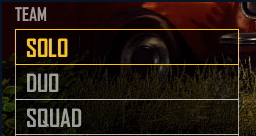

In [ ]:
df = train.copy()

num_match = df['matchId'].nunique()
print('train dataset에는 {} 가지의 게임 데이터가 존재'.format(num_match))

train dataset에는 47965 가지의 게임 데이터가 존재


In [ ]:
df1 = train.copy()
df1 = df1.drop_duplicates(['matchId'])
df1.reset_index(drop=True)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47960,e792a748b2ed18,bb09b6a0313fbb,dc5e44d25926fc,0,1,64.31,1,0,1,13,0,0,0,0.00,657,normal-duo-fpp,8,8,1500,0,1873.0000,0,0.00,0,0,722.70,2,0,0.1429
47961,07050e11000e8d,8c5115be85a2a7,7ae14295044ffe,0,0,99.00,0,0,0,13,0,0,0,0.00,1174,solo,19,1,1500,0,0.0000,0,0.00,0,0,0.00,4,0,0.0000
47962,f881d100268b40,d329b14d0b3e78,21beed46753ed9,5,0,1790.00,0,3,11,2,0,17,3,69.45,990,normal-duo-fpp,6,6,1500,0,0.0000,0,0.00,0,0,0.00,38,0,0.8000
47963,f70c74418bb064,12dfbede33f92b,224a123c53e008,0,0,0.00,0,0,0,1,0,0,0,0.00,9,solo-fpp,1,1,1574,0,0.0000,0,0.00,0,0,0.00,0,0,NaN


In [ ]:
m_types = df1['matchType'].value_counts().reset_index()
m_types.columns = ["matchType","Count"]
m_types

,matchType,Count
0,squad-fpp,18576
1,duo-fpp,10620
2,squad,6658
3,solo-fpp,5679
4,duo,3356
5,solo,2297
6,normal-squad-fpp,358
7,normal-duo-fpp,158
8,normal-solo-fpp,96
9,crashfpp,73


* PUBG의 배틀그라운드 게임에는 'solo', 'duo', 'squad' 세가지 게임 모드가 있다. 각각 1인, 2인, 4인으로 플레이한다.

* FPP: 1인칭 시점

* TPP: 3인칭 시점

* Normal: 게임 중간에 시점을 변경한 경우, 정확하게 식별은 불가하다.

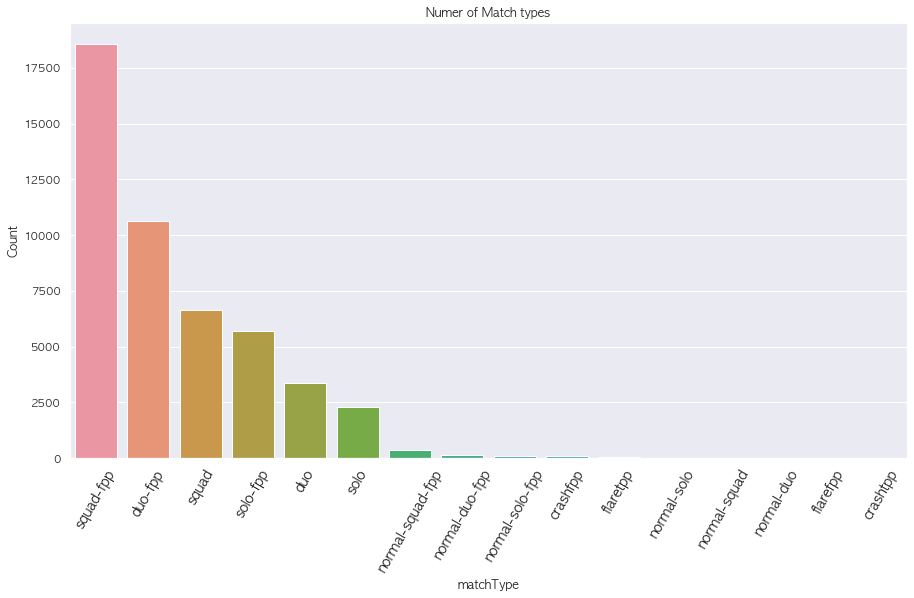

In [ ]:
plt.figure(figsize=(15,8))
ticks = m_types.matchType.values
ax = sns.barplot(x="matchType", y="Count", data=m_types)
ax.set_xticklabels(ticks, rotation=60, fontsize=14)
ax.set_title("Numer of Match types")
plt.show()

solo, duo, squad 를 제외하고는 데이터의 양 자체가 매우 적기 때문에, 전처리 시 이들과 합해주어도 괜찮을 듯 하다.

In [ ]:
m_types_2 = df1.loc[:,"matchType"].value_counts().to_frame()
aggregated_squads = m_types_2.loc[["squad-fpp","squad","normal-squad-fpp","normal-squad"],"matchType"].sum()
aggregated_duos = m_types_2.loc[["duo-fpp","duo","normal-duo-fpp","normal-duo"],"matchType"].sum()
aggregated_solo = m_types_2.loc[["solo-fpp","solo","normal-solo-fpp","normal-solo"],"matchType"].sum()
sum_of_matchtypes = pd.DataFrame([aggregated_squads,aggregated_duos,aggregated_solo], index=["squad","duo","solo"], columns =["count"])
sum_of_matchtypes

,count
squad,25608
duo,14146
solo,8095


In [ ]:
data = sum_of_matchtypes.values
data = np.concatenate(data).tolist()

labels = sum_of_matchtypes.index

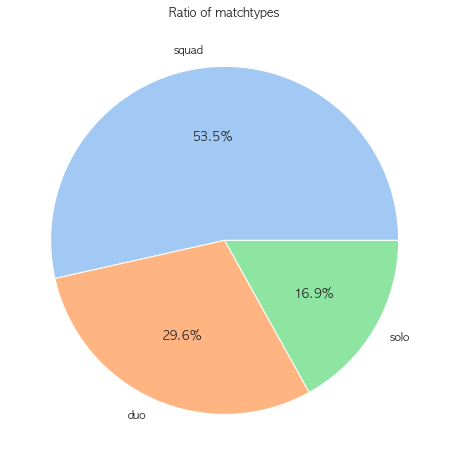

In [ ]:
colors = sns.color_palette('pastel')[0:3]

#create pie chart
plt.figure(figsize=(15,8))
plt.pie(data, labels = labels, colors = colors, autopct='%.1f%%')
plt.title('Ratio of matchtypes')
plt.show()

Squard의 비율이 53.5%로 가장 많고 그 뒤로 duo, solo가 각각 29.6, 16.9%의 비율을 차지하고 있다.

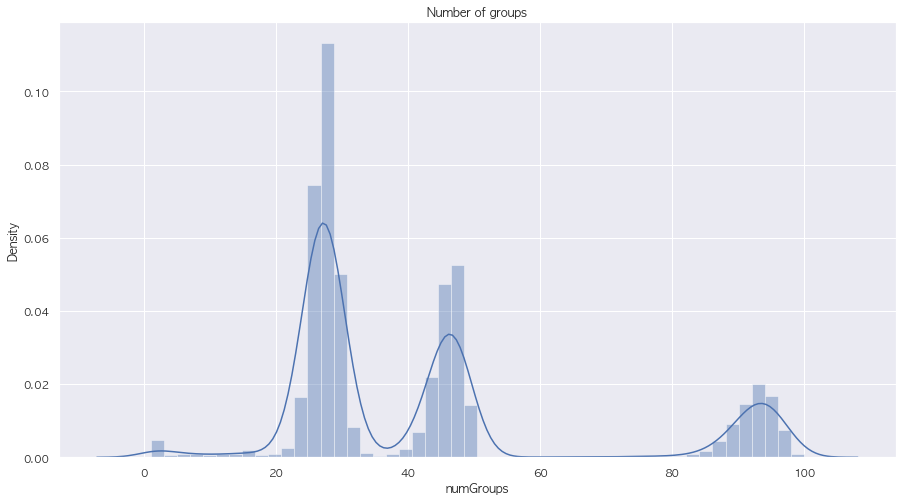

In [ ]:
plt.figure(figsize=(15,8))
ax = sns.distplot(df1["numGroups"])
ax.set_title("Number of groups")
plt.show()

distplot을 통해 solo. duo. squard 의 분포를 한눈에 알아볼 수 있있다.

첫번째 봉우리 부터 각각, squard -> duo -> solo 순이다.

### 히트맵

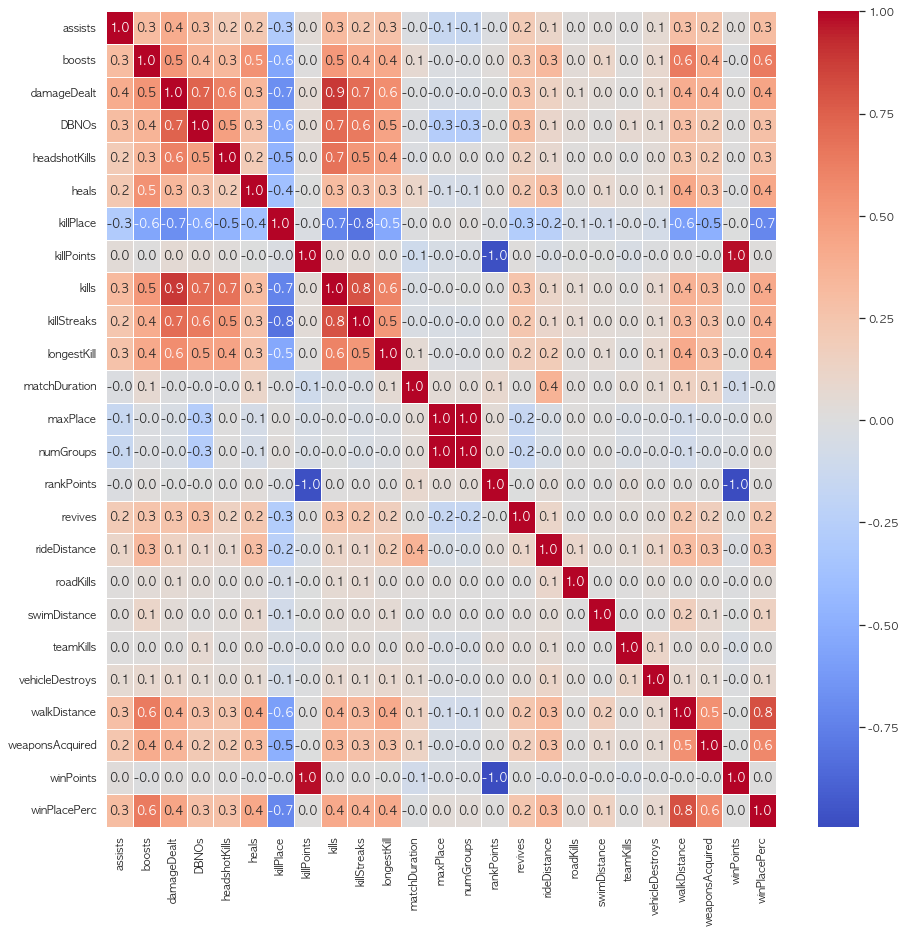

In [ ]:
f,ax = plt.subplots(figsize=(15, 15))
sns.heatmap(train.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax, cmap = 'coolwarm')
plt.show()

타겟값과 상관계수가 높은 4개의 피처

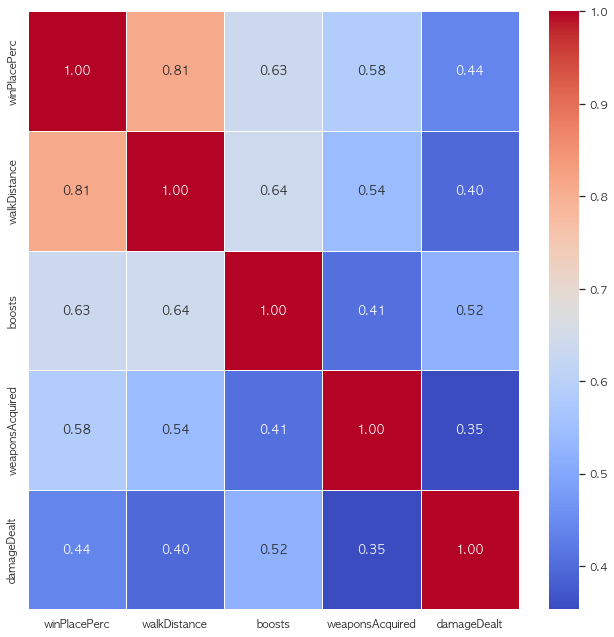

In [ ]:
k = 5 #number of variables for heatmap
f,ax = plt.subplots(figsize=(11, 11))
cols = train.corr().nlargest(k, 'winPlacePerc')['winPlacePerc'].index
sns.heatmap(train[cols].corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax, cmap = 'coolwarm')
sns.set(font_scale=1.25)
plt.show()

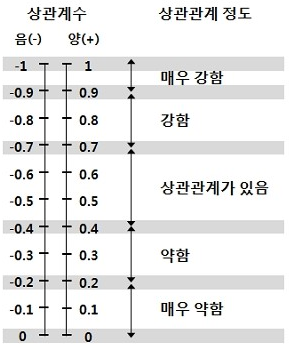

히트맵의 피어슨 상관계수를 우선적으로 보고 중요 피처 선정

*   0.5 이상 피처 = boosts, killPlace, walkDistance, weaponsAcquired
*   0.2 ~ 0.4 피처 = damageDealt, kills, killStreaks, longestkill
*   kills 와 연관있는 피처들(killstreaks, longestkill)의 상관관계 강하여 따로 분석 불필요하다.



### 타깃 값 분포

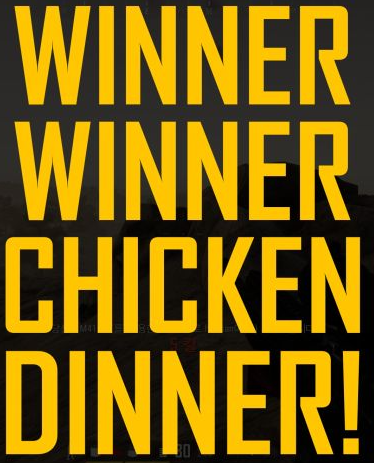

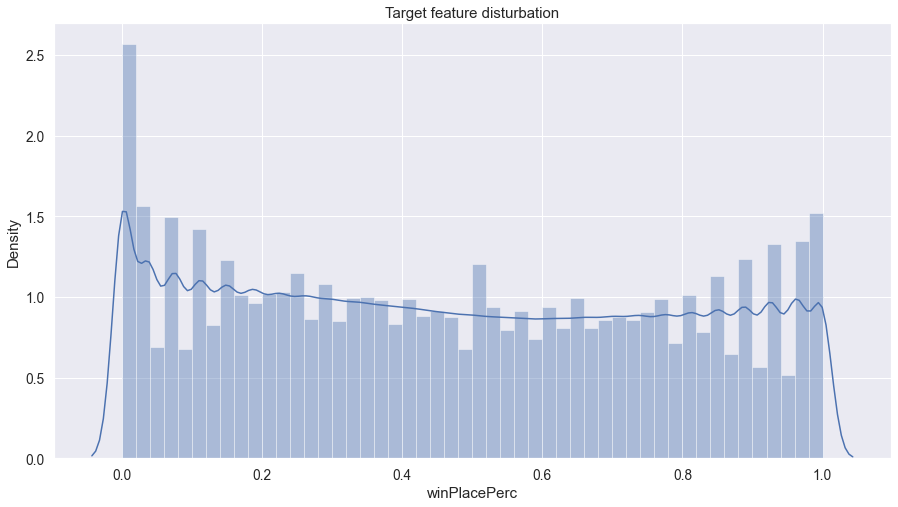

In [ ]:
# target값 분포 확인
df = train.copy()

plt.figure(figsize=(15,8))
sns.distplot(df.winPlacePerc)
plt.title('Target feature disturbation')
plt.show()

winPlacePrec가 0을 제외하고는 데이터가 어느정도 고르게 분포되어 있다.

### kills

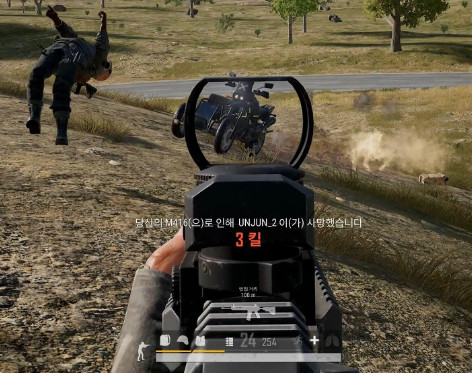

kills 분포

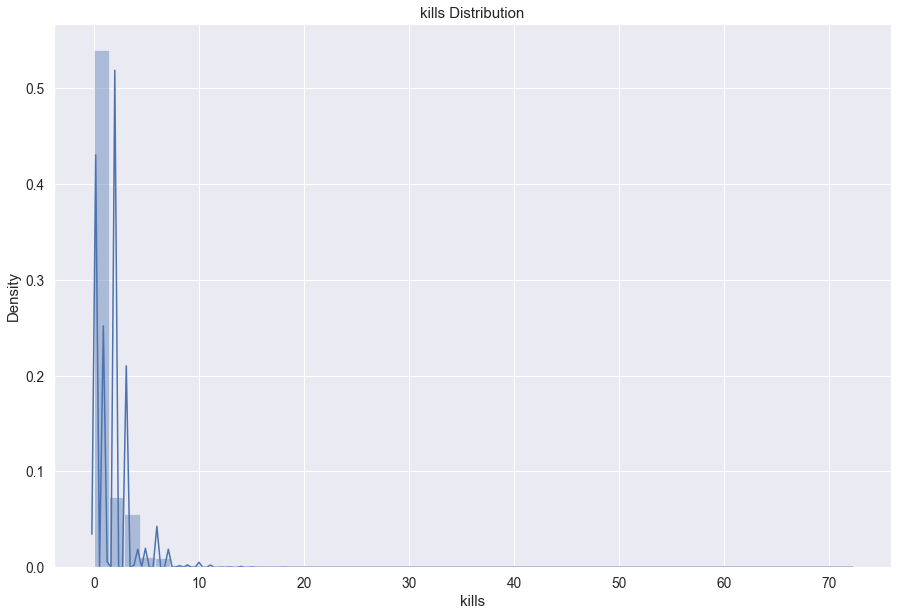

In [ ]:
data = train.copy()

plt.figure(figsize=(15,10))
plt.title("kills Distribution",fontsize=15)
sns.distplot(data['kills'])
plt.show()

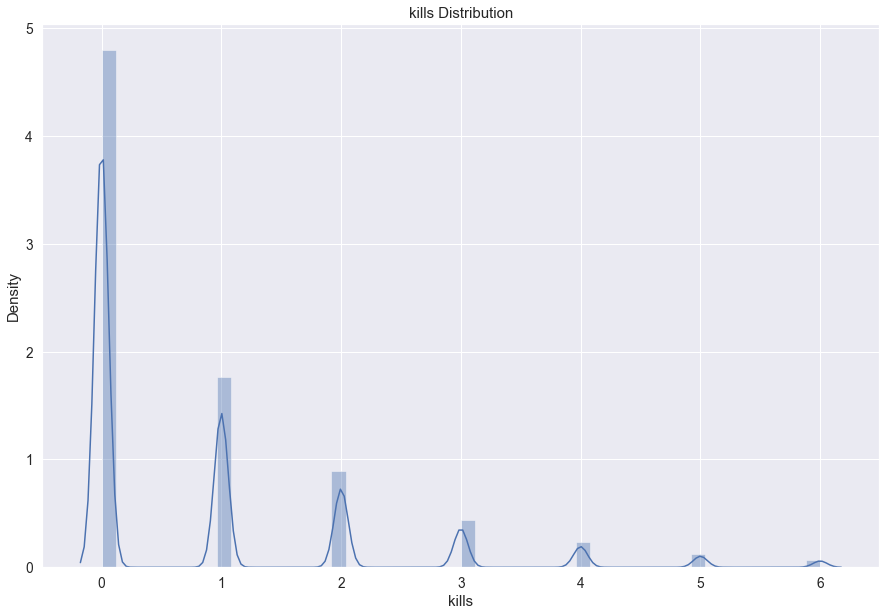

In [ ]:
data = train.copy()
data = data[data['kills'] < train['kills'].quantile(0.99)] #백분위 99로 짤라서 표현
plt.figure(figsize=(15,10))
plt.title("kills Distribution",fontsize=15)
sns.distplot(data['kills'])
plt.show()

99% 데이터가 6킬이하에 분포하고 있음을 알 수 있다. 즉, 대부분의 플레이어들이 6킬 이하를 하였다는 것을 알 수 있다.

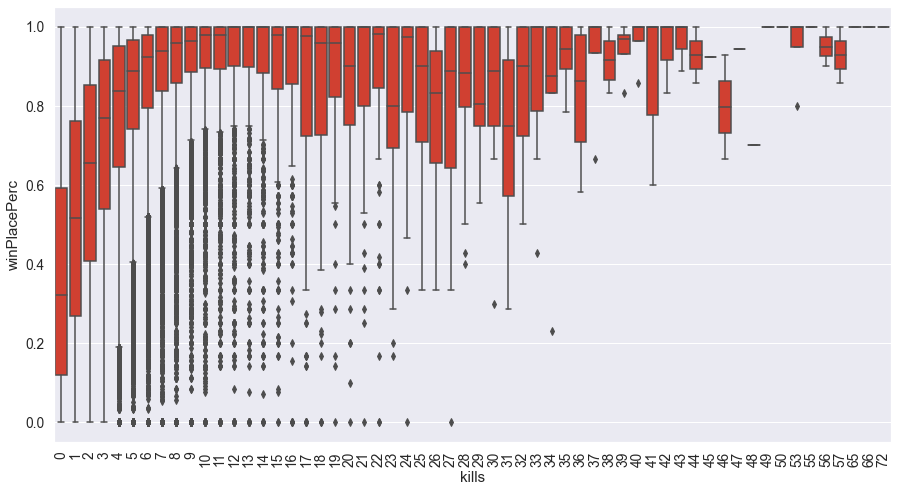

In [ ]:
kills = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x="kills", y="winPlacePerc", data=kills, color='#EB2B16')
plt.xticks(rotation=90)
plt.show()

*   0킬 우승도 있다.
*   킬을 많이 가져갈수록 높은 순위에 처하는 분포의 수가 많아진다.

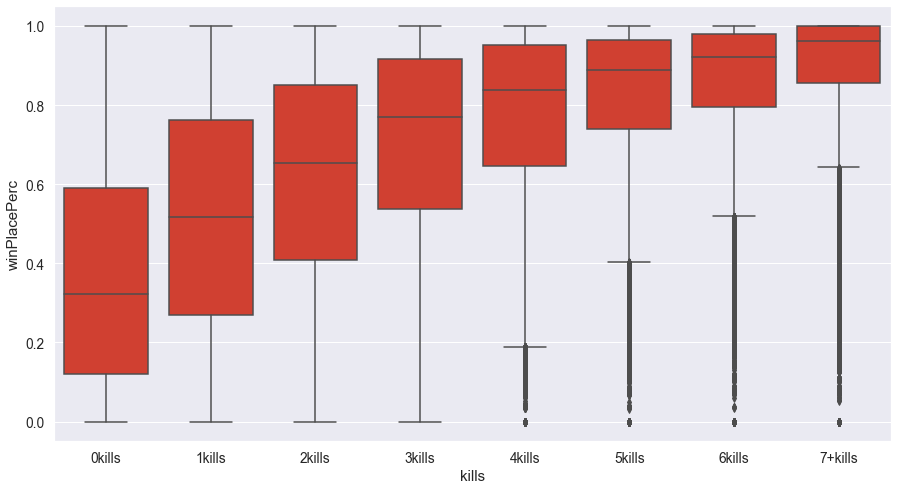

In [ ]:
kills = train.copy()

kills['kills'] = pd.cut(kills['kills'], [-1, 0, 1, 2, 3, 4, 5, 6, 73], labels=['0kills','1kills', '2kills', '3kills', '4kills', '5kills', '6kills', '7+kills'])
plt.figure(figsize=(15,8))
sns.boxplot(x="kills", y="winPlacePerc", data=kills, color='#EB2B16')
plt.show()

킬을 많이 가져갈수록 높은 순위에 처하는 분포의 수가 많아진다. 상위 1%를 묶어서 더욱 분포를 확인하기 쉬워졌다.

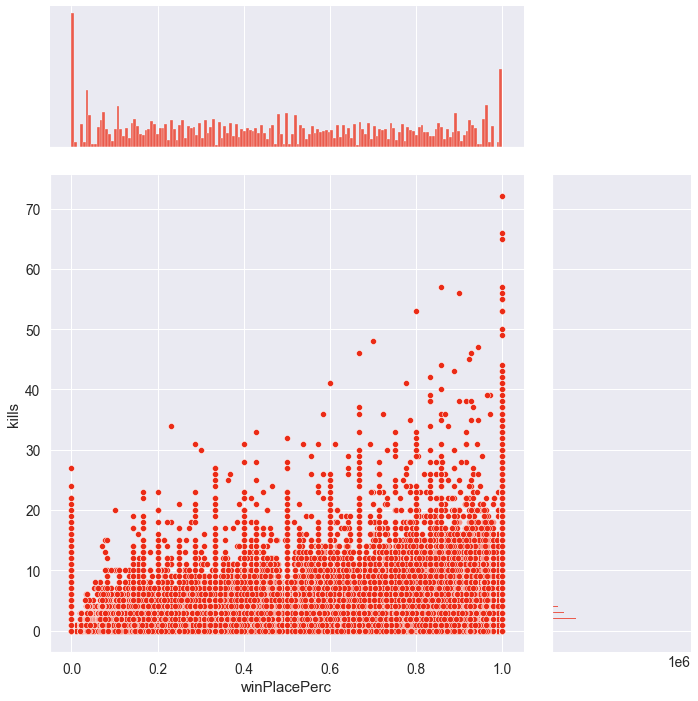

In [ ]:
sns.jointplot(x="winPlacePerc", y="kills", data=train, height=10, ratio=3, color='#EB2B16') #scatter w fil les deux axes  hists
plt.show()

*   타깃값이 커질수록 킬 수치가 증가함을 확인할 수 있다.

kills 수

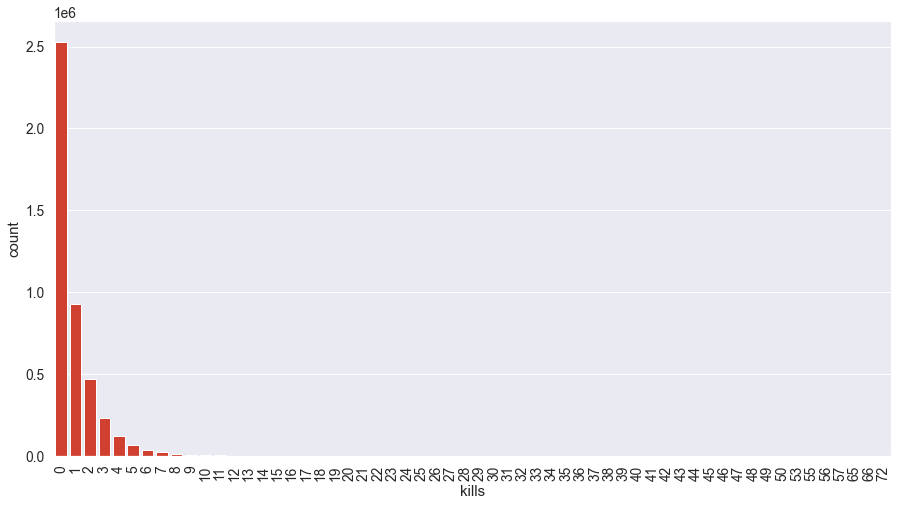

In [ ]:
kills = train.copy()

plt.figure(figsize=(15,8))
sns.countplot(x="kills", data=kills, color='#EB2B16')
plt.xticks(rotation=90)
plt.show()

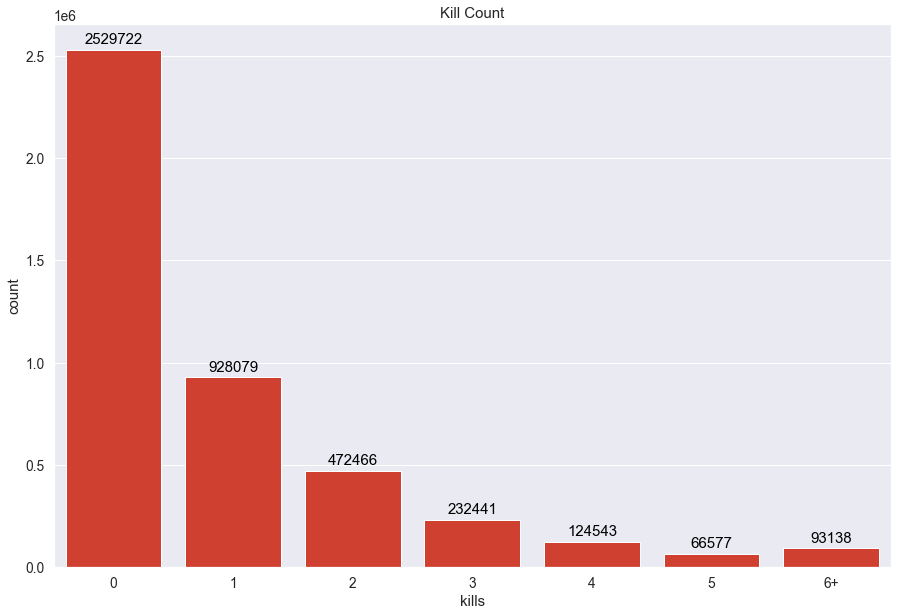

In [ ]:
data = train.copy()
data.loc[data['kills'] >= data['kills'].quantile(0.98)] = '6+'
plt.figure(figsize = (15,10))
plt.title("Kill Count",fontsize=15)

g = sns.countplot(x = data['kills'].astype('str').sort_values(), color='#EB2B16')
ax = g

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=15, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

'kills' 피처의 데이터 분포를 시각화하였다. 6킬 이상의 데이터는 거의 존재 하지 않으므로 한 그룹으로 묶었다.


그래프를 살펴보면 대부분의 사람들이 0킬을 기록했으며, 킬 수가 늘어날 수록 급격하게 그래프 감소폭이 커진다.

#### Kills vs DBNOs

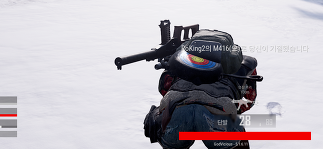

* 배그에서는 solo 모드를 제외하면 Hp가 모두 소진되었을 시 DBNOs 상태 즉, 기절상태(같은 팀원에 의해 부활가능) 상태가 된다. 

* 하지만 headshotKills은 즉사판정이기 때문에 headshot은 kill과 직접적인 영향이 있을 것으로 보인다.

##### DBNOs & headshotKills

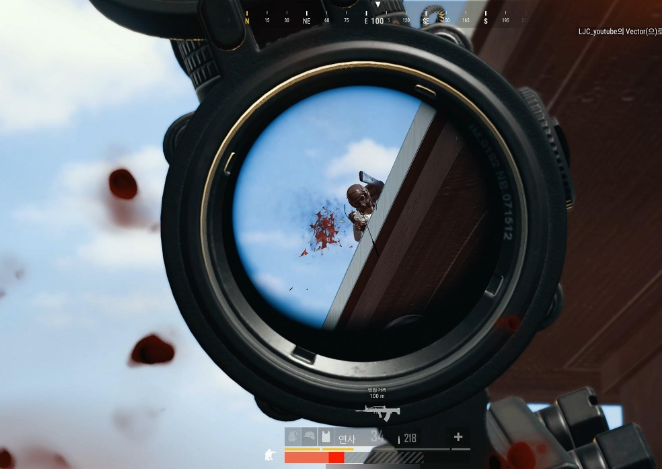

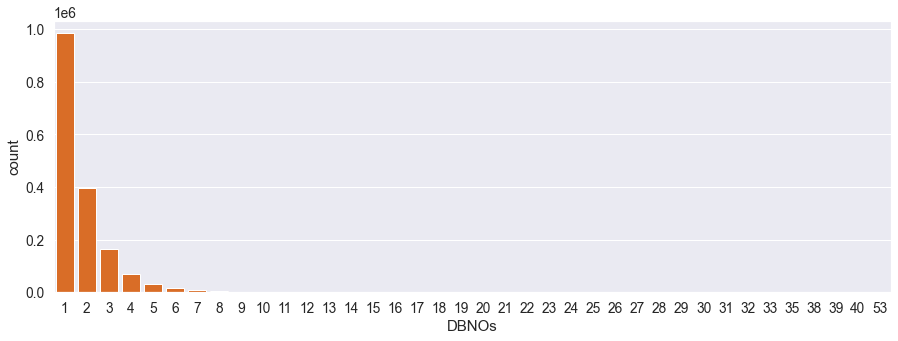

In [ ]:
df_DBNOs = df[df['DBNOs']>0]
plt.figure(figsize=(15,5))
sns.countplot(df_DBNOs['DBNOs'].sort_values(), color='#F6660A')
plt.show()

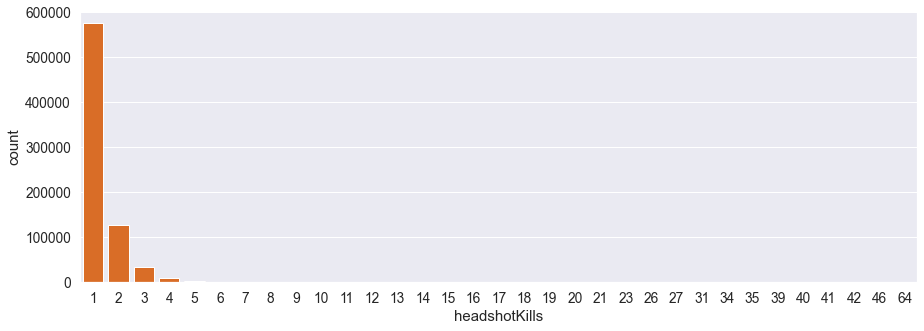

In [ ]:
df_headshotKills = df[df['headshotKills']>0]
plt.figure(figsize=(15,5))
sns.countplot(df_headshotKills['headshotKills'].sort_values(), color='#F6660A')
plt.show()

*   headshotKills 와 DBNOs 의 데이터 분포가 유사하다.

둘의 직접적인 상관관계 확인을 위해 박스플롯을 그려보았다.

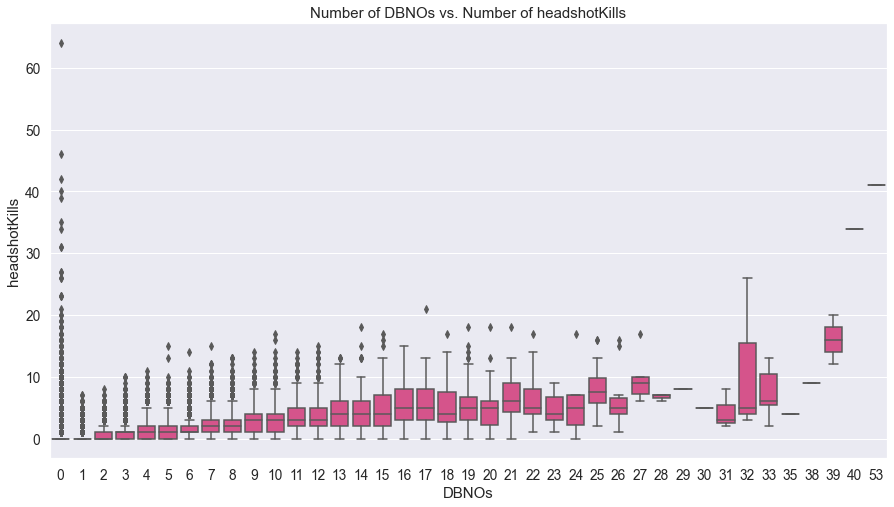

In [ ]:
plt.figure(figsize=(15,8))

ax2 = sns.boxplot(x="DBNOs",y="headshotKills", data = df, color='#EB3F88')
ax2.set_title("Number of DBNOs vs. Number of headshotKills")
ax2.set_ylim=(0, 30)
plt.show()

In [ ]:
print("플레이어들의 평균 DBNOs : " + str(train["DBNOs"].mean()))

플레이어들의 평균 DBNOs : 0.6578755043326169


*   DBNO는 headshotKills과 큰 상관관계는 없는 것 으로 보인다.
*   보통 헤스샷에 의해 죽지 않는다면 DBNO 상태에 있는 동안 킬을 해야 한다.
*   DBNO 없이 킬을 득점한 플레이어의 킬은 대부분 헤드샷이나 차량 폭발이다.

In [ ]:
print("한 플레이어의 최다 헤드샷킬 : " + str(train["headshotKills"].max()))

한 플레이어의 최다 헤드샷킬 : 64


kill을 많이 한 플레이어들의 kill 관련 데이터를 살펴본다. (kill의 분포가 57이후로 65로 갑자기 뛰었으므로 이를 기준으로 필터링 진행)

In [ ]:
df[df['kills']>60][["Id","assists","damageDealt","headshotKills","kills","longestKill"]]

,Id,assists,damageDealt,headshotKills,kills,longestKill
334400,810f2379261545,20,6616.0,13,65,73.90
1248348,80ac0bbf58bfaf,5,6375.0,21,66,319.90
3431247,06308c988bf0c2,7,5990.0,64,72,78.23


이와 같이 많이 떨어진 값들은 차후 전처리 과정에서 모델 성능을 위해 제거될 수 있다.

#### Kill vs damage

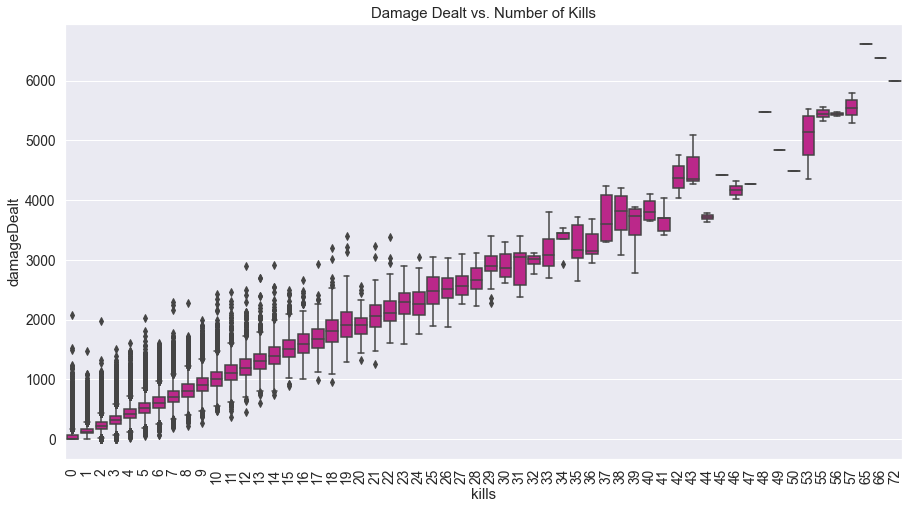

In [ ]:
plt.figure(figsize=(15,8))
ax1 = sns.boxplot(x="kills",y="damageDealt", data = df, color='#D40F92')
ax1.set_title("Damage Dealt vs. Number of Kills")
plt.xticks(rotation=90)
plt.show()

* 다음의 박스플롯 그래프를 보면 kill과 damage의 상관관계가 명확하게 있음을 알 수 있다: kill 수가 높을 수록  가한 damage의 양이 많다.

* 이상치는 적은 kill에서 많이 존재하며 kill수가 올라갈수록 이상치는 거의 없음을 알 수 있다. kill을 많이 한 플레이어 일수록 자잘한 데미지 (ex. 부상, 기절 등) 보다는 확실한 kill을 했음을 알 수 있다.

#### Solo vs Duo vs Squad Kills

In [ ]:
solos = train[train['numGroups']>50]
duos = train[(train['numGroups']>25) & (train['numGroups']<=50)]
squads = train[train['numGroups']<=25]
print("게임의 수 분포로 {} ({:.2f}%) 솔로 게임, {} ({:.2f}%) 듀오게임, {} ({:.2f}%) 스쿼드 게임."
      .format(len(solos), 
              100*len(solos)/len(train), 
              len(duos),
              100*len(duos)/len(train),
              len(squads),
              100*len(squads)/len(train),))

게임의 수 분포로 709111 (15.95%) 솔로 게임, 3295326 (74.10%) 듀오게임, 442529 (9.95%) 스쿼드 게임.


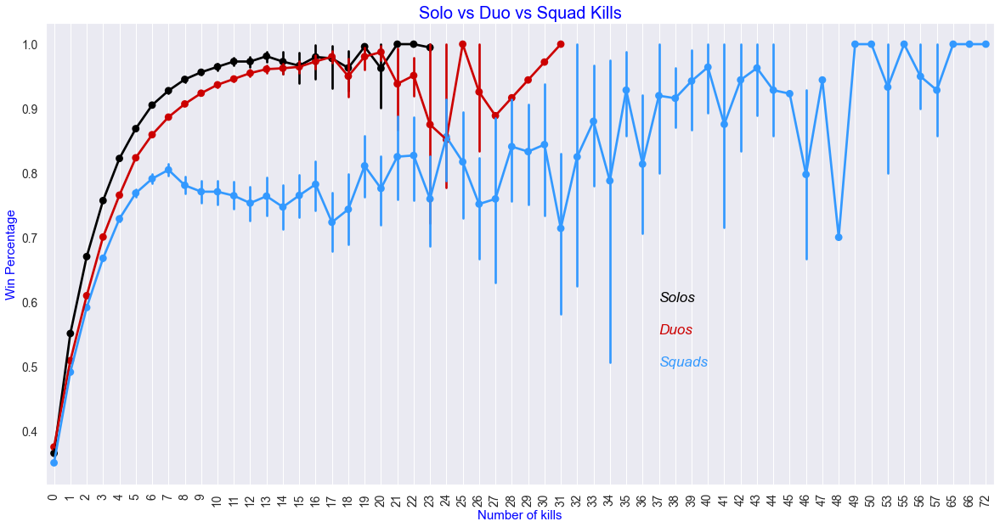

In [ ]:
f,ax1 = plt.subplots(figsize =(20,10))
sns.pointplot(x='kills',y='winPlacePerc',data=solos,color='black',alpha=0.8)
sns.pointplot(x='kills',y='winPlacePerc',data=duos,color='#CC0000',alpha=0.8)
sns.pointplot(x='kills',y='winPlacePerc',data=squads,color='#3399FF',alpha=0.8)
plt.text(37,0.6,'Solos',color='black',fontsize = 17,style = 'italic')
plt.text(37,0.55,'Duos',color='#CC0000',fontsize = 17,style = 'italic')
plt.text(37,0.5,'Squads',color='#3399FF',fontsize = 17,style = 'italic')
plt.xlabel('Number of kills',fontsize = 15,color='blue')
plt.ylabel('Win Percentage',fontsize = 15,color='blue')
plt.title('Solo vs Duo vs Squad Kills',fontsize = 20,color='blue')
plt.xticks(rotation=90)
plt.grid()
plt.show()

게임의 종류에 따라 킬수와 타깃값 사이에 조금씩 다른 상관 관계가 있음을 확인할 수 있다.

### killPlace

*   killPlace는 히트맵에서 타깃값과 유일한 음의 상관관계이며 강한 음의 상관관계를 보인다.
*   마지막으로 죽인 적 플레이어 수의 경기 순위로, 이는 위 결과를 설명할 수 있다.

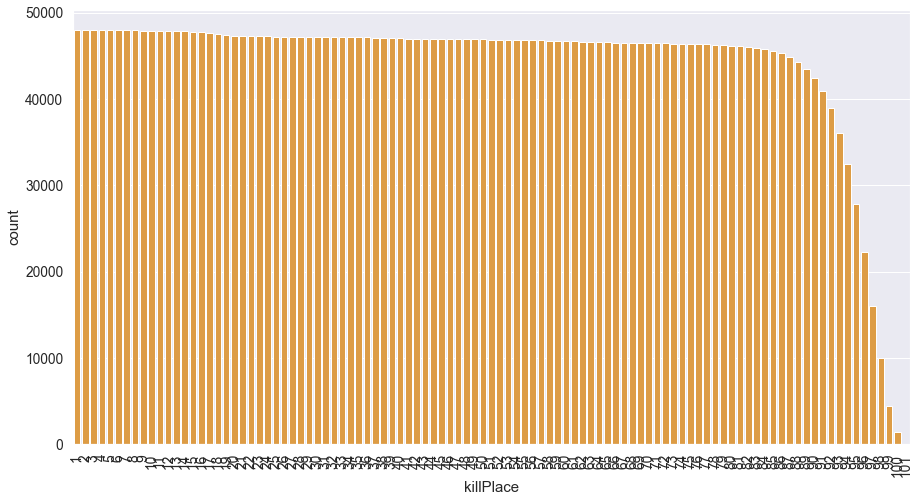

In [ ]:
kills = train.copy()

plt.figure(figsize=(15,8))
sns.countplot(x="killPlace", data=kills, color='#F6A02C')
plt.xticks(rotation=90)
plt.show()

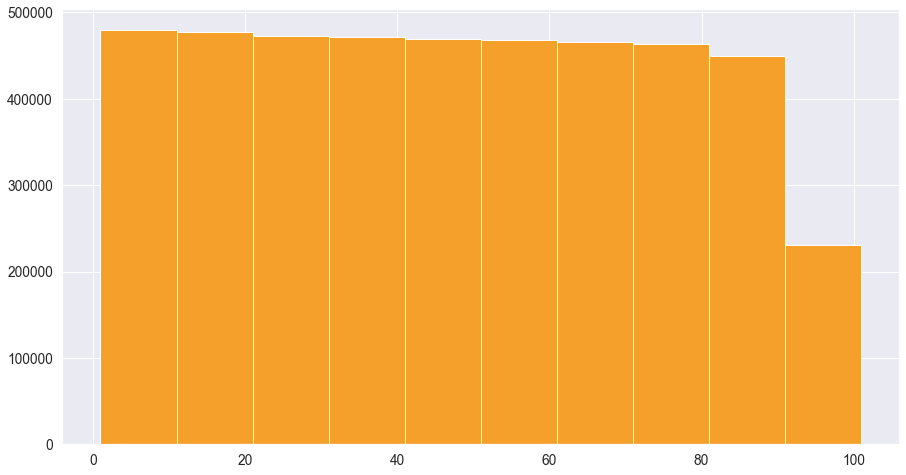

In [ ]:
plt.figure(figsize=(15,8))
plt.hist(kills['killPlace'], color='#F6A02C')
plt.show()

전체 killPlace 의 분포이다.

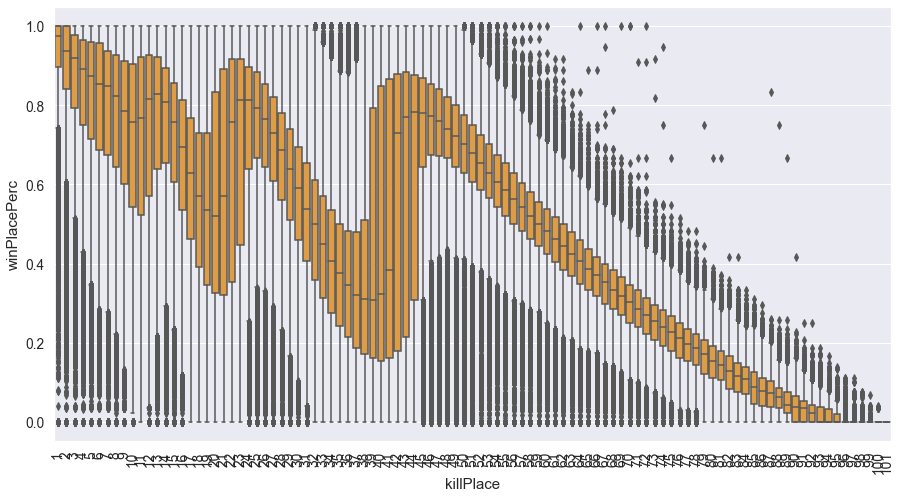

In [ ]:
killPlace = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x="killPlace", y="winPlacePerc", data=killPlace, color='#F6A02C')
plt.xticks(rotation=90)
plt.show()

타깃값과 killPlace 분포를 시각화 하였다.

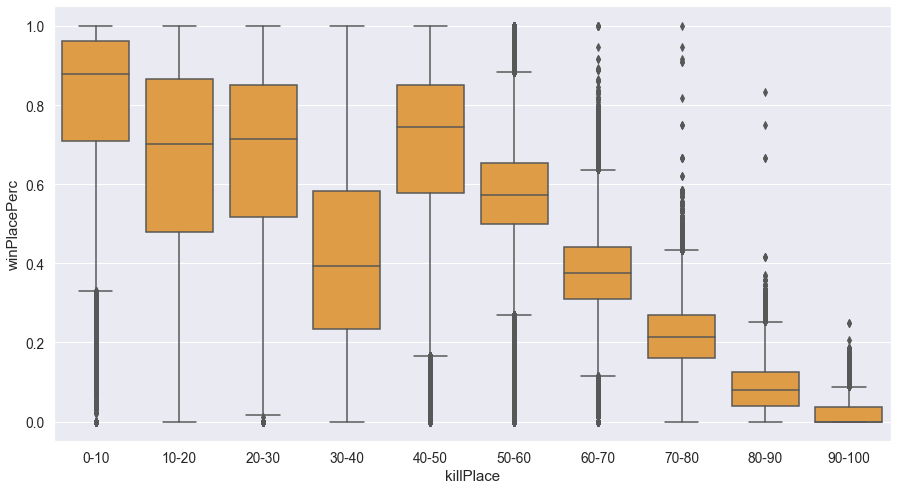

In [ ]:
kills = train.copy()

kills['killPlace'] = pd.cut(kills['killPlace'], [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100], labels=['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100'])
plt.figure(figsize=(15,8))
sns.boxplot(x="killPlace", y="winPlacePerc", data=kills, color='#F6A02C')
plt.show()

10 단위로 묶어서 타깃값과 killPlace 분포를 시각화 하였다.

*   결과적으로 음의 상관관계를 확인할 수 있었다.
*   특정한 수치에서 지표가 좋아지고 나빠지는 패턴이 반복되었다.

### assists

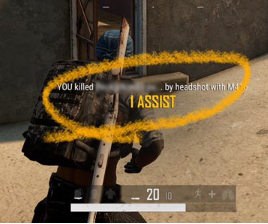

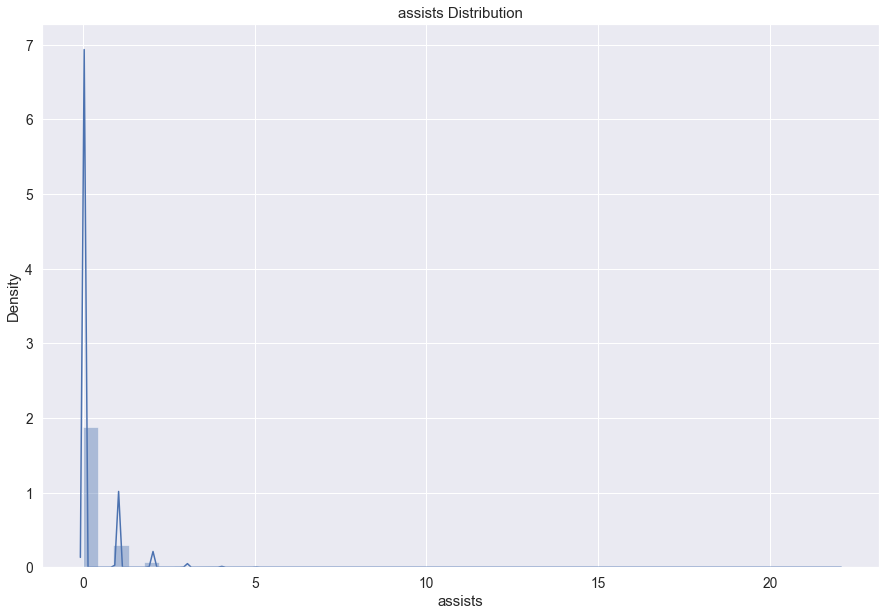

In [ ]:
data = train.copy()

plt.figure(figsize=(15,10))
plt.title("assists Distribution",fontsize=15)
sns.distplot(data['assists'])
plt.show()

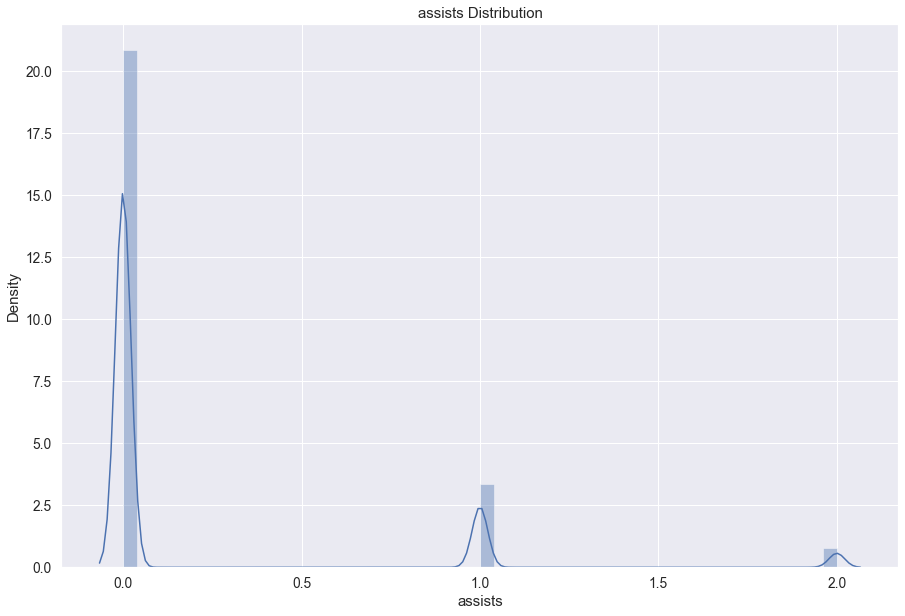

In [ ]:
data = train.copy()
data = data[data['assists'] < train['assists'].quantile(0.99)] #백분위 99로 짤라서 표현
plt.figure(figsize=(15,10))
plt.title("assists Distribution",fontsize=15)
sns.distplot(data['assists'])
plt.show()

assists 의 분포는 넓었지만 하위 99%의 사람들은 2어시스트까지만 달성하였다.

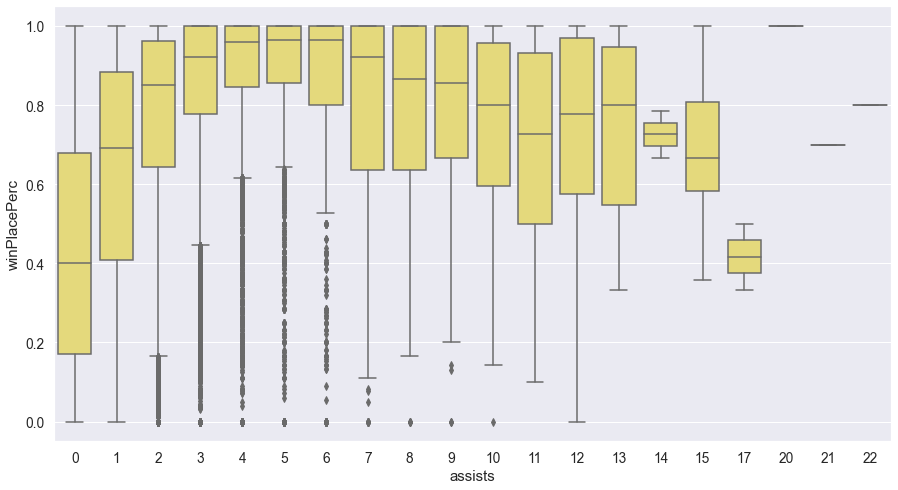

In [ ]:
assists = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x="assists", y="winPlacePerc", data=assists, color='#F6E66A')
plt.show()

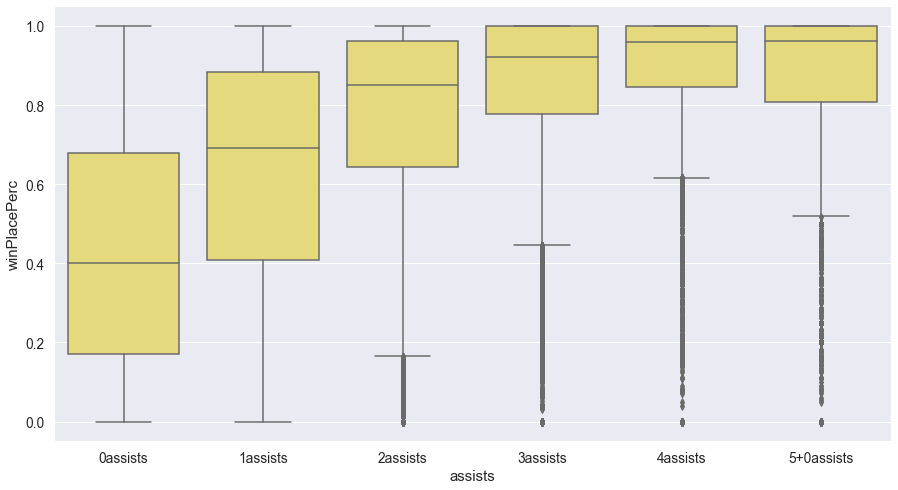

In [ ]:
assists = train.copy()

assists['assists'] = pd.cut(assists['assists'], [-1, 0, 1, 2, 3, 4, 22], labels=['0assists','1assists', '2assists', '3assists', '4assists', '5+0assists'])
plt.figure(figsize=(15,8))
sns.boxplot(x="assists", y="winPlacePerc", data=assists, color='#F6E66A')
plt.show()

*   kills 피처와 비슷하게 assists 피처도 많아질수록 타깃값의 분포인 상위권 분포가 많다.
*   어시스트 달성 수가 적기 때문에 3 어시스트 이상부터는 특별한 차이를 찾기 힘들다.

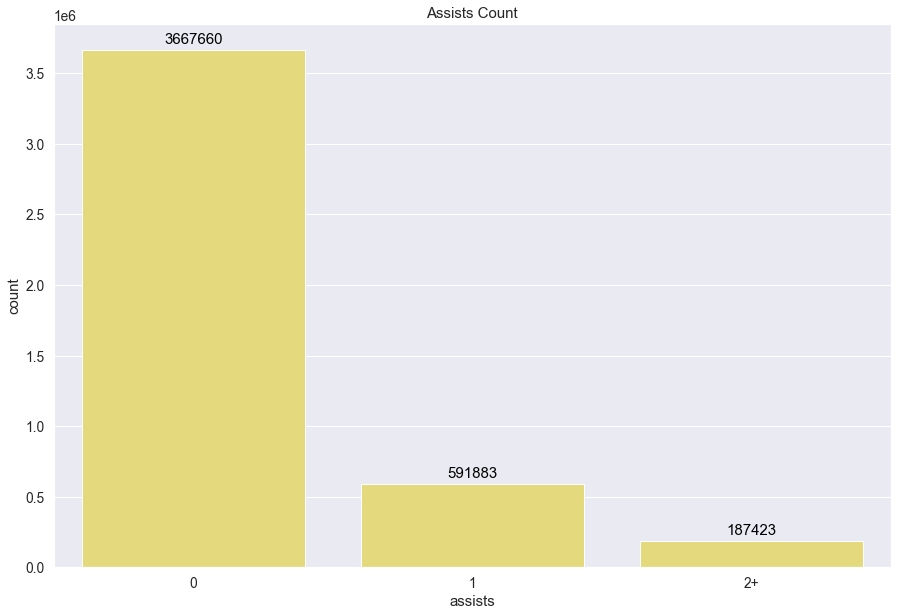

In [ ]:
data = train.copy()
data.loc[data['assists'] >= data['assists'].quantile(0.98)] = '2+'
plt.figure(figsize = (15,10))
plt.title("Assists Count",fontsize=15)

g = sns.countplot(x = data['assists'].astype('str').sort_values(), color='#F6E66A')
ax = g

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=15, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

어시스트도 다른 피처들과 마찬가지로 대부분의 데이터가 0~1에 위치해있음을 알 수 있다.

### walkDistance

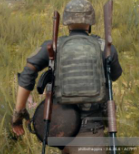

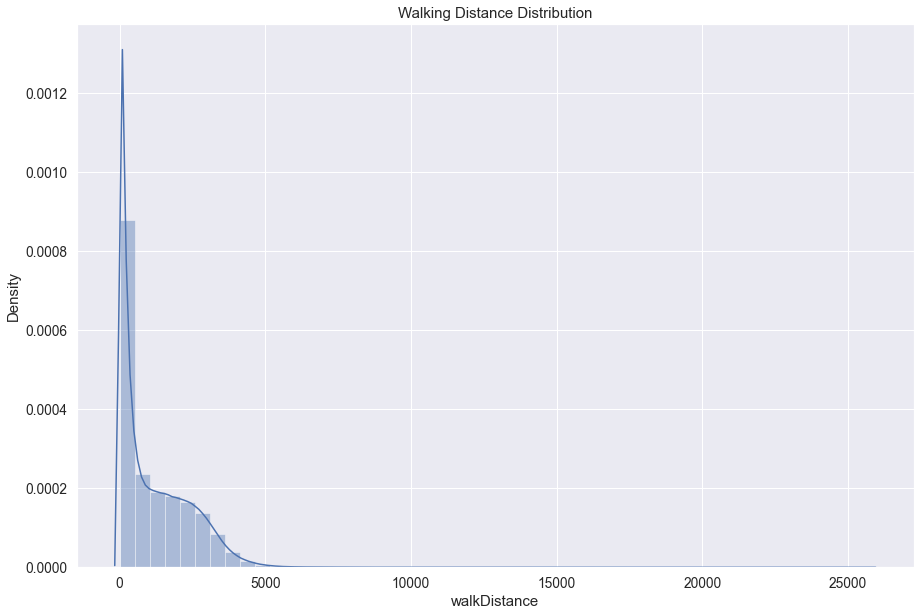

In [ ]:
data = train.copy()

plt.figure(figsize=(15,10))
plt.title("Walking Distance Distribution",fontsize=15)
sns.distplot(data['walkDistance'])
plt.show()

엄청나게 맵을 넓게 사용한 사람이 있다.

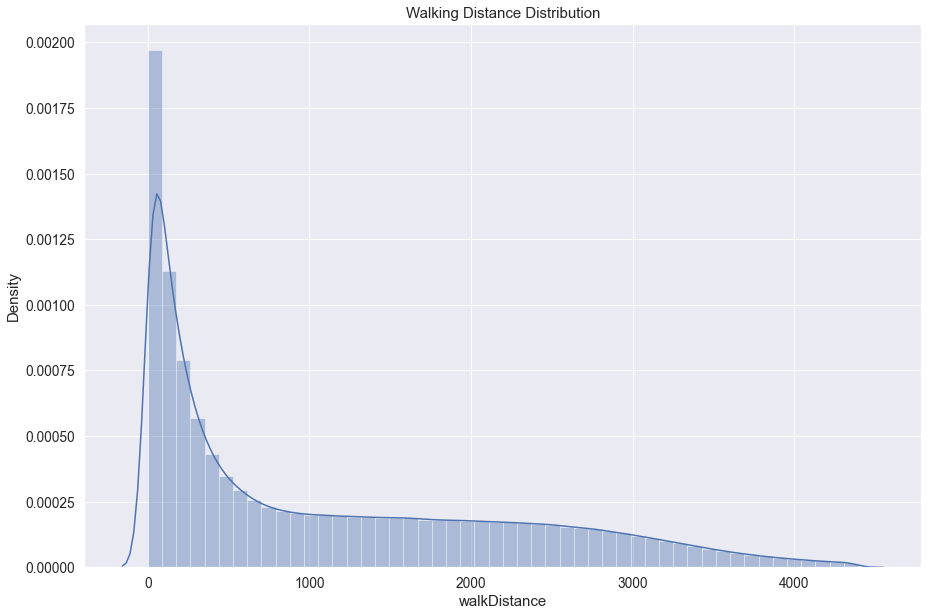

In [ ]:
data = train.copy()
data = data[data['walkDistance'] < train['walkDistance'].quantile(0.99)] #백분위 99로 짤라서 표현
plt.figure(figsize=(15,10))
plt.title("Walking Distance Distribution",fontsize=15)
sns.distplot(data['walkDistance'])
plt.show()

하위 99%의 사람들은 대부분 4km 내로 이동을 하였다.

In [ ]:
print("{} 명이 ({:.4f}%) 0미터를 걸었다. 안움직이고 죽은것은 탈주로 생각된다.".format(len(data[data['walkDistance'] == 0]), 100*len(data[data['walkDistance']==0])/len(train)))

99603 명이 (2.2398%) 0미터를 걸었다. 안움직이고 죽은것은 탈주로 생각된다.


시작 자리에서 움직이지 않은 탈주자는 2% 정도 있다

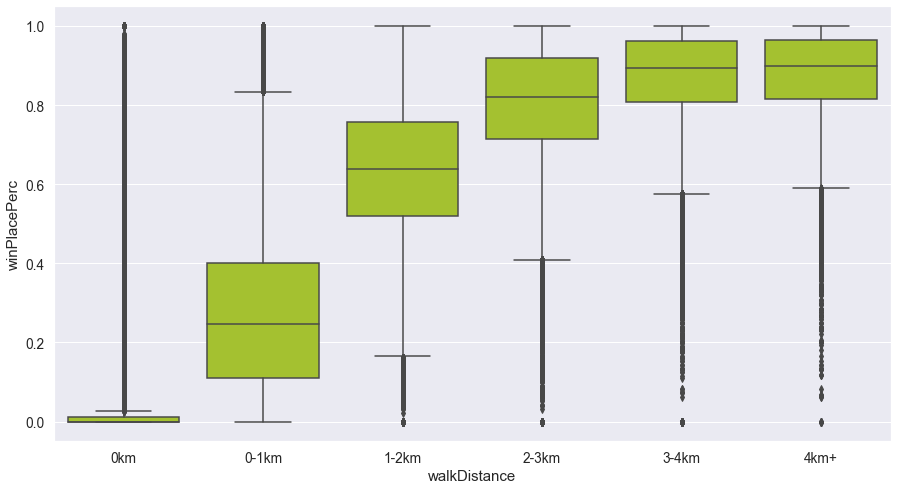

In [ ]:
walkDistance = train.copy()

walkDistance['walkDistance'] = pd.cut(walkDistance['walkDistance'], [-1, 0, 1000, 2000, 3000, 4000, 30000], labels=['0km','0-1km', '1-2km', '2-3km', '3-4km', '4km+'])

plt.figure(figsize=(15,8))
sns.boxplot(x="walkDistance", y="winPlacePerc", data=walkDistance, color='#B2D918')
plt.show()

*   탈주자들의 지표는 매우 나쁘다.
*   1km 이상 움직인 사람들의 지표가 급격히 좋아졌다.
*   안움직이고 치킨을 먹은 사람이 있다.
*   배틀로얄 장르인 배그의 특성상 원 방향에 맞춰 계속 이동해야 하기 때문에 이동거리가 올라갈수록 상위권 분포가 많다.

### rideDistance

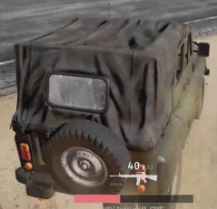

In [ ]:
print("평균적으로 사람들은 {:.1f}m 차량 이동을 하였고, 99% 사람들이 최대 {}m 차량이동 하였고, 가장 많이 이동한 사람은 {}m 이다.".format(train['rideDistance'].mean(), train['rideDistance'].quantile(0.99), train['rideDistance'].max()))

평균적으로 사람들은 606.1m 차량 이동을 하였고, 99% 사람들이 최대 6966.0m 차량이동 하였고, 가장 많이 이동한 사람은 40710.0m 이다.


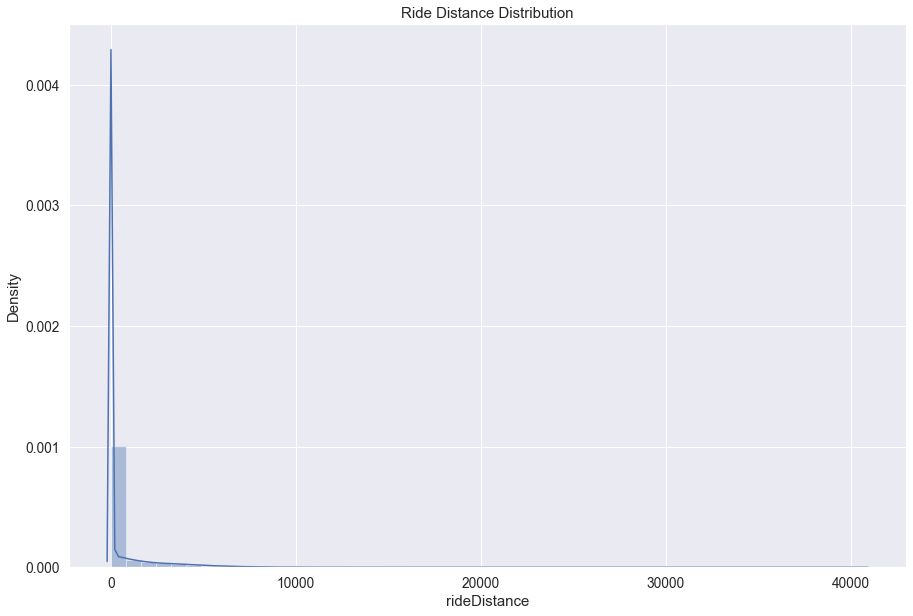

In [ ]:
data = train.copy()
plt.figure(figsize=(15,10))
plt.title("Ride Distance Distribution",fontsize=15)
sns.distplot(data['rideDistance'])
plt.show()

walk 분포와 같이 넓은 거리를 이동한 사람이 있다.

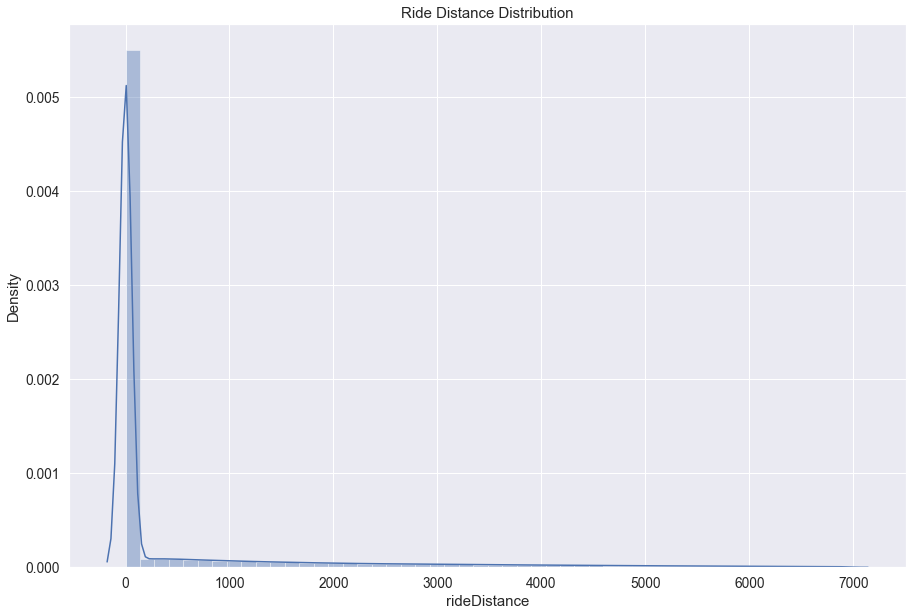

In [ ]:
data = train.copy()
data = data[data['rideDistance'] < train['rideDistance'].quantile(0.99)]
plt.figure(figsize=(15,10))
plt.title("Ride Distance Distribution",fontsize=15)
sns.distplot(data['rideDistance'])
plt.show()

하위 99%의 사람들은 대부분 7km 내로 이동을 하였다.

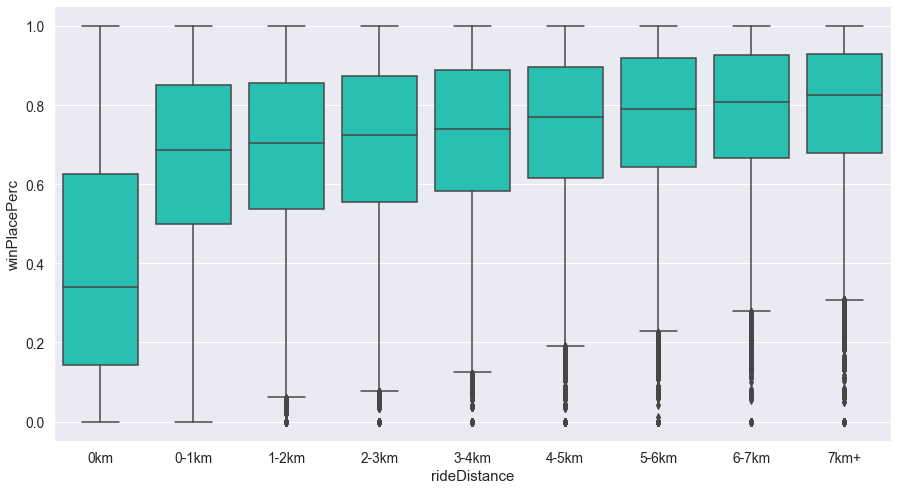

In [ ]:
rideDistance = train.copy()

rideDistance['rideDistance'] = pd.cut(rideDistance['rideDistance'], [-1, 0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 41000], labels=['0km','0-1km', '1-2km', '2-3km', '3-4km','4-5km','5-6km', '6-7km', '7km+'])

plt.figure(figsize=(15,8))
sns.boxplot(x="rideDistance", y="winPlacePerc", data=rideDistance, color='#11D9C5')
plt.show()

*   전혀 차량을 이용하지 않는 부류와 조금이라도 차를 이용한 부류의 지표 차이가 컸다.
*   차량을 이용하지 않고 치킨을 먹은사람이 많다
*   배틀로얄 장르인 배그의 특성상 원 방향에 맞춰 계속 이동해야 하기 때문에 차량을 이용한 이동거리가 올라갈수록 상위권 분포가 많다. + 차량은 차후 엄,은폐용으로 사용이 가능하여 더 많은 변수가 발생하기 때문에 상위권 분포가 많다고 해석하였다

### vehicleDestroys

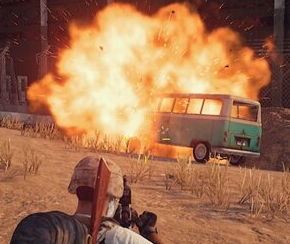

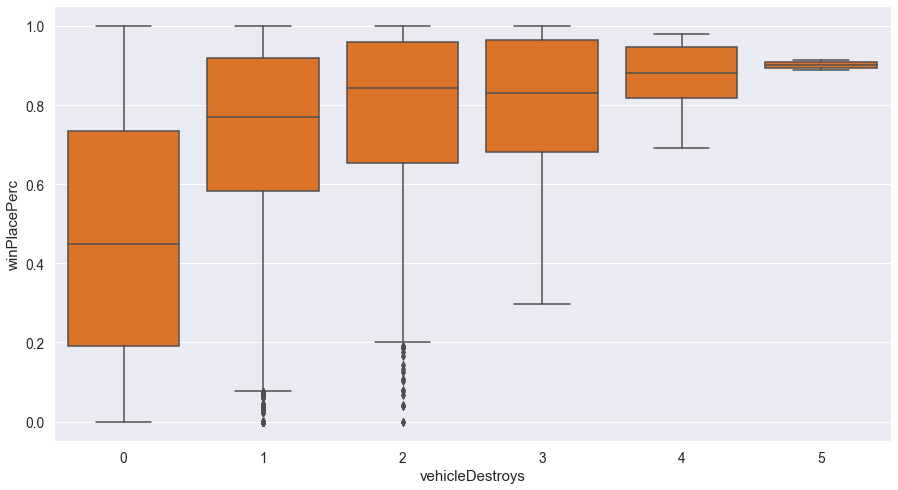

In [ ]:
plt.figure(figsize=(15,8))
sns.boxplot(x='vehicleDestroys', y='winPlacePerc', data=data, color='#F86E0C')
plt.show()

최대 차량 파괴 수는 5대 였으며 전혀 차량을 파괴하지 않는 부류와 1대 이상 차량을 파괴한 부류의 지표 차이가 크다.

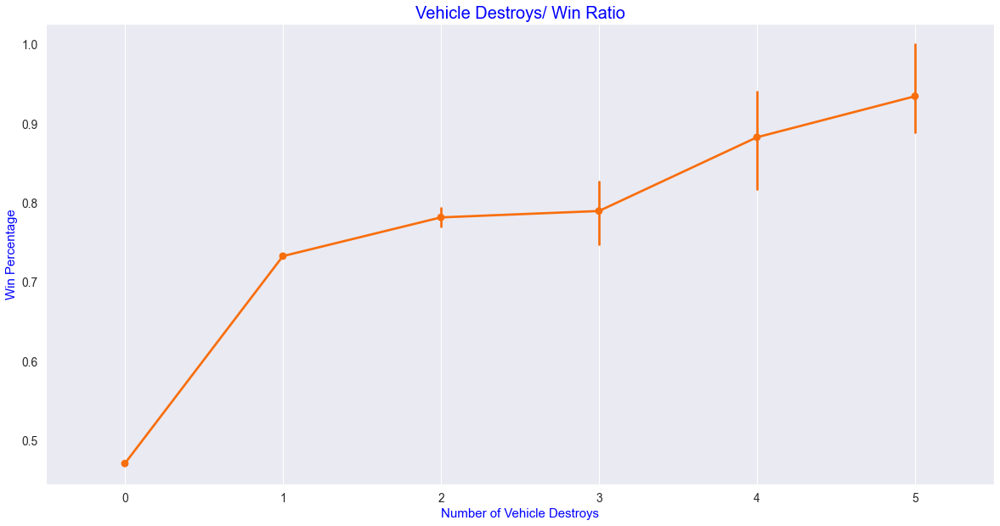

In [ ]:
f,ax1 = plt.subplots(figsize =(20,10))
sns.pointplot(x='vehicleDestroys',y='winPlacePerc',data=train, color='#F86E0C',alpha=0.8)
plt.xlabel('Number of Vehicle Destroys',fontsize = 15,color='blue')
plt.ylabel('Win Percentage',fontsize = 15,color='blue')
plt.title('Vehicle Destroys/ Win Ratio',fontsize = 20,color='blue')
plt.grid()
plt.show()

차량파괴 수에 따라 상위권 분포가 많아진다.

### swimDistance

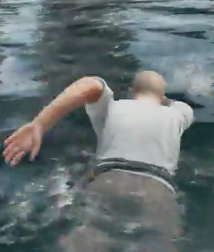

In [ ]:
print("평균 수영 거리는 {:.1f}m, 99% 사람들이 최대 {}m , 수영으로 이동한 최장거리는 {}m.".format(train['swimDistance'].mean(), train['swimDistance'].quantile(0.99), train['swimDistance'].max()))

평균 수영 거리는 4.5m, 99% 사람들이 최대 123.0m , 수영으로 이동한 최장거리는 3823.0m.


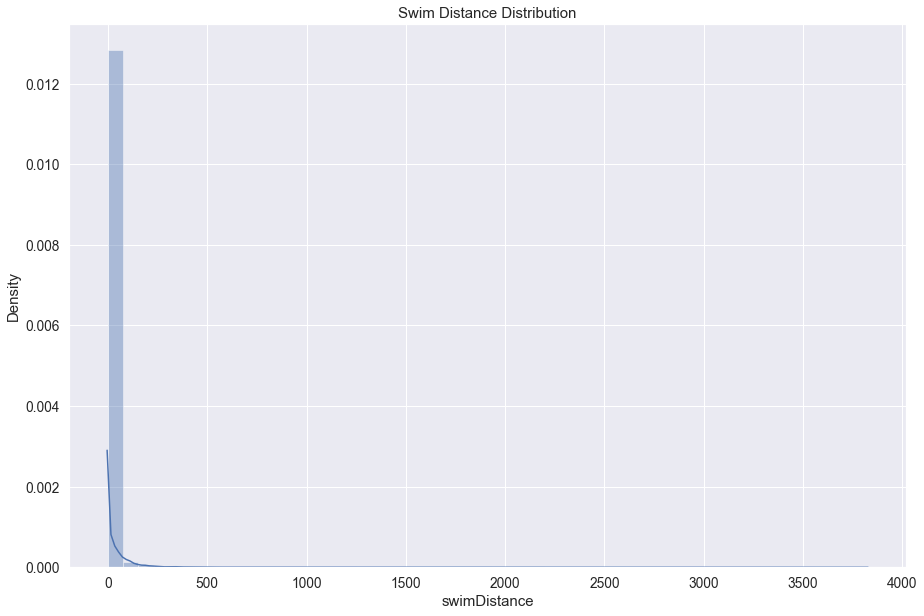

In [ ]:
data = train.copy()
plt.figure(figsize=(15,10))
plt.title("Swim Distance Distribution",fontsize=15)
sns.distplot(data['swimDistance'])
plt.show()

위의 두 이동 지표와 같이 긴 거리를 수영한 사람이 있다.

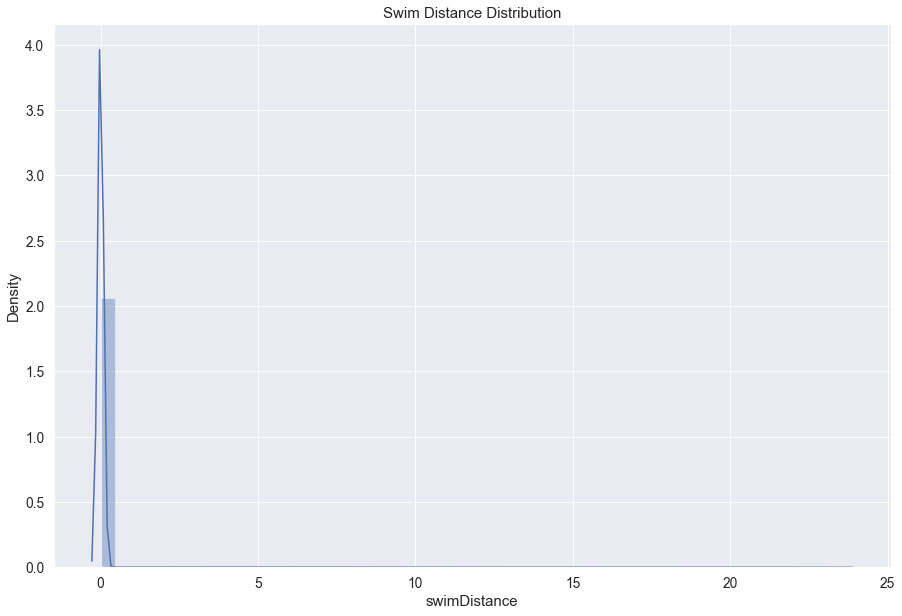

In [ ]:
data = train.copy()
data = data[data['swimDistance'] < train['swimDistance'].quantile(0.96)]
plt.figure(figsize=(15,10))
plt.title("Swim Distance Distribution",fontsize=15)
sns.distplot(data['swimDistance'])
plt.show()

하위 96%의 사람들은 대부분 25m 내로 수영을 하였다.

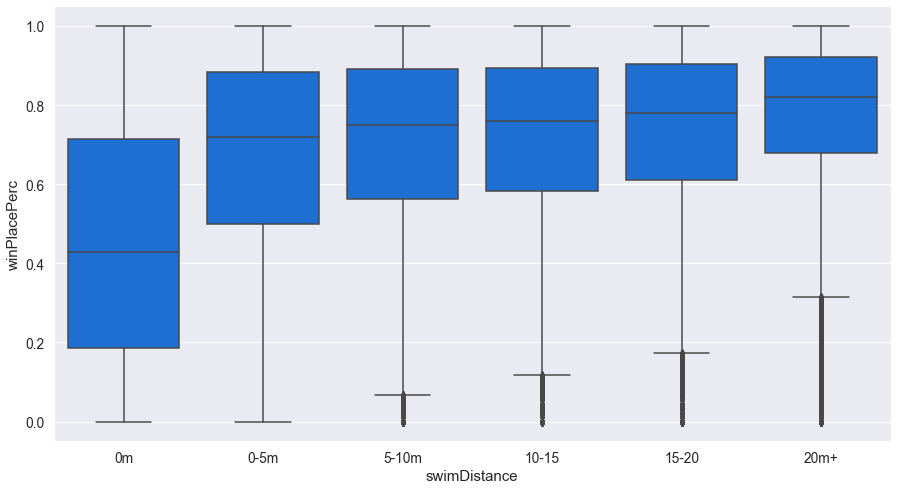

In [ ]:
swim = train.copy()

swim['swimDistance'] = pd.cut(swim['swimDistance'], [-1, 0, 5, 10, 15, 20, 4000], labels=['0m','0-5m', '5-10m', '10-15', '15-20', '20m+'])

plt.figure(figsize=(15,8))
sns.boxplot(x="swimDistance", y="winPlacePerc", data=swim, color='#016AF0')
plt.show()

*   전혀 수영을 하지 않은 부류와 조금이라도 한 부류와의 지표 차이가 크다.
*   수영하는 경우는 적지만 수영을 한 쪽의 분포 평균이 더 높으며, 수영 거리에 따라 상위권 분포가 많아진다.

### heals & boosts

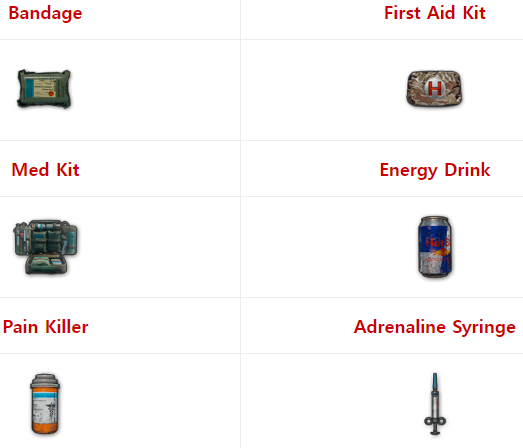

In [ ]:
print("평균적으로 {:.1f} 개의 힐템 사용, 99% 사람들은 최대 {} 개, 최대사용자는 {} 개 사용.".format(train['heals'].mean(), train['heals'].quantile(0.99), train['heals'].max()))
print("평균적으로 {:.1f} 개의 부스트템 사용, 99% 사람들은 최대 {} 개, 최대사용자는 {} 개 사용.".format(train['boosts'].mean(), train['boosts'].quantile(0.99), train['boosts'].max()))

평균적으로 1.4 개의 힐템 사용, 99% 사람들은 최대 12.0 개, 최대사용자는 80 개 사용.
평균적으로 1.1 개의 부스트템 사용, 99% 사람들은 최대 7.0 개, 최대사용자는 33 개 사용.


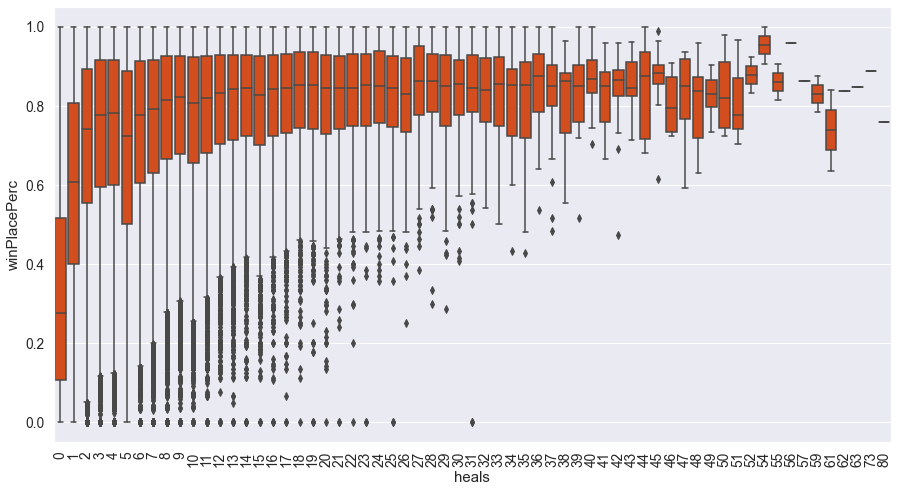

In [ ]:
data = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x='heals',y='winPlacePerc',data=data,color='#F04000')
plt.xticks(rotation=90)
plt.show()

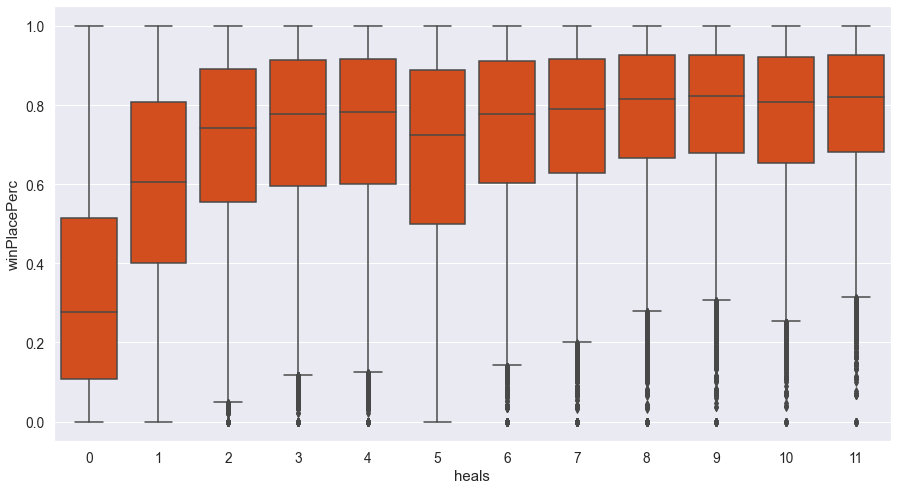

In [ ]:
data = train.copy()
data = data[data['heals'] < data['heals'].quantile(0.99)]

plt.figure(figsize=(15,8))
sns.boxplot(x='heals',y='winPlacePerc',data=data,color='#F04000')
plt.show()

힐 아이템 분포 중 5개에서 지표가 낮아진 후 다시 상승하는 것을 확인하였다.

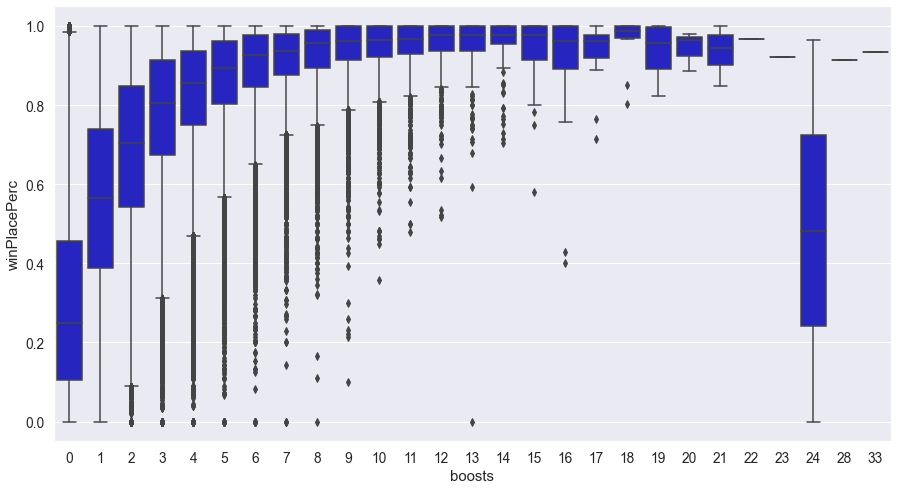

In [ ]:
data = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x='boosts',y='winPlacePerc',data=data,color='#0D0BD9')
plt.show()

부스트 아이템 사용분포는 특이값 제외 고른 분포를 띈다.

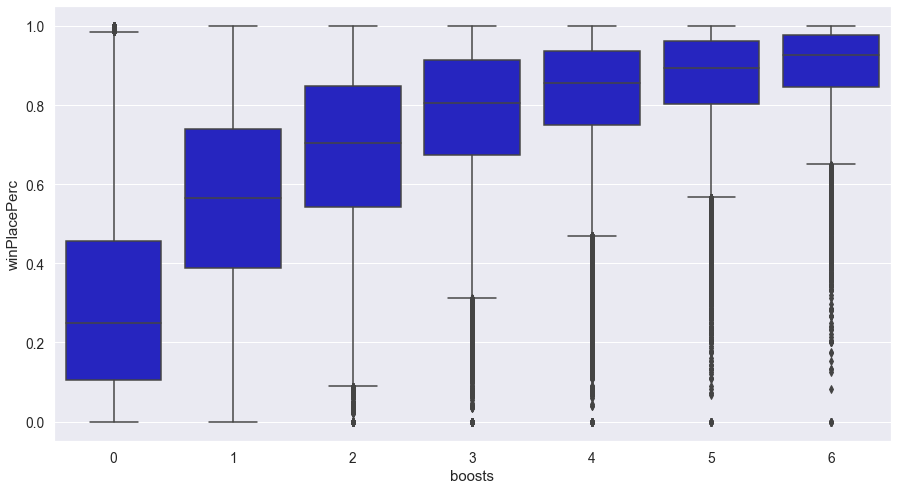

In [ ]:
data = train.copy()
data = data[data['boosts'] < data['boosts'].quantile(0.99)]

plt.figure(figsize=(15,8))
sns.boxplot(x='boosts',y='winPlacePerc',data=data,color='#0D0BD9')
plt.show()



*   힐 및 부스트 아이템을 사용하지 않고 우승한 사람이 있다.
*   힐 및 부스트 아이템 사용이 많아질수록 상위권에 들어갈 확률이 증가한다.



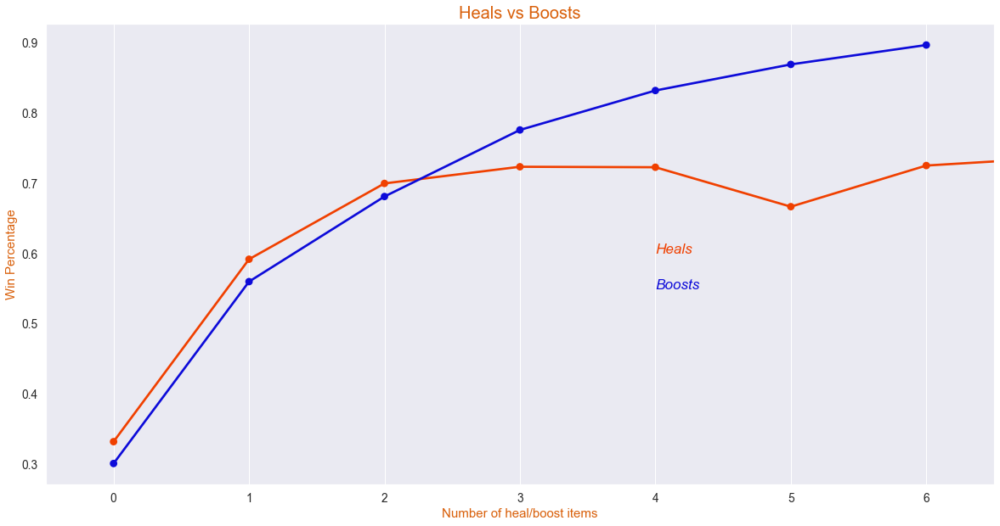

In [ ]:
data = train.copy()
data = data[data['heals'] < data['heals'].quantile(0.99)]
data = data[data['boosts'] < data['boosts'].quantile(0.99)]

f,ax1 = plt.subplots(figsize =(20,10))
sns.pointplot(x='heals',y='winPlacePerc',data=data,color='#F04000',alpha=0.8)
sns.pointplot(x='boosts',y='winPlacePerc',data=data,color='#0D0BD9',alpha=0.8)
plt.text(4,0.6,'Heals',color='#F04000',fontsize = 17,style = 'italic')
plt.text(4,0.55,'Boosts',color='#0D0BD9',fontsize = 17,style = 'italic')
plt.xlabel('Number of heal/boost items',fontsize = 15,color='#D9600B')
plt.ylabel('Win Percentage',fontsize = 15,color='#D9600B')
plt.title('Heals vs Boosts',fontsize = 20,color='#D9600B')
plt.grid()
plt.show()

*   힐 및 부스트 아이템 중 부스트 아이템 사용이 더 많아 보인다.
*   힐 아이템에 비해 부스트 아이템은 타깃값과 더 상관이 있어 보인다.

### weaponsAcquired

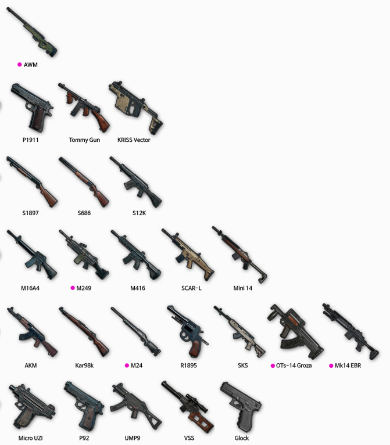

In [ ]:
print("평균 무기 획득 수는 {:.1f} 개, 99% 사람들의 획득 수는 {} 개 , 가장 많은 무기를 획득한 사람은 {} 개.".format(train['weaponsAcquired'].mean(), train['weaponsAcquired'].quantile(0.99), train['weaponsAcquired'].max()))

평균 무기 획득 수는 3.7 개, 99% 사람들의 획득 수는 10.0 개 , 가장 많은 무기를 획득한 사람은 236 개.


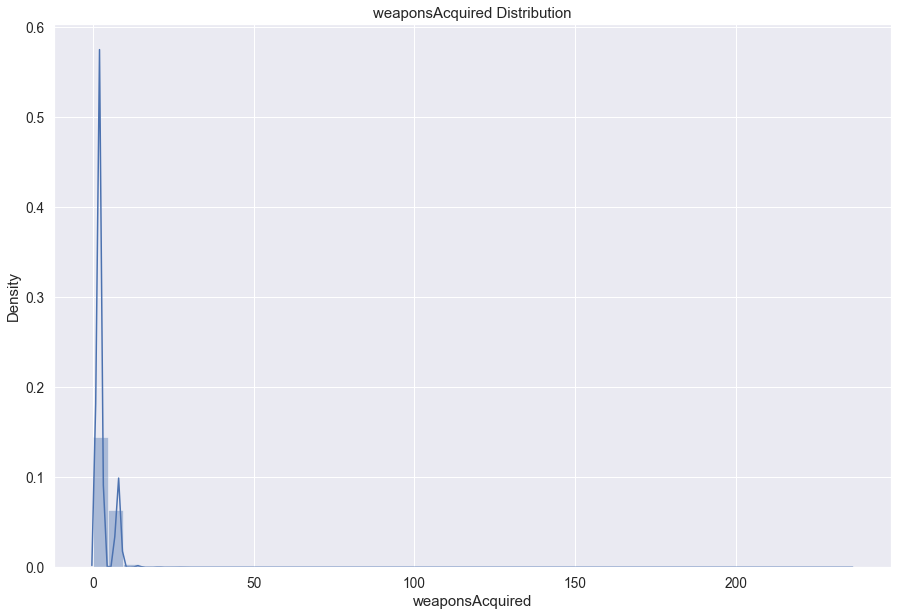

In [ ]:
data = train.copy()
plt.figure(figsize=(15,10))
plt.title("weaponsAcquired Distribution",fontsize=15)
sns.distplot(data['weaponsAcquired'])
plt.show()

많은 무기를 얻은 사람이 있다.

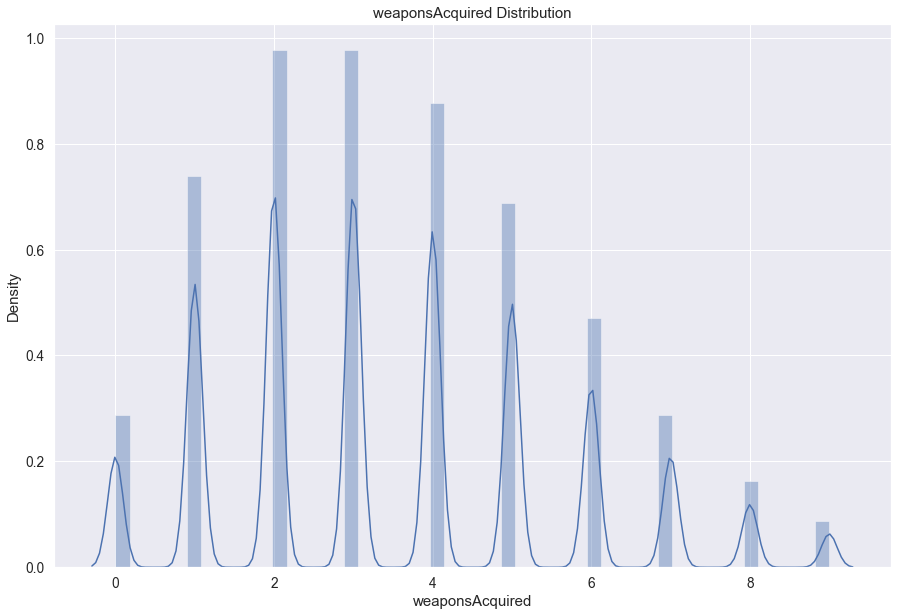

In [ ]:
data = train.copy()
data = data[data['weaponsAcquired'] < train['weaponsAcquired'].quantile(0.99)]
plt.figure(figsize=(15,10))
plt.title("weaponsAcquired Distribution",fontsize=15)
sns.distplot(data['weaponsAcquired'])
plt.show()

하위 99%의 사람들은 9개 내로 무기를 획득하였다.

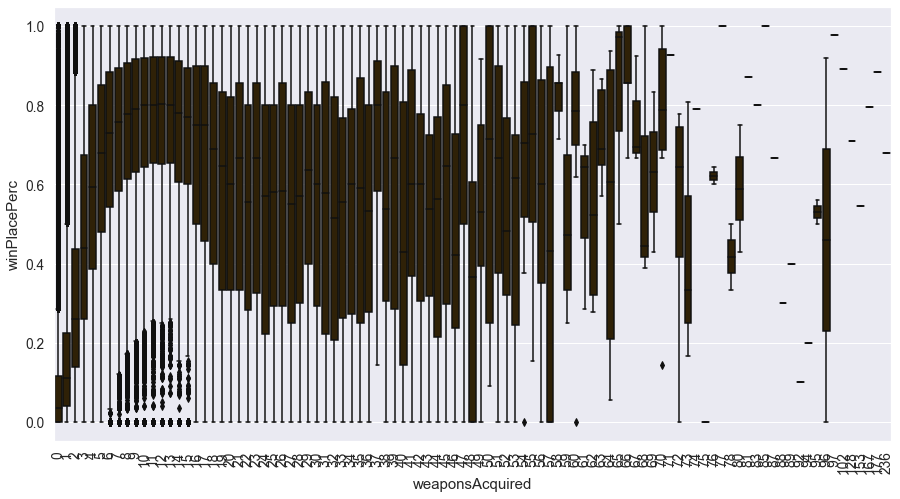

In [ ]:
weaponsAcquired = train.copy()

plt.figure(figsize=(15,8))
sns.boxplot(x="weaponsAcquired", y="winPlacePerc", data=weaponsAcquired ,color='#362300')
plt.xticks(rotation=90)
plt.show()

*   전체적인 무기 획득 수를 시각화 한 결과 특이값의 분포는 넓으나 그 수는 적은 것을 확인할 수 있다.

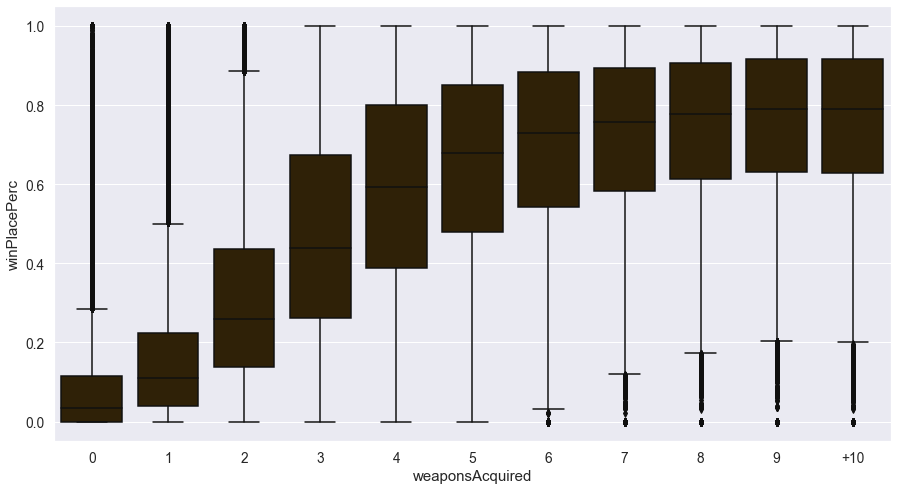

In [ ]:
weaponsAcquired = train.copy()

weaponsAcquired['weaponsAcquired'] = pd.cut(weaponsAcquired['weaponsAcquired'], [-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 237], labels=['0','1', '2', '3', '4', '5', '6', '7', '8', '9', '+10'])
plt.figure(figsize=(15,8))
sns.boxplot(x="weaponsAcquired", y="winPlacePerc", data=weaponsAcquired,color='#362300')
plt.show()

*   2개 이상부터 지표가 크게 좋아짐을 확인할 수 있다.
*   무기 획득량이 많아질수록 상위권에 들어갈 확률이 증가한다.

## 2. 데이터 전처리

### 결측치 제거

In [ ]:
# 결측치 확인
train.isnull().sum()

Id                 0
groupId            0
matchId            0
assists            0
boosts             0
damageDealt        0
DBNOs              0
headshotKills      0
heals              0
killPlace          0
killPoints         0
kills              0
killStreaks        0
longestKill        0
matchDuration      0
matchType          0
maxPlace           0
numGroups          0
rankPoints         0
revives            0
rideDistance       0
roadKills          0
swimDistance       0
teamKills          0
vehicleDestroys    0
walkDistance       0
weaponsAcquired    0
winPoints          0
winPlacePerc       1
dtype: int64

In [ ]:
# 결측치 row 확인
train[train['winPlacePerc'].isnull()]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
2744604,f70c74418bb064,12dfbede33f92b,224a123c53e008,0,0,0.0,0,0,0,1,0,0,0,0.0,9,solo-fpp,1,1,1574,0,0.0,0,0.0,0,0,0.0,0,0,NaN


In [ ]:
# 결측치가 한개뿐이므로 제거
train.drop(train[train['winPlacePerc'].isnull()].index, inplace=True)

In [ ]:
train['_totalDistance'] = train['rideDistance'] + train['walkDistance'] + train['swimDistance']

새로운 피처 'headshot_rate'을 생성하였다. 앞선 EDA결과에서 헤드샷은 대부분의 선수들의 데이터가 0~10% 범위에 몰려있다는 것을 알 수 있다. 그러나 9킬 이상의 헤드샷 비율이 100%인 이상치가 몇몇 존재하였다.

In [ ]:
train['_headshot_rate'] = train['headshotKills'] / train['kills']
train['_headshot_rate'] = train['_headshot_rate'].fillna(0)

### 상식적이지 않은 kill 들 

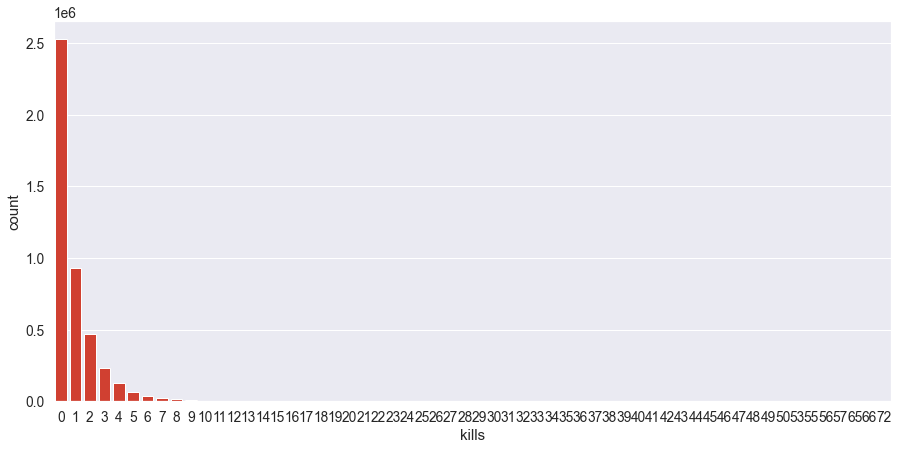

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(data=train, x='kills', color='#EB2B16')
plt.show()

In [ ]:
train[train['kills']>= 14]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
300,9ac54e66c0a5d3,d973f082d6c416,15535f0f9d9e46,1,7,1120.0,8,3,1,1,0,14,3,112.50,1305,squad-fpp,31,29,1649,0,0.0,0,0.0,0,0,3503.0,8,0,1.0000,3503.0,0.214286
1292,919f57a28a5e02,79a34f910375bc,b181e5bc4f0c1d,6,0,1750.0,0,6,2,7,0,15,3,69.88,1034,normal-squad-fpp,8,8,1500,0,1657.0,0,0.0,0,0,1137.0,43,0,0.7143,2794.0,0.400000
2569,7711e1d39407da,a9fbc63469296f,45fc89f9b11eaf,1,4,2325.0,13,8,2,1,1142,21,2,192.10,1376,duo-fpp,49,46,-1,1,2012.0,0,0.0,0,0,2697.0,5,1505,1.0000,4709.0,0.380952
2716,4f12e521916c4f,1b50442f0cbd26,34b035f2eb8aa2,1,7,1240.0,7,3,4,1,1348,14,2,150.10,1973,duo,47,43,-1,2,0.0,0,0.0,0,0,2570.0,6,1484,1.0000,2570.0,0.214286
5589,0fa60dc56fdb16,bba49001a7a90b,1ddf8645b8648a,1,11,2033.0,13,4,7,1,1809,17,2,327.70,1856,duo-fpp,50,47,-1,2,1216.0,0,0.0,0,0,3235.0,8,1572,1.0000,4451.0,0.235294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4434742,22f964eec745e1,49e9c8831f1261,31bb11e90cb889,4,1,1385.0,0,2,12,7,1000,14,2,23.56,569,normal-squad-fpp,8,8,-1,0,109.4,0,0.0,0,0,1732.0,19,1500,0.7143,1841.4,0.142857
4435371,08563711b8a2a3,ef47f31821d67b,d7096d365eb3ef,0,4,1370.0,8,3,1,1,0,14,2,126.40,1290,squad,26,25,1485,1,0.0,0,0.0,0,0,1660.0,4,0,0.9600,1660.0,0.214286
4436193,0fba18a38ff6cf,569a51c52bd366,109cc14379255d,4,0,1487.0,18,3,2,2,1000,18,2,231.60,1195,normal-squad-fpp,14,14,-1,0,0.0,0,0.0,0,0,1250.0,18,1500,1.0000,1250.0,0.166667
4440658,3578bdaac25a0c,1d48e5a9f70ac9,2c37238cad28ee,1,8,936.3,10,3,3,1,1799,14,4,195.90,1834,squad-fpp,28,28,-1,1,326.9,1,0.0,0,0,4549.0,6,1592,1.0000,4875.9,0.214286


In [ ]:
# Drop outlier
train.drop(train[(train['kills'] >= 14)].index, inplace=True)

#### 100% Headshot Kills

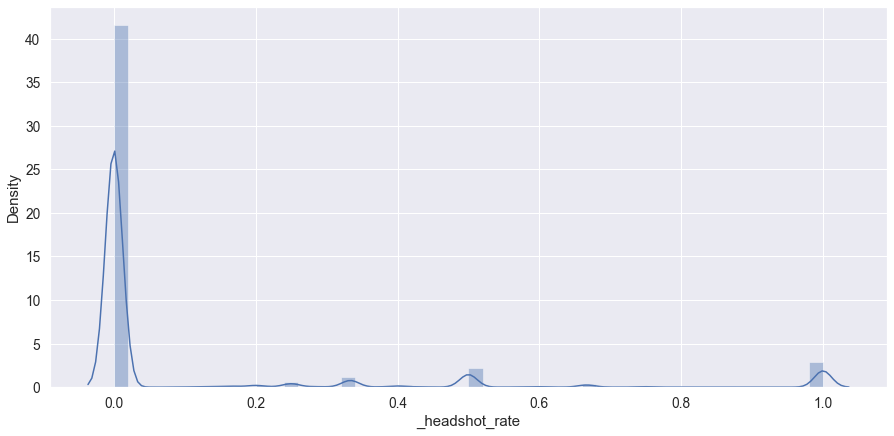

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['_headshot_rate'],kde=True, bins=50)
plt.show()

In [ ]:
print(train[(train['_headshot_rate'] == 1) & (train['kills'] >=10)].shape)
train[(train['_headshot_rate'] == 1) & (train['kills'] >= 10)].head(10)

(20, 31)


,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
281570,ab9d7168570927,add05ebde0214c,e016a873339c7b,2,3,1212.0,8,10,0,1,0,10,4,159.20,1423,squad-fpp,27,25,1564,1,0.0,0,0.0,0,0,2939.0,5,0,0.8462,2939.0,1.0
346124,044d18fc42fc75,fc1dbc2df6a887,628107d4c41084,3,5,1620.0,13,11,3,1,1424,11,2,633.60,1727,squad,27,26,-1,3,4720.0,0,0.0,0,0,3422.0,8,1560,1.0000,8142.0,1.0
871244,e668a25f5488e3,5ba8feabfb2a23,f6e6581e03ba4f,0,4,1365.0,9,13,0,1,1579,13,2,353.80,1255,squad,27,27,-1,0,0.0,0,0.0,0,0,2105.0,5,1587,1.0000,2105.0,1.0
908815,566d8218b705aa,a9b056478d71b2,3a41552d553583,2,5,1535.0,10,10,3,1,1393,10,3,533.20,1838,squad-fpp,28,24,-1,0,5187.0,0,0.0,2,0,2761.0,7,1519,0.9630,7948.0,1.0
963463,1bd6fd288df4f0,90584ffa22fe15,ba2de992ec7bb8,2,6,1355.0,12,10,2,1,1543,10,2,277.00,1417,squad,27,26,-1,0,1018.0,0,0.0,0,0,2458.0,4,1562,1.0000,3476.0,1.0
1079403,1c245ed99b5f96,e42d09a9b8463a,5cec236bce68eb,0,5,1218.0,8,11,3,1,0,11,3,484.90,1821,squad-fpp,28,27,1495,0,5246.0,0,0.0,0,0,2932.0,4,0,1.0000,8178.0,1.0
1167959,c4f80d4be5c561,b4a7892189b5dd,c7f7733ebbd447,0,4,1065.0,6,10,1,1,1391,10,2,222.00,1246,squad-fpp,27,27,-1,0,408.9,0,0.0,0,0,2450.0,7,1468,1.0000,2858.9,1.0
1348164,474a641f0a4bcb,2fdad3ca6fb3c0,114499c82f35d7,1,5,1319.0,11,12,1,1,0,12,2,443.00,1730,squad-fpp,28,28,1560,0,2048.0,0,0.0,0,0,3915.0,5,0,1.0000,5963.0,1.0
1380385,202ce6a55119c5,2df66861f597b4,496700c29a5d44,1,4,1150.0,4,11,1,1,1000,11,3,289.60,1248,duo,46,41,0,1,0.0,0,0.0,0,0,3108.0,7,1500,1.0000,3108.0,1.0
1483199,9d483f7cbb34d4,db5867bc814191,69495e3c478eb9,0,10,1478.0,8,13,2,1,0,13,3,95.14,1379,duo-fpp,49,48,1813,0,0.0,0,140.8,0,0,2339.0,4,0,1.0000,2479.8,1.0


생각보다 100% Headshot Kills 데이터는 괜찮아 보인다. 따라서 추가로 삭제를 하지는 않을 것이다.

#### Longest Kill

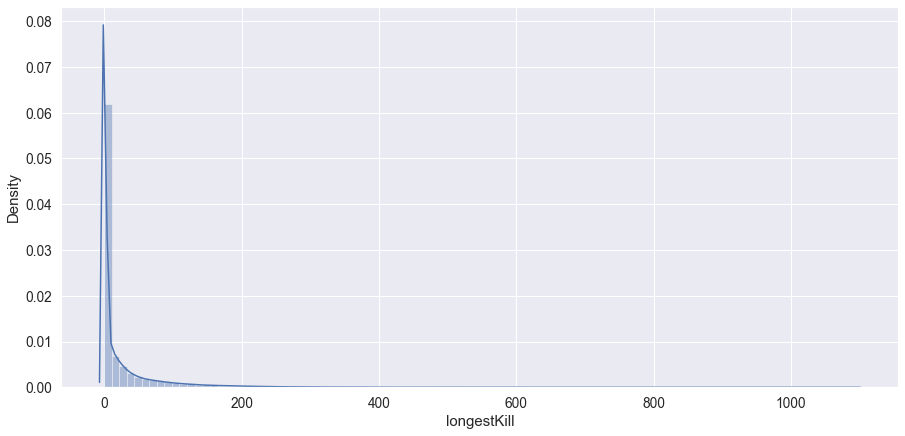

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['longestKill'],kde=True, bins=100)
plt.show()

대부분의 킬이 0~200m 사이에서 이루어 진다 . 허나 1km 이상 거리에서도 킬을 한 선수가 있는데, 이는 핵 유저일 가능성이 있다.

In [ ]:
train[train['longestKill'] >= 1000]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
202281,88e2af7d78af5a,34ddeede52c042,4346bc63bc67fa,0,3,783.9,5,1,1,5,0,4,3,1000.0,1864,squad,27,27,1482,0,723.20,0,0.00,0,1,3052.00,9,0,0.9231,3775.20,0.250000
240005,41c2f5c0699807,9faecf87ab4275,634edab75860b3,5,0,1284.0,8,5,7,18,1000,11,2,1004.0,1308,normal-duo-fpp,14,13,-1,1,0.00,0,0.00,0,0,48.87,38,1500,0.5385,48.87,0.454545
324313,ef390c152bcc3d,30fd444be3bbc1,4f7f8d6cf558b4,2,0,1028.0,0,0,0,9,0,10,2,1026.0,698,normal-squad-fpp,13,13,1500,0,1717.00,0,0.00,0,0,1264.00,26,0,1.0000,2981.00,0.000000
523088,1ff9763ca30279,7fb3a83ebb050d,838cb9a3c94598,0,0,151.2,0,0,0,45,0,1,1,1081.0,1195,normal-squad-fpp,8,8,1500,0,0.00,0,0.00,0,0,0.00,3,0,0.7143,0.00,0.000000
803632,4e7e6c74e3c57d,94698690918933,da91b0c3d875f8,0,0,196.8,0,0,0,51,0,1,1,1075.0,471,normal-squad-fpp,8,8,1500,0,2085.00,0,0.00,0,0,1074.00,22,0,0.0000,3159.00,0.000000
895411,1f5ba6e0cfb968,512ea24b831be3,5fb0d8b1fc16cf,4,0,1012.0,11,5,0,5,0,10,3,1094.0,1021,normal-squad-fpp,12,12,1500,0,0.00,0,0.00,0,0,569.50,18,0,0.9091,569.50,0.500000
996713,f4082eee4c45e9,4d02ce950f74fc,838cb9a3c94598,1,0,916.4,0,0,0,17,0,10,2,1072.0,1195,normal-squad-fpp,8,8,1500,0,0.00,0,0.00,4,0,0.00,15,0,1.0000,0.00,0.000000
1172437,303a93cfa1f46c,8795d39fd0df86,9c8962b58bb3e3,2,1,329.3,0,0,2,45,1000,3,1,1037.0,581,normal-squad-fpp,8,7,-1,0,0.00,0,0.00,0,0,832.50,9,1500,0.2857,832.50,0.000000
2015559,5ff0c1a9fab2ba,2d8119b1544f87,904cecf36217df,3,3,1302.0,0,6,5,15,0,11,2,1037.0,1794,normal-squad-fpp,11,11,1500,0,0.00,0,0.00,0,0,133.20,43,0,0.6000,133.20,0.545455
2152425,4b9f61bac5eb0a,bc717b964f3bbe,838cb9a3c94598,3,0,945.4,0,0,0,11,0,13,3,1071.0,1195,normal-squad-fpp,8,8,1500,0,0.00,0,0.00,0,0,844.70,14,0,0.5714,844.70,0.000000


In [ ]:
# Drop
train.drop(train[train['longestKill'] >= 1000].index, inplace=True)

#### Road Kills

In [ ]:
# 10 roadKills 이상 플레이어
train[train['roadKills'] > 10]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
2767999,34193085975338,bd7d50fa305700,a22354d036b3d6,0,0,1102.0,0,0,0,1,1497,11,11,0.0,1946,solo,88,77,-1,0,4118.0,11,0.0,0,0,816.6,5,1533,0.4713,4934.6,0.0


Id 'c3e444f7d1289f' 는 rideDistance가 5m 정도밖에 되지 않지만 Road Kill로 14명을 죽였다. 이는 현실적으로 불가능한 수치이므로 제거해준다.

In [ ]:
train.drop(train[train['roadKills'] > 10].index, inplace=True)

#### Assists 이상치 탐지

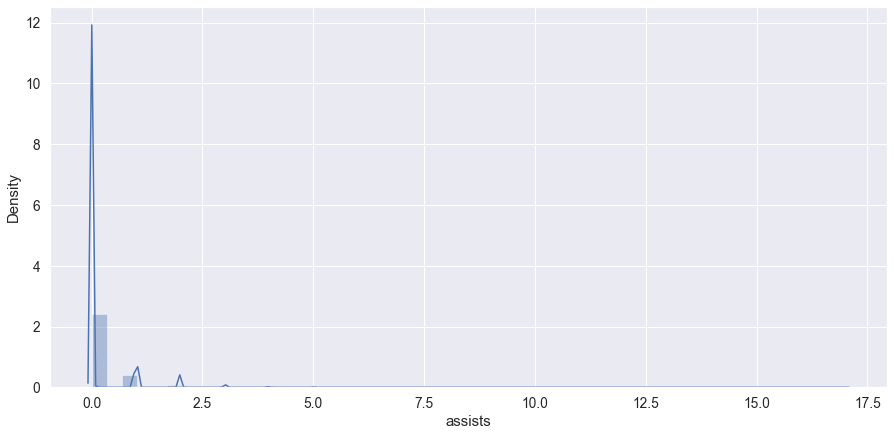

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['assists'],kde=True, bins=50)
plt.show()

In [ ]:
display(train[train['assists'] >= 6].shape)
train[train['assists'] >= 6].head(10)

(1376, 31)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
1073,369b4932998e83,192b806188130d,4b41a67d8cf811,6,8,743.1,5,0,4,2,0,5,2,247.30,1779,squad,29,28,1577,1,3486.0,0,253.1,0,0,2309.0,9,0,1.0000,6048.1,0.000000
12730,e5cf91309cf283,259614e2b26f1e,36f099f467c5c6,8,0,2069.0,21,6,12,7,0,13,2,150.20,1145,normal-squad-fpp,7,7,1500,0,0.0,0,0.0,0,0,534.0,25,0,0.8333,534.0,0.461538
17509,74177ba1e87a5c,69e041d7c2e90d,a04d064c6573f1,6,0,832.5,0,0,1,10,0,7,2,54.57,1185,normal-squad-fpp,4,3,1500,0,0.0,0,0.0,0,0,162.6,24,0,0.3333,162.6,0.000000
26373,1072a57d89ab45,baa7bd82c46c73,a6ccf1988fe064,6,4,323.5,1,0,3,45,0,0,0,0.00,1922,squad-fpp,30,30,1500,2,2871.0,0,0.0,0,0,2521.0,4,0,0.9655,5392.0,0.000000
37903,a2144881853854,c8cb8491112bf6,0104eeb664494d,8,0,755.1,7,2,0,24,1000,8,2,125.00,1091,normal-squad-fpp,6,6,-1,1,1058.0,0,0.0,0,0,1585.0,34,1500,0.6000,2643.0,0.250000
46669,3792e21c792180,35bf65cf66f881,559340741e58bb,6,5,855.0,7,1,0,3,0,7,1,157.80,1690,squad,29,28,1565,1,2123.0,0,0.0,0,0,4078.0,7,0,1.0000,6201.0,0.142857
55109,fd4b4346d4a036,65c424e1cefa4b,ed852cbf0a5133,6,3,488.8,3,0,2,8,1484,3,1,74.82,1386,squad,29,29,-1,1,0.0,0,0.0,0,0,2943.0,7,1525,1.0000,2943.0,0.000000
59352,3dc12ae3669b5b,a5bfc95ad5dba2,6ee2c835176181,7,0,1055.0,13,2,1,4,0,13,2,111.00,911,normal-squad-fpp,6,6,1500,1,2147.0,0,0.0,0,0,1227.0,28,0,0.6000,3374.0,0.153846
60421,12276b887525ea,e0387c553b134e,bedec7a969a4de,7,5,253.6,1,0,9,10,0,2,1,126.00,1337,squad-fpp,25,24,1825,3,0.0,0,0.0,0,0,3742.0,3,0,1.0000,3742.0,0.000000
62719,4a06f7f6fa864f,f4009cdd054dbb,2a52a859e38f28,6,5,227.2,2,1,16,24,0,1,1,90.39,1380,squad-fpp,28,28,1588,1,217.7,0,0.0,0,0,4232.0,6,0,0.9630,4449.7,1.000000


In [ ]:
# Remove outliers
train.drop(train[train['assists'] >= 6].index, inplace=True)

### 움직임(walk, ride, swim) 이상치 탐지

In [ ]:
train[['walkDistance', 'rideDistance', 'swimDistance']].describe().T

,count,mean,std,min,25%,50%,75%,max
walkDistance,4442923.0,1153.405939,1182.899393,0.0,155.0,684.8,1975.0000,25780.0
rideDistance,4442923.0,605.709253,1497.984409,0.0,0.0,0.0,0.1123,40710.0
swimDistance,4442923.0,4.509933,30.500178,0.0,0.0,0.0,0.0000,3823.0


#### walkDistance 이상치 탐지

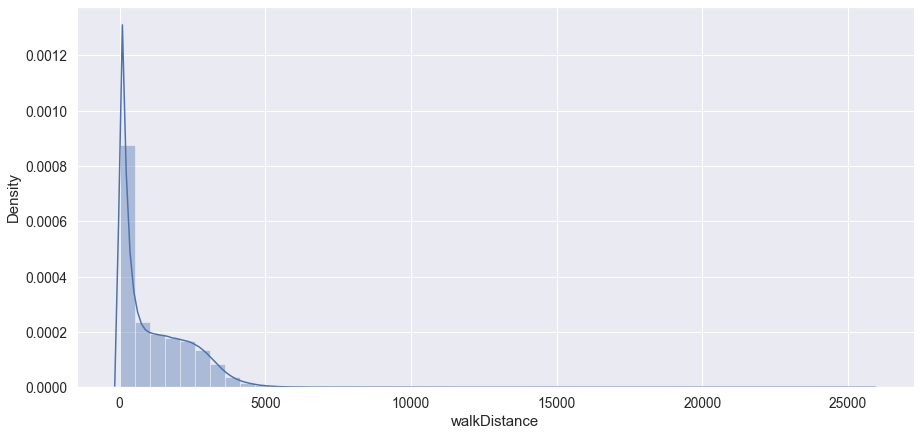

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['walkDistance'],kde=True, bins=50)
plt.show()

In [ ]:
train[(train['walkDistance'] >= 7000) & (train['kills'] == 0)]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
4942,55bdaf3722ba29,c42f9d608bacf9,b9180fc0b665c5,0,2,0.00,0,0,6,54,0,0,0,0.0,1884,solo-fpp,95,93,1524,0,0.0283,0,67.35,0,0,9325.0,3,0,0.6915,9392.3783,0.0
5199,e09430aff80b73,a7670f0aeb2259,45b0a0cf5e014d,0,0,21.54,0,0,1,63,1175,0,0,0.0,1874,squad,30,30,0,0,0.0348,0,470.80,0,0,7155.0,3,1544,0.4828,7625.8348,0.0
8760,5b342502229901,901cbeb065a18a,d0fa7e63daa3ba,0,4,49.30,0,0,0,51,1106,0,0,0.0,1448,squad-fpp,28,27,-1,0,0.0040,0,30.19,0,0,7352.0,4,1519,0.8889,7382.1940,0.0
12579,2f7629a6d8dd69,3129d0cbd055b2,9858c75dbbb4df,0,2,52.26,0,0,5,40,0,0,0,0.0,1908,solo,99,90,2015,0,1912.0000,0,17.19,0,0,7313.0,2,0,0.9694,9242.1900,0.0
13699,f010bf756b3ad4,105d235ea915cb,4411fd7991f968,0,1,0.00,0,0,0,43,0,0,0,0.0,1865,duo-fpp,50,48,1512,0,1701.0000,0,63.16,0,0,8767.0,4,0,0.7959,10531.1600,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4424347,9612c1eba5b394,8fb1f633a0725f,2cdae31ee18601,0,2,0.00,0,0,6,49,0,0,0,0.0,1896,duo-fpp,48,46,1500,0,0.0450,0,35.79,0,0,8312.0,8,0,0.6170,8347.8350,0.0
4426318,e5e779fe07b70d,e44f24df4a8f14,c1c64ed04aea47,0,0,29.64,0,0,0,60,0,0,0,0.0,1869,solo-fpp,96,94,1499,0,0.0270,0,43.88,0,0,8111.0,3,0,0.6105,8154.9070,0.0
4430073,6cde307e4081a7,57c88e15f79af3,5b66793e5c260f,0,1,0.00,0,0,1,58,1146,0,0,0.0,1821,squad-fpp,27,27,-1,0,0.0175,0,12.75,0,0,9487.0,4,1455,0.6154,9499.7675,0.0
4439434,82387aec17209e,f710cc8626b879,2ec09aa461eec2,0,0,0.00,1,0,3,53,0,0,0,0.0,1861,duo-fpp,49,46,1491,1,229.9000,0,169.40,0,0,8227.0,2,0,0.6042,8626.3000,0.0


In [ ]:
# Drop
train.drop(train[(train['walkDistance'] >= 7000)].index, inplace=True)

#### rideDistance 이상치 감지

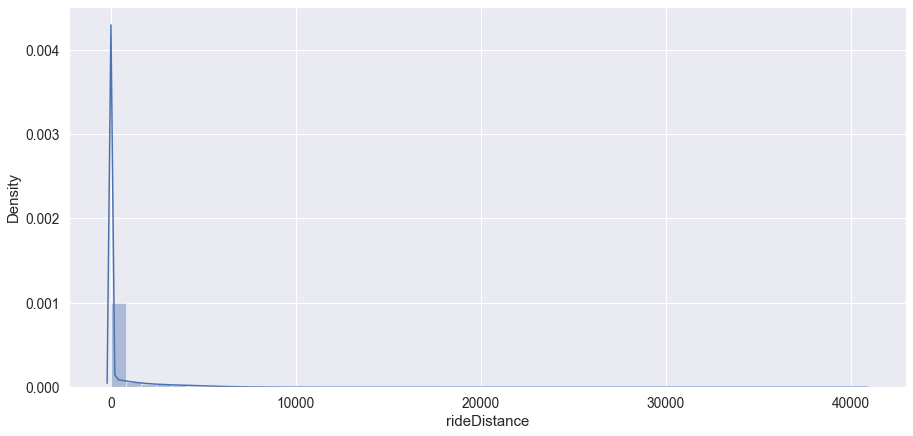

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['rideDistance'],kde=True, bins=50)
plt.show()

In [ ]:
train[(train['rideDistance'] >= 12000) & (train['kills'] == 0)]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
4906,8f05e600c7c8b8,560528edc46d1f,48167b9435e7c1,0,2,16.22,0,0,2,48,1132,0,0,0.0,1816,squad-fpp,29,26,-1,0,17210.0,0,0.00,0,0,624.10,3,1520,0.7500,17834.10,0.0
5316,719b9c10db9045,ab5753225048e7,f44ae2a7f7fde9,0,2,25.17,0,0,0,70,0,0,0,0.0,1965,squad,29,28,1481,0,12880.0,0,0.00,0,0,1563.00,4,0,0.3929,14443.00,0.0
16895,6da7b6c5cda276,d2982ffa6a2a3c,f5ec4d90b83c91,0,0,7.53,0,0,0,40,1047,0,0,0.0,1779,solo-fpp,87,85,0,0,15540.0,0,0.00,0,0,635.40,3,1500,0.9419,16175.40,0.0
17372,644e0e7633224a,ae784c975736f1,5901af9536872b,0,2,0.00,0,0,1,47,0,0,0,0.0,1888,duo-fpp,47,45,1629,0,12630.0,0,0.00,0,0,984.60,5,0,0.6957,13614.60,0.0
25437,7390e4fc2da7e5,e97c10b405d4b8,bae6e161c230e1,0,2,0.00,1,0,1,60,0,0,0,0.0,1996,squad-fpp,27,26,1504,0,13180.0,0,11.08,0,0,954.90,3,0,0.5769,14145.98,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4423086,585fa337ba26ac,d7b32b8a43a0d7,559dac9580b92a,0,6,73.83,0,0,5,49,0,0,0,0.0,1829,squad-fpp,29,29,1465,1,12180.0,0,0.00,0,0,2776.00,6,0,0.8571,14956.00,0.0
4433501,4848d7f25f77a4,7d106844828a79,6c50619bf6aeaa,1,1,30.13,0,0,2,41,0,0,0,0.0,1849,squad,27,26,1500,0,12050.0,0,0.00,0,0,1104.00,3,0,0.9231,13154.00,0.0
4434681,9bee8c493f613e,03bf6f1f21c1ae,c46a9dd9acb773,0,2,38.19,0,0,5,48,0,0,0,0.0,1892,duo-fpp,49,48,1464,0,12320.0,0,0.00,0,0,1912.00,4,0,0.8125,14232.00,0.0
4434872,2fae64ad4774c5,0cb91df424dca0,fab0eaec927962,0,2,136.00,0,0,7,43,0,0,0,0.0,1884,squad-fpp,28,27,1533,0,12850.0,0,0.00,0,0,2211.00,5,0,0.9630,15061.00,0.0


In [ ]:
# 걸은 거리는 없지만 rideDistance는 있고 kill도 있는 겅우
train[(train['walkDistance'] == 0) & (train['rideDistance'] > 0) & (train['kills'] > 0)]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
219621,49e86bcbb74918,5bf4ac7f5f89a0,05a97d10e3cf81,0,0,100.00,1,0,0,38,0,1,1,2.150,1979,squad,26,26,1465,0,673.10,1,0.0,0,0,0.0,0,0,0.0000,673.10,0.0
1051447,c43116d1c3d4e5,bd09c97b67800a,aad60eee7eeb79,0,0,102.20,0,0,0,34,1320,1,1,4.489,1935,solo,89,85,-1,0,1757.00,1,0.0,0,0,0.0,0,1532,0.1250,1757.00,0.0
1053213,4a8011f19b0e0e,037c89b0cef255,238171821a1d0e,1,0,100.00,1,0,0,38,1621,1,1,1.440,1881,duo-fpp,48,45,-1,0,36.24,0,0.0,0,0,0.0,0,1747,0.0638,36.24,0.0
1166930,553f199b5538c5,560c2ba9dcbbd0,afb05e37d884fc,2,0,168.50,1,0,0,45,1398,1,1,3.268,1799,squad,31,29,-1,0,391.80,1,0.0,0,0,0.0,0,1499,0.0667,391.80,0.0
1479750,bcdf0f6c5d08bf,ea2ed2cc5955dd,2b59ed013eaf15,0,0,100.00,1,0,0,46,0,1,1,3.744,1882,duo-fpp,50,47,1509,0,468.30,1,0.0,0,0,0.0,0,0,0.0612,468.30,0.0
2221273,a280df87d394fc,61042f8c96538c,a0e8fe0599288c,0,0,100.00,1,0,0,37,0,1,1,4.656,1982,duo,47,44,1506,0,534.50,1,0.0,0,0,0.0,0,0,0.1522,534.50,0.0
2382410,adbda59d2f11cd,343d453ffb18c8,cbb5f864c6f532,0,0,100.00,1,0,0,43,0,1,1,1.564,1807,squad,26,22,1530,0,262.70,1,0.0,0,0,0.0,0,0,0.0000,262.70,0.0
2471705,b968373063f5a8,536e9c19659ce8,61c90034dc8174,0,0,93.47,1,0,0,38,0,1,1,3.395,1758,squad-fpp,29,26,1500,0,1360.00,1,0.0,0,0,0.0,0,0,0.1429,1360.00,0.0
2907639,2bf1d34142358b,71c15011651348,08dfa30b9390f7,4,0,578.00,0,0,6,30,0,3,1,17.720,1007,normal-squad-fpp,6,6,1500,0,1277.00,0,0.0,0,0,0.0,29,0,0.4000,1277.00,0.0
3778837,ca3ca72549b07f,68a0c84f3b09aa,f72f06cafb3349,0,0,144.30,2,0,0,20,1183,2,1,5.206,1785,squad,28,26,-1,0,415.40,0,0.0,0,0,0.0,0,1496,0.0000,415.40,0.0


In [ ]:
# totalDistance == 0
train[(train['_totalDistance'] == 0)]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
29,ac5b57ff39979c,857cc55b2b6001,e019e04dee4f19,0,0,0.0,0,0,0,87,0,0,0,0.0,1530,duo,46,44,1534,0,0.0,0,0.0,0,0,0.0,0,0,0.0000,0.0,0.0
116,6adb021f5165ff,58e5500bd40898,de5c692fe25a73,0,0,0.0,0,0,0,68,311,0,0,0.0,1414,duo,41,36,0,0,0.0,0,0.0,0,0,0.0,0,847,0.0000,0.0,0.0
151,a2bbe20aa8789d,926e8a09bab249,e36e4203ed4831,0,0,0.0,0,0,0,92,309,0,0,0.0,1377,duo,48,41,-1,0,0.0,0,0.0,0,0,0.0,0,765,0.0000,0.0,0.0
237,baaa694658e085,d034728f22cff7,fa71620624d3e7,0,0,0.0,0,0,0,94,1397,0,0,0.0,1358,squad-fpp,29,26,-1,0,0.0,0,0.0,0,0,0.0,0,1510,0.0000,0.0,0.0
283,3ab8128e6bcbe6,bb52a209f2e938,aabd2650b129e2,0,0,0.0,0,0,0,84,0,0,0,0.0,1797,duo,48,47,1500,0,0.0,0,0.0,0,0,0.0,0,0,0.1277,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446843,56f1ff8594a328,63008ee9676bc3,b3f07953e112dc,0,0,0.0,0,0,0,99,0,0,0,0.0,1902,squad,30,30,1456,0,0.0,0,0.0,0,0,0.0,0,0,0.0000,0.0,0.0
4446849,19d2b52c9e17a3,f8a952ce9ab7aa,2afb2889026133,0,0,0.0,0,0,0,90,1243,0,0,0.0,1472,solo-fpp,98,93,-1,0,0.0,0,0.0,0,0,0.0,0,1363,0.0412,0.0,0.0
4446905,f93dfebceecc59,c54ca5bb9df107,e1da3a1ee799ef,0,0,0.0,0,0,0,89,0,0,0,0.0,1371,duo-fpp,49,48,1465,0,0.0,0,0.0,0,0,0.0,1,0,0.0417,0.0,0.0
4446926,e0c791ea3c4644,e18240dcce54f9,827639896a20cb,0,0,0.0,0,0,0,87,526,0,0,0.0,1811,squad,29,29,-1,0,0.0,0,0.0,0,0,0.0,0,916,0.0000,0.0,0.0


In [ ]:
# 위 항목들 Drop 
train.drop(train[(train['rideDistance'] >= 12000) & (train['kills'] == 0)].index, inplace = True)
train.drop(train[(train['walkDistance'] == 0) & (train['rideDistance'] > 0) & (train['kills'] > 0)].index, inplace = True)
train.drop(train[(train['_totalDistance'] == 0)].index, inplace=True)

#### Swim Distance 이상치 감지

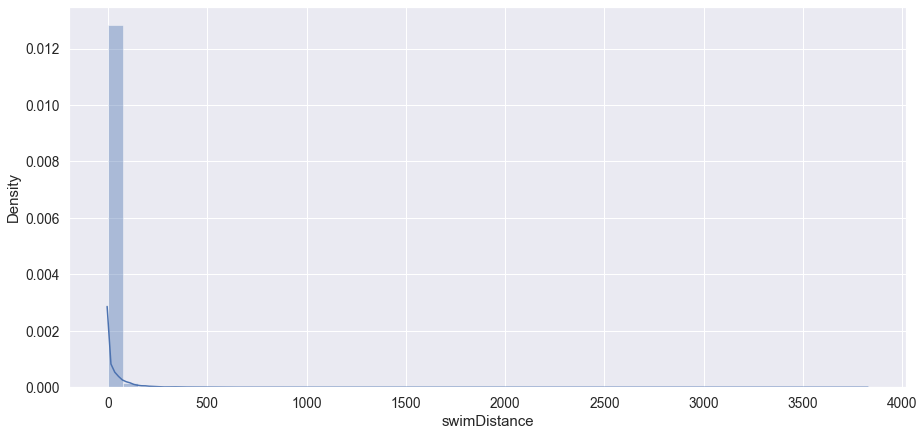

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['swimDistance'],kde=True, bins=50)
plt.show()

In [ ]:
train[train['swimDistance'] >= 1000]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
18533,d8347ac3222087,4e44ea4cdee2bd,acacd3019c559e,0,0,0.0000,0,0,0,49,0,0,0,0.000,1852,solo-fpp,96,90,1633,0,6672.0000,0,1171.0,0,0,914.000,2,0,0.8000,8757.0000,0.000000
22118,07f9b9d5902fb2,b295dcb7e8d9c1,6fbad77aefbcdf,0,0,0.0000,0,0,0,45,0,0,0,0.000,1805,squad-fpp,30,27,1441,0,0.0000,0,1220.0,0,0,2069.000,6,0,0.7241,3289.0000,0.000000
103053,de97d36ac07819,974c4035331f4c,a406a18fed67e0,0,3,228.7000,0,1,0,30,1506,1,1,0.000,1364,squad-fpp,29,29,-1,0,0.0000,0,1233.0,0,0,968.000,4,1551,0.8929,2201.0000,1.000000
136470,6bb82b3868591a,b8d975f6740b64,8c7212b87b1d67,1,1,179.5000,0,0,1,39,0,0,0,0.000,1320,duo,48,45,1570,0,0.0000,0,1205.0,0,0,1202.000,4,0,0.9362,2407.0000,0.000000
154451,3795c59bfff6cd,585a9adfeb6c30,a3ccbc309208d3,0,0,0.0000,0,0,0,43,1183,0,0,0.000,1337,squad-fpp,28,25,-1,0,0.0000,0,1315.0,0,0,3.209,0,1557,0.8889,1318.2090,0.000000
166685,af563d0085a536,a5b9e8492789e3,7d58954d409084,0,0,7.9580,0,0,0,58,1335,0,0,0.000,1779,squad-fpp,28,28,-1,0,465.0000,0,1441.0,0,0,2084.000,0,1527,0.5556,3990.0000,0.000000
177973,c2e9e5631f4e54,23213058f83abe,f01eb1073ef377,0,5,78.1200,1,0,1,47,1058,0,0,0.000,1399,duo-fpp,50,46,-1,0,0.0000,0,2295.0,0,0,1002.000,4,1466,0.9592,3297.0000,0.000000
190924,a3693a2bd45462,a867fb13d854dc,a177478770b22e,0,0,0.0000,0,0,0,58,1143,0,0,0.000,1856,duo-fpp,47,46,-1,0,0.0000,0,1320.0,0,0,245.000,0,1553,0.4783,1565.0000,0.000000
211488,b300ef80c76d38,6cbbef46138fb1,56c871fc94991b,0,4,10.2100,0,0,10,44,1004,0,0,0.000,1819,solo-fpp,92,91,-1,0,1142.0000,0,1108.0,0,0,2080.000,6,1485,0.8791,4330.0000,0.000000
243958,01d4ec0809a172,39782c2875e39a,93a913dba94ce5,0,2,444.1000,3,1,3,3,0,5,3,32.070,1468,squad-fpp,27,26,1526,0,0.0000,0,1196.0,0,0,1865.000,8,0,1.0000,3061.0000,0.200000


In [ ]:
# drop outliers
train.drop(train[train['swimDistance'] >= 1000].index, inplace=True)

### WeaponAcquired 이상치 탐지

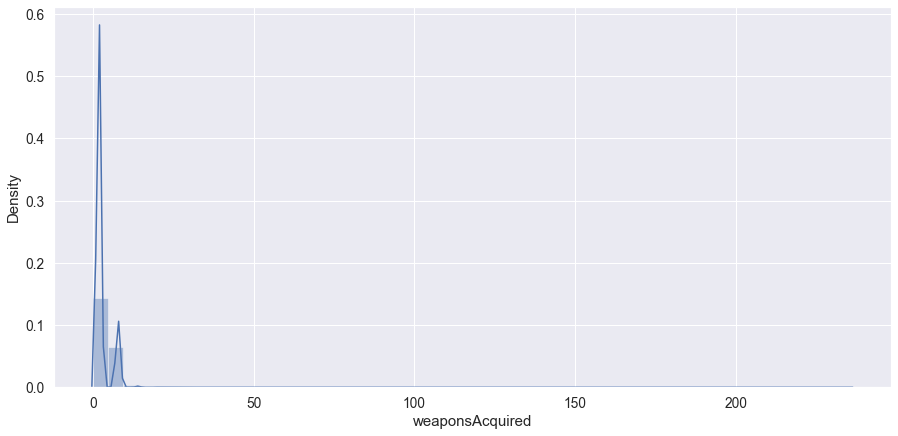

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['weaponsAcquired'],kde=True, bins=50)
plt.show()

In [ ]:
display(train[train['weaponsAcquired'] >= 25].shape)
train[train['weaponsAcquired'] >= 25].head()

(944, 31)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
2769,89120d2f4e44e0,fa54efeb11b8a6,662c9c7f9e87d0,4,0,970.5,6,4,17,4,1000,11,2,21.61,1263,normal-duo,7,7,-1,2,0.00,0,0.0,0,0,90.79,28,1500,1.0000,90.79,0.363636
14404,504befe1cc25e2,6dcd8c5ad01853,313c9787226bbe,1,0,829.1,9,4,5,35,0,7,1,21.77,1198,normal-squad-fpp,7,7,1500,0,0.00,0,0.0,0,0,1742.00,28,0,0.6667,1742.00,0.571429
18041,5eee942f2b6d79,325464bcf4c846,f3a64f99badeca,0,0,198.0,0,0,0,4,0,0,0,0.00,1659,solo,19,1,1500,0,81.13,0,0.0,0,0,776.50,28,0,0.0000,857.63,0.000000
27212,71adcdb8e44c57,f4691a35043c57,5360762aa9fe02,0,0,0.0,0,0,0,49,0,0,0,0.00,897,normal-squad-fpp,13,12,1500,0,4084.00,0,0.0,0,0,1217.00,36,0,0.0000,5301.00,0.000000
40459,597224ce497a1f,69aa66174e3b77,70f54c8eb2404b,4,0,881.9,0,1,0,19,0,10,2,61.04,754,normal-squad-fpp,7,7,1500,0,0.00,0,0.0,0,0,74.20,29,0,0.6667,74.20,0.100000


In [ ]:
# Remove outliers
train.drop(train[train['weaponsAcquired'] >= 25].index, inplace=True)

### Heals 이상치 탐지

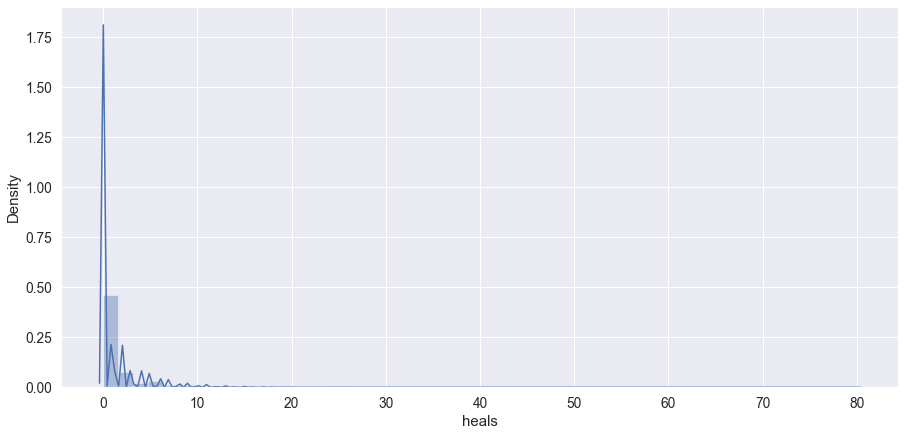

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['heals'],kde=True, bins=50)
plt.show()

In [ ]:
display(train[train['heals'] >= 25].shape)
train[train['heals'] >= 25].head(10)

(2293, 31)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
510,dc4d93b0eb152e,17cf37e13d8f0b,06635c0e0a492d,0,0,201.1,1,0,25,25,0,1,1,4.721,1784,duo-fpp,48,46,1499,0,758.5,0,0.00,1,0,2581.0,5,0,0.6809,3339.50,0.000000
2296,3ff77e912b95a4,3da0a0610b6578,a9586bc2797969,0,5,0.0,0,0,29,45,0,0,0,0.000,1882,solo,96,94,1508,0,759.0,0,0.00,0,1,2042.0,6,0,0.9263,2801.00,0.000000
6422,632c703b9f45de,1c567ab78b8302,a40ca9c7eabe6a,0,1,346.6,3,1,27,7,0,3,1,113.100,1369,squad-fpp,29,28,1528,0,0.0,0,0.00,0,0,2745.0,5,0,0.8571,2745.00,0.333333
9981,ebdf8f0eb48ccf,752c1174abe6e5,924783d6dae94a,0,4,0.0,0,0,28,39,0,0,0,0.000,1926,solo-fpp,93,89,1887,0,0.0,0,0.00,0,0,3245.0,7,0,0.8804,3245.00,0.000000
12336,6e550d549eb80a,4ceb2fd2ff483b,7c668883a6e0f6,0,3,200.0,0,1,28,13,0,2,1,14.110,1872,solo-fpp,92,92,1603,0,330.3,0,0.00,0,0,4240.0,3,0,0.8791,4570.30,0.500000
13783,3de220e483663a,c60a7b6e066fcb,d4f7fc93bd0617,0,3,0.0,0,0,29,41,1000,0,0,0.000,1837,normal-squad-fpp,16,16,-1,0,10210.0,0,0.00,0,0,1107.0,4,1500,0.5333,11317.00,0.000000
15451,9592c32cc6b5dd,818515180b4474,b2a863ebc8cbb5,0,9,100.0,1,0,28,23,1082,1,1,4.800,1871,squad,28,27,-1,0,5335.0,1,0.00,0,0,2274.0,3,1521,0.7407,7609.00,0.000000
16417,15f06a2e7b66af,a2c89a6b2fd7ce,4983ab459ce98c,0,4,227.5,0,0,32,24,1229,1,1,70.170,1448,solo-fpp,100,99,-1,0,0.0,0,58.21,0,0,2619.0,5,1496,0.8687,2677.21,0.000000
18405,63ab976895d860,927eeba5614c4f,69473402649f11,0,2,0.0,0,0,47,43,0,0,0,0.000,1797,solo-fpp,96,92,1527,0,5467.0,0,0.00,0,0,1387.0,6,0,0.9368,6854.00,0.000000
19614,c9c65d247084a9,d59c3932675f25,9a1ccc537422f6,1,2,164.0,1,0,29,39,0,0,0,0.000,1777,squad-fpp,30,30,1496,1,5742.0,0,0.00,0,0,1796.0,7,0,0.8966,7538.00,0.000000


In [ ]:
# Remove outliers
train.drop(train[train['heals'] >= 25].index, inplace=True)

#### boosts 이상치 확인

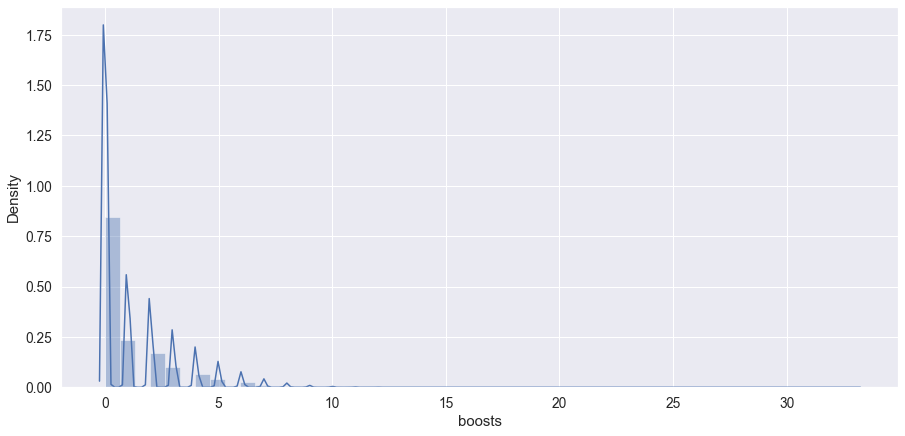

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(train['boosts'],kde=True, bins=50)
plt.show()

In [ ]:
display(train[train['boosts'] >= 11].shape)
train[train['boosts'] >= 11].head(10)

(2819, 31)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
727,e65e9fa8ba75c6,fc8b08c649efd6,45234443e81340,0,11,817.0,0,3,1,1,0,9,2,157.40,1445,solo-fpp,95,91,1643,0,0.0,0,0.00,0,0,2396.0,4,0,0.8298,2396.00,0.333333
1352,098f7ef6c43bef,f78a14456b1f34,44399254f1090a,1,11,366.3,2,2,4,3,1177,5,2,99.66,1880,duo-fpp,50,50,-1,0,0.0,0,0.00,0,0,2220.0,8,1515,1.0000,2220.00,0.400000
3527,0866bb295ef667,b8d74c95603105,1a583804402154,0,11,599.7,3,1,11,1,1503,5,1,48.82,1822,duo,45,43,-1,0,3442.0,0,0.00,0,1,3257.0,9,1469,0.9318,6699.00,0.200000
8307,ae4d70069015f3,03afc93d198d97,a8efc26dc52a79,1,11,1077.0,7,2,5,1,0,10,3,117.50,1898,squad-fpp,30,27,1493,1,4748.0,0,0.00,0,0,3090.0,7,0,1.0000,7838.00,0.200000
9543,5db3bbbb276b0d,0fa4e40faaccc8,221cf0410b7eaa,0,13,200.0,0,2,1,12,0,2,1,15.61,1963,solo-fpp,93,91,1805,0,0.0,0,0.00,0,0,2810.0,7,0,0.9783,2810.00,1.000000
9874,54fae78b80ba4c,59d8b424f548cc,bbf42a43fb53b4,0,13,590.5,3,1,0,1,1596,5,2,150.30,1371,duo,49,44,-1,0,0.0,0,80.57,0,0,1763.0,3,1603,0.9375,1843.57,0.200000
11175,6eabc3b5b5096c,bc4035201102ca,ca56992f1d2680,0,14,529.6,0,3,5,3,0,6,1,79.10,1946,solo,95,87,1534,0,0.0,0,101.60,0,0,5060.0,7,0,0.9787,5161.60,0.500000
11293,e44eae472e424a,23e3c861427ff7,3ddae1ffdeb173,1,11,250.1,0,1,2,19,0,1,1,93.75,1907,duo-fpp,48,47,1480,0,0.0,0,37.30,0,0,4070.0,5,0,0.9574,4107.30,1.000000
11804,12bcd2b457bd46,f1948f985e49b2,24e99fbff0e255,0,12,370.5,0,2,7,7,0,3,1,89.85,1451,duo-fpp,49,49,1496,0,0.0,0,0.00,0,0,1589.0,7,0,0.9583,1589.00,0.666667
14695,a7775026a432e2,9941f46a868aaf,e3db22fd82e911,2,11,804.7,4,1,4,3,0,6,2,45.84,1517,duo-fpp,48,43,1688,0,0.0,0,0.00,0,0,3488.0,6,0,0.9574,3488.00,0.166667


In [ ]:
# Remove outliers
train.drop(train[train['boosts'] >= 11].index, inplace=True)

In [ ]:
train.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444,244.8000,0.0
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400,1445.0445,0.0
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755,161.8000,0.0
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667,202.7000,0.0
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875,49.7500,0.0


In [ ]:
train.shape

(4336111, 31)

In [ ]:
train.to_csv('./train_cleaned.csv', encoding = 'utf-8')

## 3. Feature Engineering

### 게임 플레이어 수

In [ ]:
# 데이터 불러오기
if os.name == 'nt' or os.name == 'Linux' or os.name == 'Darwin':
    path = './'
else:
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/Colab Notebooks/PUBG_Project/'
    
train = pd.read_csv(path + 'train_cleaned.csv', index_col=0)
test = pd.read_csv(path + 'test_V2.csv', index_col=0)

In [ ]:
train['_players_count'] = train.groupby('matchId')['matchId'].transform('count')

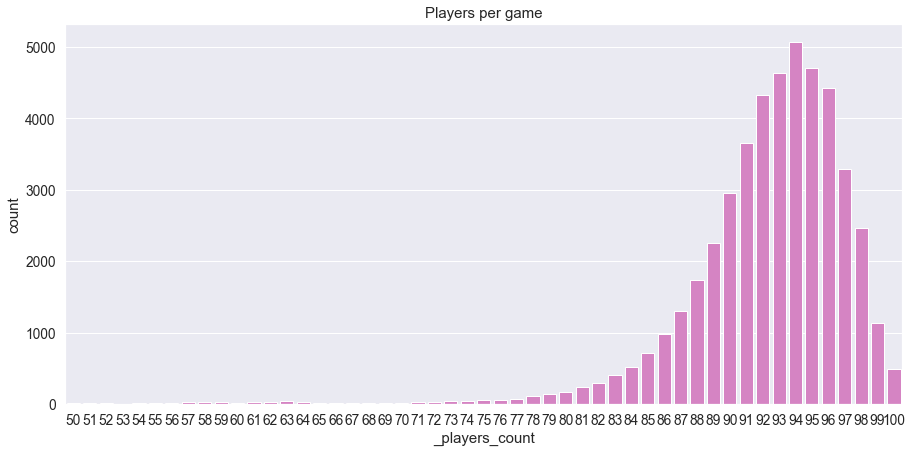

In [ ]:
data = train.copy()
data = data.drop_duplicates(['matchId'])
data = data[data['_players_count']>49]
plt.figure(figsize=(15,7))
sns.countplot(data['_players_count'], color='#E376CA')
plt.title("Players per game",fontsize=15)
plt.show()

75명 이하의 경기가 몇몇 보이기는 하지만 대부분의 경기는 거의 100명에 가깝게 시작한다.

In [ ]:
print("플레이어들의 게임 당 평균 참가인원 : " + str(data["_players_count"].mean()))

플레이어들의 게임 당 평균 참가인원 : 92.21651509329234


### Normalizing the features

'_players_count' 변수를 바탕으로 게임별로 다음과 같은 변수들을 정규화 할 수 있었다.

- kills
- damageDealt
- maxPlace
- matchDuration

In [ ]:
# 정규화된 features 생성
train['_killsNorm'] = train['kills']*((100-train['_players_count'])/100 + 1)
train['_damageDealtNorm'] = train['damageDealt']*((100-train['_players_count'])/100 + 1)
train['_maxPlaceNorm'] = train['maxPlace']*((100-train['_players_count'])/100 + 1)
train['_matchDurationNorm'] = train['matchDuration']*((100-train['_players_count'])/100 + 1)

# 기존 피처들과의 비교
columns = ['Id', 'kills','_killsNorm','damageDealt', '_damageDealtNorm', 'maxPlace', '_maxPlaceNorm', 'matchDuration', '_matchDurationNorm']
train[columns][0:11]

,Id,kills,_killsNorm,damageDealt,_damageDealtNorm,maxPlace,_maxPlaceNorm,matchDuration,_matchDurationNorm
0,7f96b2f878858a,0,0.00,0.000,0.00000,28,29.68,1306,1384.36
1,eef90569b9d03c,0,0.00,91.470,100.61700,26,28.60,1777,1954.70
2,1eaf90ac73de72,0,0.00,68.000,72.76000,50,53.50,1318,1410.26
3,4616d365dd2853,0,0.00,32.900,35.86100,31,33.79,1436,1565.24
4,315c96c26c9aac,1,1.06,100.000,106.00000,97,102.82,1424,1509.44
5,ff79c12f326506,1,1.09,100.000,109.00000,28,30.52,1395,1520.55
6,95959be0e21ca3,0,0.00,0.000,0.00000,28,28.84,1316,1355.48
7,311b84c6ff4390,0,0.00,8.538,9.30642,96,104.64,1967,2144.03
8,1a68204ccf9891,0,0.00,51.600,54.18000,28,29.40,1375,1443.75
9,e5bb5a43587253,0,0.00,37.270,40.25160,29,31.32,1930,2084.40


In [ ]:
#pct: 반환 된 순위를 백분위 수 형식으로 표시할지 여부입니다.
match = train.groupby('matchId')
train['_killsPerc'] = match['kills'].rank(pct=True).values
train['_killPlacePerc'] = match['killPlace'].rank(pct=True).values 
train['_walkDistancePerc'] = match['walkDistance'].rank(pct=True).values 
train['_damageDealtPerc'] = match['damageDealt'].rank(pct=True).values
train['_walkPerc_killsPerc'] = train['_walkDistancePerc'] / train['_killsPerc']
train.head()

,Unnamed: 0,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate,_players_count,_killsNorm,_damageDealtNorm,_maxPlaceNorm,_matchDurationNorm,_killsPerc,_killPlacePerc,_walkDistancePerc,_damageDealtPerc,_walkPerc_killsPerc
0,0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444,244.8000,0.0,94,0.00,0.000,29.68,1384.36,0.297872,0.638298,0.468085,0.148936,1.571429
1,1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400,1445.0445,0.0,90,0.00,100.617,28.60,1954.70,0.250000,0.633333,0.555556,0.433333,2.222222
2,2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755,161.8000,0.0,93,0.00,72.760,53.50,1410.26,0.279570,0.505376,0.344086,0.419355,1.230769
3,3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667,202.7000,0.0,91,0.00,35.861,33.79,1565.24,0.274725,0.824176,0.230769,0.296703,0.840000
4,4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875,49.7500,0.0,94,1.06,106.000,102.82,1509.44,0.659574,0.478723,0.180851,0.563830,0.274194


In [ ]:
# 새로 생성된 피처의 상관계수
corr = train[['_killsPerc', '_killPlacePerc','_walkDistancePerc','_damageDealtPerc', '_walkPerc_killsPerc','winPlacePerc']].corr()

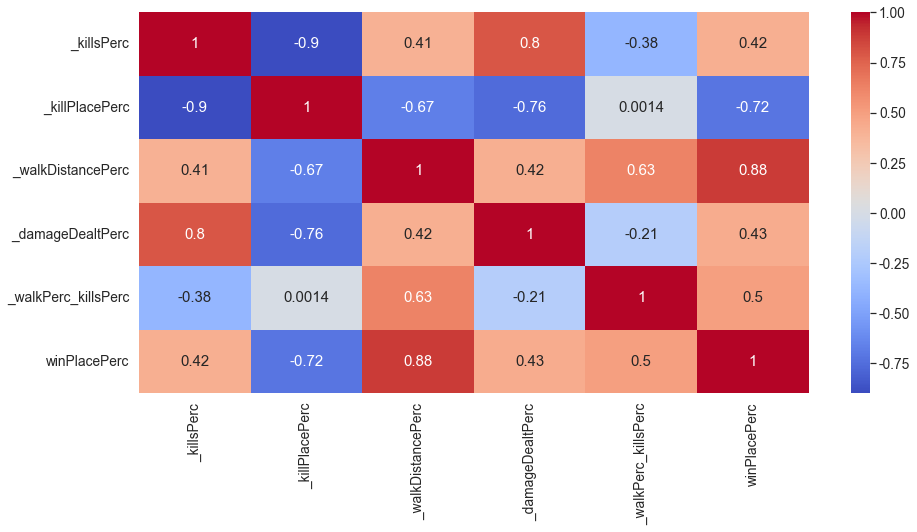

In [ ]:
plt.figure(figsize=(15,7))
sns.heatmap(corr, annot=True,cmap="coolwarm")
plt.show()

In [ ]:
agg = train.groupby(['groupId']).size().to_frame('players_in_team')
train = train.merge(agg, how='left', on=['groupId'])
train['_healthItems'] = train['heals'] + train['boosts']
train['_headshotKillRate'] = train['headshotKills'] / train['kills']
train['_killPlaceOverMaxPlace'] = train['killPlace'] / train['maxPlace']
train['_killsOverWalkDistance'] = train['kills'] / train['walkDistance']
train['_killsOverDistance'] = train['kills'] / train['_totalDistance']
train['_walkDistancePerSec'] = train['walkDistance'] / train['matchDuration']
train.head()

,Unnamed: 0,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,_totalDistance,_headshot_rate,_players_count,_killsNorm,_damageDealtNorm,_maxPlaceNorm,_matchDurationNorm,_killsPerc,_killPlacePerc,_walkDistancePerc,_damageDealtPerc,_walkPerc_killsPerc,players_in_team,_healthItems,_headshotKillRate,_killPlaceOverMaxPlace,_killsOverWalkDistance,_killsOverDistance,_walkDistancePerSec
0,0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444,244.8000,0.0,94,0.00,0.000,29.68,1384.36,0.297872,0.638298,0.468085,0.148936,1.571429,4,0,NaN,2.142857,0.000000,0.000000,0.187443
1,1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400,1445.0445,0.0,90,0.00,100.617,28.60,1954.70,0.250000,0.633333,0.555556,0.433333,2.222222,4,0,NaN,2.192308,0.000000,0.000000,0.806978
2,2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755,161.8000,0.0,93,0.00,72.760,53.50,1410.26,0.279570,0.505376,0.344086,0.419355,1.230769,2,0,NaN,0.940000,0.000000,0.000000,0.122762
3,3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667,202.7000,0.0,91,0.00,35.861,33.79,1565.24,0.274725,0.824176,0.230769,0.296703,0.840000,1,0,NaN,2.419355,0.000000,0.000000,0.141156
4,4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875,49.7500,0.0,94,1.06,106.000,102.82,1509.44,0.659574,0.478723,0.180851,0.563830,0.274194,1,0,0.0,0.463918,0.020101,0.020101,0.034937


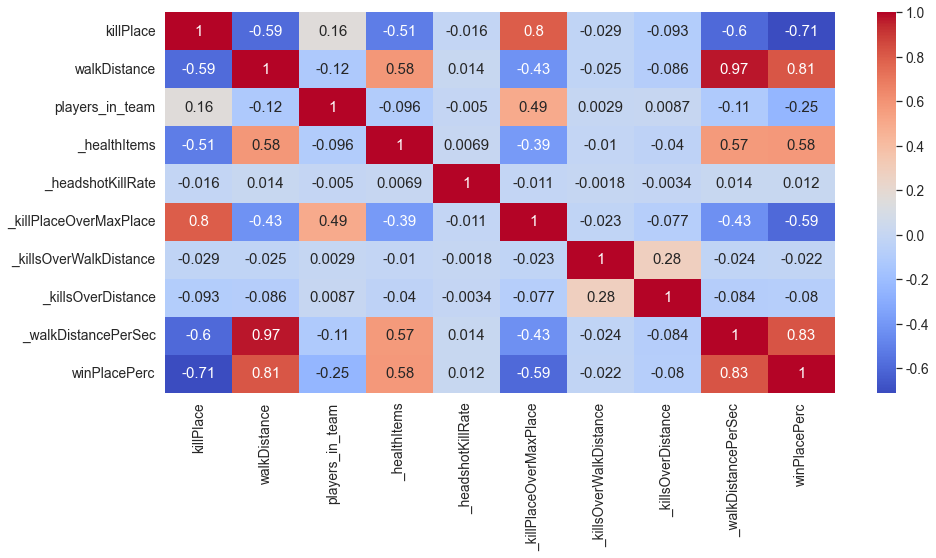

In [ ]:
# 새로 생성된 피처의 상관계수
corr = train[['killPlace', 'walkDistance','players_in_team','_healthItems', '_headshotKillRate', '_killPlaceOverMaxPlace', '_killsOverWalkDistance', '_killsOverDistance','_walkDistancePerSec', 'winPlacePerc']].corr()
plt.figure(figsize=(15,7))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.show()

In [ ]:
# winPlacePerc와 상관계수가 낮은 피처들은 삭제
train.drop(['_headshotKillRate','_killsOverDistance', '_killsOverWalkDistance', ], axis=1, inplace=True)

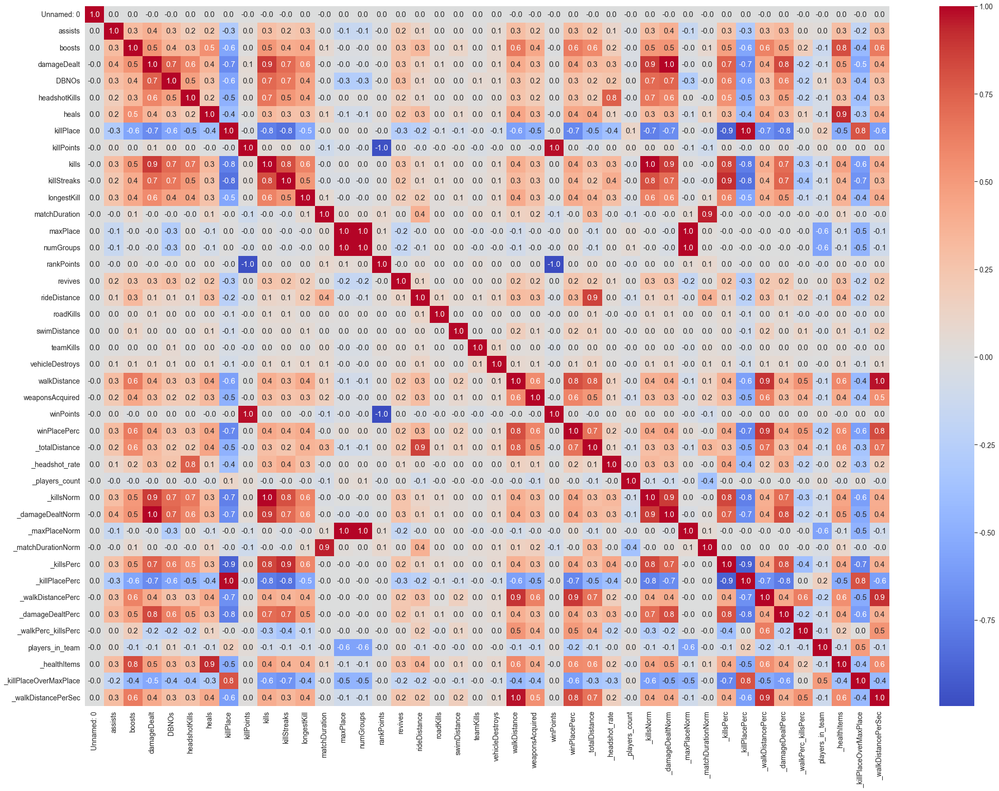

In [ ]:
# 전체 피처 히트맵
cols_to_fit = [col for col in train.columns]
corr = train[cols_to_fit].corr()
f,ax = plt.subplots(figsize=(35, 25))
sns.heatmap(train[cols_to_fit].corr(), annot=True, fmt= '.1f',ax=ax, cmap="coolwarm")
sns.set(font_scale=1.25)
plt.show()

In [ ]:
# winPlacePrec와 상관계수가 0에 가까운 피처들은 삭제
train.drop(['killPoints','matchDuration','maxPlace','numGroups','rankPoints','roadKills','teamKills','winPoints',
                   '_players_count', '_maxPlaceNorm', '_matchDurationNorm', 'Unnamed: 0'
           ], axis=1, inplace=True)

### 서로 높은 상관관계를 갖고 있는 피처들 삭제

In [ ]:
# 상관계수들의 절댓값을 매트릭스로 생성
corr_matrix = train.corr().abs()

# 상관계수 매트릭스에서 절반만 사용
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# 두 피처간 상관계수가 0.85 이상인 피처만 추출
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]

In [ ]:
to_drop
to_drop.remove('kills')
print(to_drop)

['_totalDistance', '_killsNorm', '_damageDealtNorm', '_killsPerc', '_killPlacePerc', '_walkDistancePerc', '_healthItems', '_walkDistancePerSec']


In [ ]:
# Drop features 
train.drop(train[to_drop], axis=1,inplace=True)

### test 데이터셋에도 동일한 featuring engineering 진행

In [ ]:
test['_totalDistance'] = test['rideDistance'] + test['walkDistance'] + test['swimDistance']
test['_headshot_rate'] = test['headshotKills'] / test['kills']
test['_headshot_rate'] = test['_headshot_rate'].fillna(0)

test['_players_count'] = test.groupby('matchId')['matchId'].transform('count')

# Create normalized features
test['_killsNorm'] = test['kills']*((100-test['_players_count'])/100 + 1)
test['_damageDealtNorm'] = test['damageDealt']*((100-test['_players_count'])/100 + 1)
test['_maxPlaceNorm'] = test['maxPlace']*((100-test['_players_count'])/100 + 1)
test['_matchDurationNorm'] = test['matchDuration']*((100-test['_players_count'])/100 + 1)

match = test.groupby('matchId')
test['_killsPerc'] = match['kills'].rank(pct=True).values
test['_killPlacePerc'] = match['killPlace'].rank(pct=True).values
test['_walkDistancePerc'] = match['walkDistance'].rank(pct=True).values
test['_damageDealtPerc'] = match['damageDealt'].rank(pct=True).values
test['_walkPerc_killsPerc'] = test['_walkDistancePerc'] / test['_killsPerc']

agg = test.groupby(['groupId']).size().to_frame('players_in_team')
test = test.merge(agg, how='left', on=['groupId'])
test['_healthItems'] = test['heals'] + test['boosts']
test['_headshotKillRate'] = test['headshotKills'] / test['kills']
test['_killPlaceOverMaxPlace'] = test['killPlace'] / test['maxPlace']
test['_killsOverWalkDistance'] = test['kills'] / test['walkDistance']
test['_killsOverDistance'] = test['kills'] / test['_totalDistance']
test['_walkDistancePerSec'] = test['walkDistance'] / test['matchDuration']


test.drop(['_headshotKillRate','_killsOverDistance', '_killsOverWalkDistance', ], axis=1, inplace=True)

test.drop(['killPoints','matchDuration','maxPlace','numGroups','rankPoints','roadKills','teamKills','winPoints',
                   '_players_count', '_maxPlaceNorm', '_matchDurationNorm'], axis=1, inplace=True)

test.drop(test[to_drop], axis=1,inplace=True)

In [ ]:
train.shape

(4336111, 26)

In [ ]:
test.shape

(1934174, 25)

Target 피처인 winPlacePerc를 제외하면 train과 test 컬럼 수 동일 따라서 두 데이터셋 모두 피처 엔지니어링이 적절하게 진행되었다.

In [ ]:
# 피처 엔지니어링이 끝난 데이터셋 저장
train.to_csv('./train_featured.csv', encoding = 'utf-8')
test.to_csv('./test_featured.csv', encoding = 'utf-8')

## Modeling

In [ ]:
# 데이터 불러오기
if os.name == 'nt' or os.name == 'Linux' or os.name == 'Darwin':
    path = './'
else:
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/Colab Notebooks/PUBG_Project/'
    
train = pd.read_csv(path + 'train_featured.csv', index_col=0)
test = pd.read_csv(path + 'test_featured.csv', index_col=0)

In [ ]:
# 분석에 필요없는 행 제거
train = train.drop(['Id', 'groupId', 'matchId', 'matchType'], axis=1)
test = test.drop(['Id', 'groupId', 'matchId', 'matchType'], axis=1)

In [ ]:
X_train = train.drop("winPlacePerc", axis=1)
y_train = train["winPlacePerc"]

#train-test split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=1)

In [ ]:
train.shape

(4336111, 22)

In [ ]:
test.shape

(1934174, 21)

### Baseline 모델 선정
#### LinearRegression

In [ ]:
from sklearn.linear_model import LinearRegression
model_LR = LinearRegression()
model_LR.fit(X_train, y_train)
from sklearn.metrics import mean_squared_error
some_predicted = model_LR.predict(X_val)
mse_LR = np.sqrt(mean_squared_error(some_predicted, y_val))

#### DecisionTree

In [ ]:
from sklearn.tree import DecisionTreeRegressor
model_DT = DecisionTreeRegressor()
model_DT.fit(X_train, y_train)

from sklearn.metrics import mean_squared_error
some_predicted = model_DT.predict(X_val)
mse_DT = np.sqrt(mean_squared_error(some_predicted, y_val))

#### RandomForest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
model_RF = RandomForestRegressor(n_estimators=70, min_samples_leaf=3, max_features=0.5, n_jobs=-1)
model_RF.fit(X_train, y_train)

from sklearn.metrics import mean_squared_error
some_predicted = model_RF.predict(X_val)
mse_RF = np.sqrt(mean_squared_error(some_predicted, y_val))

#### XGBoost

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from xgboost import XGBRegressor
model_XGB = XGBRegressor(max_depth=17, gamma=0.3, learning_rate= 0.1)
mse_XGB = cross_val_score(model_XGB, X_train, y_train, scoring='neg_mean_absolute_error', n_jobs=-1)
mse_XGB = np.abs(np.mean(mse_XGB))

"""
scoring = 'neg_mean_absolute_error' 로 설정해 주십시요. 
일반적으로 scoring을 값이 클 수록 모델 성능이 좋은 것으로 사이킷런에서 인식하는데, 
mae는 값이 클 수록 모델 성능이 저하되는 것이므로 Negative 키워드를 붙여서 사용합니다.
"""

"\nscoring = 'neg_mean_absolute_error' 로 설정해 주십시요. \n일반적으로 scoring을 값이 클 수록 모델 성능이 좋은 것으로 사이킷런에서 인식하는데, \nmae는 값이 클 수록 모델 성능이 저하되는 것이므로 Negative 키워드를 붙여서 사용합니다.\n"

#### LightGBM

In [ ]:
from lightgbm import LGBMRegressor
model_LGB = LGBMRegressor(max_depth=17, gamma=0.3, learning_rate= 0.1)
mse_LGB = cross_val_score(model_LGB, X_train, y_train, scoring='neg_mean_absolute_error', n_jobs=-1)
mse_LGB = np.abs(np.mean(mse_LGB))

#### 최적 모델 선정

In [ ]:
results = pd.DataFrame({
    'Model': ['LinearRegression', 'DecisionTree',
              'Random Forest', 'XGBoost', 'LightGBM'],
    'Score': [mse_LR, mse_DT, mse_RF, mse_XGB, mse_LGB]})
result_df = results.sort_values(by='Score', ascending=True)
result_df = result_df.set_index('Model')
result_df.head()

,Score
Model,
XGBoost,0.054920
LightGBM,0.060202
Random Forest,0.077911
DecisionTree,0.112630
LinearRegression,0.120610


5개의 기본모델 중 XGBoost와 LightGBM의 mse 점수 좋다는것을 알 수 있다.

따라서 이들을 baseline model로 선정 후 model evaluating을 진행하였다.

### Model Evaluating

#### Scaling

In [ ]:
# PCA를 진행하기 전 Scaling 수행
from sklearn.preprocessing import StandardScaler  

x_scaled = StandardScaler().fit_transform(X_train) # x객체에 x를 표준화한 데이터를 저장
x_val_scaled = StandardScaler().fit_transform(X_val)

#### PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pct = pca.fit_transform(x_scaled)
print(np.round(pca.explained_variance_ratio_,decimals=3))

for i in range(3,31):
    print(f"{i} components explaining : ",sum(pca.explained_variance_ratio_[:i]))

[0.362 0.116 0.066 0.055 0.049 0.046 0.041 0.04  0.038 0.033 0.029 0.026
 0.023 0.019 0.016 0.013 0.01  0.007 0.004 0.004 0.002]
3 components explaining :  0.5441836918872287
4 components explaining :  0.5988759495439753
5 components explaining :  0.6477123810313954
6 components explaining :  0.6938250142960937
7 components explaining :  0.7349869876520576
8 components explaining :  0.7754058902806825
9 components explaining :  0.8134290741545384
10 components explaining :  0.846296355727293
11 components explaining :  0.8756742924154708
12 components explaining :  0.9014636101577815
13 components explaining :  0.9242549233290241
14 components explaining :  0.9436233746851698
15 components explaining :  0.9599531020218955
16 components explaining :  0.9729202103797692
17 components explaining :  0.9828592349505836
18 components explaining :  0.9897936048251483
19 components explaining :  0.9941677479307551
20 components explaining :  0.9980114439014047
21 components explaining :  0.999

약 12개의 PC로 전체의 약 90%를 설명 가능하다 따라서 이를 기준으로 PCA를 진행하였다.

In [ ]:
pca = PCA(n_components = 12)  # 12개 변수를 사용
pca.fit(x_scaled)

PCA(n_components=12)

In [ ]:
pca.fit(x_val_scaled)

PCA(n_components=12)

In [ ]:
pca.explained_variance_  #PC12의 eigen_vector를 구함

array([7.61451678, 2.42726591, 1.38903439, 1.14593628, 1.02541925,
       0.96979294, 0.86421114, 0.85017438, 0.79994086, 0.69014988,
       0.61466231, 0.54284763])

In [ ]:
PCs = pca.transform(x_scaled)[:,:]
PCs_val = pca.transform(x_val_scaled)[:,:]

In [ ]:
PCs

array([[ 2.31476847,  4.9039978 ,  1.62834547, ..., -4.23320218,
        -1.49686335, -0.32452866],
       [-1.28672423,  2.77674879, -0.95427558, ..., -0.8718758 ,
         0.22086877,  0.23483677],
       [-1.74342857,  1.60752117,  0.55802749, ..., -1.32970104,
         0.03083548, -0.21223359],
       ...,
       [-0.2989559 , -0.79189661, -1.54038923, ...,  0.19194469,
        -0.44344642, -0.38473514],
       [-0.46523166,  2.59310285,  1.1100457 , ..., -3.06131063,
        -0.91811195, -0.56122135],
       [-2.08247227, -0.83730755, -0.51716507, ..., -0.04765658,
         0.1417326 ,  0.2336876 ]])

### GridSearch를 이용한 최적 하이퍼파라미터 탐색

In [ ]:
from sklearn.model_selection import GridSearchCV
def find_best_hyperparameters(model, model_name):
    # Grid parameters for using in Gridsearch while tuning
    if model_name == 'LGB':
        gridParams = {
            'learning_rate'         : [0.1, 0.01 , 0.05],
            'n_estimators '         : [1000, 10000, 20000],
            'bagging_fraction'      : [0.5, 0.6 ,0.7],
            'feature_fraction'      : [0.5, 0.6 ,0.7],
            'num_leaves'            : [31, 80, 140]
        }
    elif model_name == 'XGB':
        gridParams = {"subsample":[0.5, 0.75, 1],
                      "colsample_bytree":[0.5, 0.75, 1],
                      "max_depth":[2, 6, 12],
                      "min_child_weight":[1,5,15],
                      "learning_rate":[0.3, 0.1, 0.03],
                      "n_estimators":[100]
        }
    else:
        print("Invalid Model")
        return 
    # Create the grid
    grid = GridSearchCV(model, 
                        gridParams,
                        verbose=5,
                        cv=3)
    # Run the grid
    grid.fit(X_train, y_train)
    print('Best parameters: %s' % grid.best_params_)
    print('Accuracy: %.2f' % grid.best_score_)
    return

#### LGBM

In [ ]:
find_best_hyperparameters(model_LGB, 'LGB')

Fitting 3 folds for each of 243 candidates, totalling 729 fits
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.1, n_estimators =1000, num_leaves=31;, score=0.923 total time=   6.2s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warni

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.1, n_estimators =10000, num_leaves=80;, score=0.929 total time=   8.1s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.01, n_estimators =1000, num_leaves=31;, score=0.746 total time=   7.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.01, n_estimators =10000, num_leaves=140;, score=0.765 total time=   9.6s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.05, n_estimators =1000, num_leaves=31;, score=0.914 total time=   6.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.5, learning_rate=0.05, n_estimators =10000, num_leaves=140;, score=0.926 total time=   9.8s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.1, n_estimators =1000, num_leaves=80;, score=0.930 total time=   8.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. C

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.1, n_estimators =10000, num_leaves=140;, score=0.932 total time=  11.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.01, n_estimators =1000, num_leaves=80;, score=0.770 total time=  10.9s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.01, n_estimators =20000, num_leaves=31;, score=0.755 total time=   8.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.05, n_estimators =1000, num_leaves=80;, score=0.924 total time=   9.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.6, learning_rate=0.05, n_estimators =20000, num_leaves=31;, score=0.916 total time=   8.3s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.1, n_estimators =1000, num_leaves=140;, score=0.932 total time=  11.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.1, n_estimators =20000, num_leaves=31;, score=0.924 total time=   7.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.01, n_estimators =1000, num_leaves=140;, score=0.780 total time=  12.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored.

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.01, n_estimators =20000, num_leaves=80;, score=0.774 total time=  10.8s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.05, n_estimators =1000, num_leaves=140;, score=0.927 total time=  12.1s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.5, feature_fraction=0.7, learning_rate=0.05, n_estimators =20000, num_leaves=80;, score=0.924 total time=  10.3s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.1, n_estimators =10000, num_leaves=31;, score=0.923 total time=   8.3s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.1, n_estimators =20000, num_leaves=80;, score=0.929 total time=  10.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.01, n_estimators =10000, num_leaves=31;, score=0.746 total time=   8.8s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.01, n_estimators =20000, num_leaves=140;, score=0.765 total time=  12.6s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.05, n_estimators =10000, num_leaves=31;, score=0.914 total time=   9.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.6, feature_fraction=0.5, learning_rate=0.05, n_estimators =20000, num_leaves=140;, score=0.926 total time=  12.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.6, learning_rate=0.1, n_estimators =10000, num_leaves=80;, score=0.930 total time=   9.1s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.6, learning_rate=0.1, n_estimators =20000, num_leaves=140;, score=0.932 total time=  11.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.6, feature_fraction=0.6, learning_rate=0.01, n_estimators =10000, num_leaves=80;, score=0.770 total time=   9.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.6, learning_rate=0.05, n_estimators =1000, num_leaves=31;, score=0.915 total time=   7.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.6, learning_rate=0.05, n_estimators =10000, num_leaves=80;, score=0.924 total time=   7.9s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.1, n_estimators =1000, num_leaves=31;, score=0.924 total time=   6.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. C

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.1, n_estimators =10000, num_leaves=140;, score=0.932 total time=   8.6s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.01, n_estimators =1000, num_leaves=31;, score=0.759 total time=   6.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.01, n_estimators =10000, num_leaves=140;, score=0.780 total time=   9.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.05, n_estimators =1000, num_leaves=80;, score=0.924 total time=   7.2s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.6, feature_fraction=0.7, learning_rate=0.05, n_estimators =10000, num_leaves=140;, score=0.927 total time=   8.2s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.1, n_estimators =1000, num_leaves=80;, score=0.929 total time=   7.3s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. C

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.1, n_estimators =20000, num_leaves=31;, score=0.923 total time=   6.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.01, n_estimators =1000, num_leaves=80;, score=0.760 total time=   7.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.01, n_estimators =20000, num_leaves=31;, score=0.746 total time=   6.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.05, n_estimators =1000, num_leaves=140;, score=0.926 total time=   9.1s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored.

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.5, learning_rate=0.05, n_estimators =20000, num_leaves=31;, score=0.914 total time=   6.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.1, n_estimators =1000, num_leaves=140;, score=0.932 total time=   8.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. 

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.1, n_estimators =20000, num_leaves=80;, score=0.930 total time=   7.4s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.01, n_estimators =1000, num_leaves=140;, score=0.776 total time=  10.5s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.01, n_estimators =20000, num_leaves=80;, score=0.770 total time=  11.3s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.05, n_estimators =10000, num_leaves=31;, score=0.915 total time=   7.8s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.6, learning_rate=0.05, n_estimators =20000, num_leaves=80;, score=0.924 total time=   9.9s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.1, n_estimators =10000, num_leaves=31;, score=0.924 total time=   7.7s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.1, n_estimators =20000, num_leaves=140;, score=0.932 total time=  12.0s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.01, n_estimators =10000, num_leaves=31;, score=0.759 total time=   8.6s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 2/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.01, n_estimators =20000, num_leaves=140;, score=0.780 total time=  12.9s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignor

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 1/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.05, n_estimators =10000, num_leaves=80;, score=0.924 total time=  10.6s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 10000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 20000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignored. Current value: num_iterations=100
[CV 3/3] END bagging_fraction=0.7, feature_fraction=0.7, learning_rate=0.05, n_estimators =20000, num_leaves=140;, score=0.927 total time=  12.2s
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=100, n_estimators= will be ignore

실행결과: 

Best parameters: {'bagging_fraction': 0.5, 'feature_fraction': 0.7, 'learning_rate': 0.1, 'n_estimators ': 1000, 'num_leaves': 140}

Accuracy: 0.93

In [ ]:
X_train_lgb =  lgb.Dataset(X_train, label=y_train)
X_val_lgb =  lgb.Dataset(X_val, label=y_val)

In [ ]:
# adapt best parameters given
LGB_parameters = { 'objective': 'regression_l1',
                   'learning_rate': 0.1,
                   'bagging_fraction': 0.5,
                   'feature_fraction': 0.7,
                   'n_estimators ': 1000, 
                   'num_leaves': 140
                  }

In [ ]:
import lightgbm as lgb
import time

%time
# adapt best parameters given
model = lgb.train(LGB_parameters, 
                  X_train_lgb,
                  num_boost_round = 40000,
                  early_stopping_rounds=20,
                  valid_sets=[X_val_lgb,X_train_lgb])

Wall time: 0 ns
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] num_iterations is set=40000, n_estimators= will be ignored. Current value: num_iterations=40000
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] num_iterations is set=40000, n_estimators= will be ignored. Current value: num_iterations=40000
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2347
[LightGBM] [Info] Number of data points in the train set: 3468888, number of used features: 21
[LightGBM] [Warning] Unknown parameter: 1000
[LightGBM] [Warning] num_iterations is set=40000, n_estimators= will be ignored. Current value: num_iterations=40000
[LightGBM] [Info] Start training from score 0.466700
[1]	training's l1: 0.238686	valid_0's l1: 0.238652
[2]	training's l1: 0.216736	valid_0'

[137]	training's l1: 0.0554542	valid_0's l1: 0.0556838
[138]	training's l1: 0.0554419	valid_0's l1: 0.0556728
[139]	training's l1: 0.0554174	valid_0's l1: 0.0556499
[140]	training's l1: 0.0554021	valid_0's l1: 0.0556365
[141]	training's l1: 0.0553934	valid_0's l1: 0.0556291
[142]	training's l1: 0.0553829	valid_0's l1: 0.0556199
[143]	training's l1: 0.0553583	valid_0's l1: 0.0555968
[144]	training's l1: 0.0553461	valid_0's l1: 0.0555866
[145]	training's l1: 0.0553199	valid_0's l1: 0.0555606
[146]	training's l1: 0.0553025	valid_0's l1: 0.0555438
[147]	training's l1: 0.0552915	valid_0's l1: 0.0555344
[148]	training's l1: 0.0552729	valid_0's l1: 0.0555168
[149]	training's l1: 0.0552588	valid_0's l1: 0.0555043
[150]	training's l1: 0.0552503	valid_0's l1: 0.0554962
[151]	training's l1: 0.0552249	valid_0's l1: 0.0554735
[152]	training's l1: 0.0552149	valid_0's l1: 0.0554652
[153]	training's l1: 0.0551934	valid_0's l1: 0.055445
[154]	training's l1: 0.0551821	valid_0's l1: 0.0554353
[155]	train

[288]	training's l1: 0.0542959	valid_0's l1: 0.0547632
[289]	training's l1: 0.0542958	valid_0's l1: 0.0547632
[290]	training's l1: 0.0542958	valid_0's l1: 0.0547632
[291]	training's l1: 0.0542915	valid_0's l1: 0.0547605
[292]	training's l1: 0.0542905	valid_0's l1: 0.0547604
[293]	training's l1: 0.0542894	valid_0's l1: 0.0547602
[294]	training's l1: 0.0542868	valid_0's l1: 0.054758
[295]	training's l1: 0.0542847	valid_0's l1: 0.0547576
[296]	training's l1: 0.0542822	valid_0's l1: 0.0547561
[297]	training's l1: 0.0542804	valid_0's l1: 0.0547562
[298]	training's l1: 0.0542764	valid_0's l1: 0.0547537
[299]	training's l1: 0.0542758	valid_0's l1: 0.0547531
[300]	training's l1: 0.054274	valid_0's l1: 0.0547524
[301]	training's l1: 0.0542681	valid_0's l1: 0.0547469
[302]	training's l1: 0.054265	valid_0's l1: 0.0547454
[303]	training's l1: 0.0542599	valid_0's l1: 0.054742
[304]	training's l1: 0.0542568	valid_0's l1: 0.0547411
[305]	training's l1: 0.054254	valid_0's l1: 0.0547403
[306]	training'

[438]	training's l1: 0.0539818	valid_0's l1: 0.0546006
[439]	training's l1: 0.0539803	valid_0's l1: 0.0546005
[440]	training's l1: 0.0539799	valid_0's l1: 0.0546002
[441]	training's l1: 0.0539798	valid_0's l1: 0.0546002
[442]	training's l1: 0.0539756	valid_0's l1: 0.0545961
[443]	training's l1: 0.053974	valid_0's l1: 0.0545953
[444]	training's l1: 0.0539728	valid_0's l1: 0.0545949
[445]	training's l1: 0.0539717	valid_0's l1: 0.0545945
[446]	training's l1: 0.0539705	valid_0's l1: 0.0545939
[447]	training's l1: 0.0539673	valid_0's l1: 0.0545926
[448]	training's l1: 0.0539657	valid_0's l1: 0.054592
[449]	training's l1: 0.0539636	valid_0's l1: 0.0545916
[450]	training's l1: 0.0539594	valid_0's l1: 0.0545895
[451]	training's l1: 0.0539563	valid_0's l1: 0.0545879
[452]	training's l1: 0.0539546	valid_0's l1: 0.0545877
[453]	training's l1: 0.0539545	valid_0's l1: 0.0545877
[454]	training's l1: 0.0539545	valid_0's l1: 0.0545876
[455]	training's l1: 0.0539514	valid_0's l1: 0.054586
[456]	trainin

[590]	training's l1: 0.0536938	valid_0's l1: 0.0544997
[591]	training's l1: 0.0536937	valid_0's l1: 0.0544996
[592]	training's l1: 0.0536934	valid_0's l1: 0.0544997
[593]	training's l1: 0.0536932	valid_0's l1: 0.0544996
[594]	training's l1: 0.053693	valid_0's l1: 0.0544996
[595]	training's l1: 0.0536893	valid_0's l1: 0.0544971
[596]	training's l1: 0.0536891	valid_0's l1: 0.0544971
[597]	training's l1: 0.0536864	valid_0's l1: 0.0544961
[598]	training's l1: 0.053682	valid_0's l1: 0.0544932
[599]	training's l1: 0.0536819	valid_0's l1: 0.0544932
[600]	training's l1: 0.0536792	valid_0's l1: 0.0544912
[601]	training's l1: 0.0536783	valid_0's l1: 0.0544911
[602]	training's l1: 0.0536762	valid_0's l1: 0.0544899
[603]	training's l1: 0.0536752	valid_0's l1: 0.0544895
[604]	training's l1: 0.053675	valid_0's l1: 0.0544895
[605]	training's l1: 0.0536748	valid_0's l1: 0.0544894
[606]	training's l1: 0.0536742	valid_0's l1: 0.0544894
[607]	training's l1: 0.0536702	valid_0's l1: 0.0544877
[608]	trainin

[742]	training's l1: 0.0535452	valid_0's l1: 0.0544467
[743]	training's l1: 0.0535446	valid_0's l1: 0.0544464
[744]	training's l1: 0.053544	valid_0's l1: 0.0544465
[745]	training's l1: 0.0535433	valid_0's l1: 0.0544465
[746]	training's l1: 0.0535427	valid_0's l1: 0.0544466
[747]	training's l1: 0.053542	valid_0's l1: 0.0544467
[748]	training's l1: 0.0535408	valid_0's l1: 0.0544465
[749]	training's l1: 0.0535399	valid_0's l1: 0.0544464
[750]	training's l1: 0.0535394	valid_0's l1: 0.0544466
[751]	training's l1: 0.0535388	valid_0's l1: 0.0544466
[752]	training's l1: 0.0535383	valid_0's l1: 0.0544465
[753]	training's l1: 0.0535377	valid_0's l1: 0.0544463
[754]	training's l1: 0.0535371	valid_0's l1: 0.0544464
[755]	training's l1: 0.0535366	valid_0's l1: 0.0544464
[756]	training's l1: 0.0535361	valid_0's l1: 0.0544464
[757]	training's l1: 0.0535359	valid_0's l1: 0.0544463
[758]	training's l1: 0.0535355	valid_0's l1: 0.0544463
[759]	training's l1: 0.053535	valid_0's l1: 0.0544463
[760]	trainin

[893]	training's l1: 0.0534284	valid_0's l1: 0.0544207
[894]	training's l1: 0.0534267	valid_0's l1: 0.0544206
[895]	training's l1: 0.0534265	valid_0's l1: 0.0544206
[896]	training's l1: 0.0534262	valid_0's l1: 0.0544205
[897]	training's l1: 0.053426	valid_0's l1: 0.0544205
[898]	training's l1: 0.0534245	valid_0's l1: 0.0544204
[899]	training's l1: 0.0534244	valid_0's l1: 0.0544204
[900]	training's l1: 0.0534237	valid_0's l1: 0.0544202
[901]	training's l1: 0.0534235	valid_0's l1: 0.0544202
[902]	training's l1: 0.0534201	valid_0's l1: 0.054419
[903]	training's l1: 0.0534199	valid_0's l1: 0.054419
[904]	training's l1: 0.0534197	valid_0's l1: 0.054419
[905]	training's l1: 0.0534194	valid_0's l1: 0.054419
[906]	training's l1: 0.053418	valid_0's l1: 0.0544189
[907]	training's l1: 0.0534178	valid_0's l1: 0.0544189
[908]	training's l1: 0.0534177	valid_0's l1: 0.0544188
[909]	training's l1: 0.0534175	valid_0's l1: 0.0544188
[910]	training's l1: 0.0534145	valid_0's l1: 0.054417
[911]	training's 

[1042]	training's l1: 0.0533447	valid_0's l1: 0.0544027
[1043]	training's l1: 0.0533434	valid_0's l1: 0.0544023
[1044]	training's l1: 0.053343	valid_0's l1: 0.0544023
[1045]	training's l1: 0.0533425	valid_0's l1: 0.0544022
[1046]	training's l1: 0.0533421	valid_0's l1: 0.0544021
[1047]	training's l1: 0.0533417	valid_0's l1: 0.0544022
[1048]	training's l1: 0.0533413	valid_0's l1: 0.0544022
[1049]	training's l1: 0.0533407	valid_0's l1: 0.0544023
[1050]	training's l1: 0.0533405	valid_0's l1: 0.0544022
[1051]	training's l1: 0.0533403	valid_0's l1: 0.0544022
[1052]	training's l1: 0.0533398	valid_0's l1: 0.0544022
[1053]	training's l1: 0.0533387	valid_0's l1: 0.0544023
[1054]	training's l1: 0.0533385	valid_0's l1: 0.0544024
[1055]	training's l1: 0.0533383	valid_0's l1: 0.0544024
[1056]	training's l1: 0.0533377	valid_0's l1: 0.0544023
[1057]	training's l1: 0.0533374	valid_0's l1: 0.0544023
[1058]	training's l1: 0.0533368	valid_0's l1: 0.0544022
[1059]	training's l1: 0.0533366	valid_0's l1: 0.0

[1190]	training's l1: 0.0532328	valid_0's l1: 0.0543832
[1191]	training's l1: 0.0532327	valid_0's l1: 0.0543833
[1192]	training's l1: 0.0532325	valid_0's l1: 0.0543833
[1193]	training's l1: 0.0532324	valid_0's l1: 0.0543834
[1194]	training's l1: 0.0532322	valid_0's l1: 0.0543834
[1195]	training's l1: 0.0532304	valid_0's l1: 0.0543825
[1196]	training's l1: 0.0532291	valid_0's l1: 0.0543819
[1197]	training's l1: 0.053227	valid_0's l1: 0.0543813
[1198]	training's l1: 0.0532263	valid_0's l1: 0.0543813
[1199]	training's l1: 0.0532263	valid_0's l1: 0.0543813
[1200]	training's l1: 0.0532261	valid_0's l1: 0.0543813
[1201]	training's l1: 0.0532261	valid_0's l1: 0.0543813
[1202]	training's l1: 0.0532259	valid_0's l1: 0.0543813
[1203]	training's l1: 0.0532253	valid_0's l1: 0.0543809
[1204]	training's l1: 0.0532247	valid_0's l1: 0.0543809
[1205]	training's l1: 0.053223	valid_0's l1: 0.0543805
[1206]	training's l1: 0.0532214	valid_0's l1: 0.0543805
[1207]	training's l1: 0.0532196	valid_0's l1: 0.05

[1338]	training's l1: 0.0531406	valid_0's l1: 0.0543719
[1339]	training's l1: 0.0531399	valid_0's l1: 0.054372
[1340]	training's l1: 0.0531396	valid_0's l1: 0.054372
[1341]	training's l1: 0.0531391	valid_0's l1: 0.0543719
[1342]	training's l1: 0.0531385	valid_0's l1: 0.054372
[1343]	training's l1: 0.0531383	valid_0's l1: 0.054372
[1344]	training's l1: 0.053138	valid_0's l1: 0.0543719
[1345]	training's l1: 0.0531376	valid_0's l1: 0.0543719
[1346]	training's l1: 0.0531371	valid_0's l1: 0.054372
[1347]	training's l1: 0.0531366	valid_0's l1: 0.054372
[1348]	training's l1: 0.0531362	valid_0's l1: 0.054372
[1349]	training's l1: 0.0531356	valid_0's l1: 0.054372
[1350]	training's l1: 0.0531353	valid_0's l1: 0.054372
[1351]	training's l1: 0.0531351	valid_0's l1: 0.0543719
[1352]	training's l1: 0.0531345	valid_0's l1: 0.054372
[1353]	training's l1: 0.0531341	valid_0's l1: 0.054372
[1354]	training's l1: 0.0531337	valid_0's l1: 0.0543721
[1355]	training's l1: 0.0531333	valid_0's l1: 0.0543721
[135

[1488]	training's l1: 0.0530778	valid_0's l1: 0.054354
[1489]	training's l1: 0.0530766	valid_0's l1: 0.0543541
[1490]	training's l1: 0.0530765	valid_0's l1: 0.0543541
[1491]	training's l1: 0.0530763	valid_0's l1: 0.054354
[1492]	training's l1: 0.0530761	valid_0's l1: 0.054354
[1493]	training's l1: 0.053076	valid_0's l1: 0.054354
[1494]	training's l1: 0.0530758	valid_0's l1: 0.054354
[1495]	training's l1: 0.0530757	valid_0's l1: 0.054354
[1496]	training's l1: 0.0530755	valid_0's l1: 0.0543541
[1497]	training's l1: 0.0530753	valid_0's l1: 0.0543541
[1498]	training's l1: 0.0530751	valid_0's l1: 0.0543541
[1499]	training's l1: 0.053074	valid_0's l1: 0.0543541
[1500]	training's l1: 0.0530738	valid_0's l1: 0.0543542
[1501]	training's l1: 0.0530736	valid_0's l1: 0.0543541
[1502]	training's l1: 0.0530734	valid_0's l1: 0.0543541
[1503]	training's l1: 0.0530733	valid_0's l1: 0.0543541
[1504]	training's l1: 0.0530731	valid_0's l1: 0.0543541
[1505]	training's l1: 0.053073	valid_0's l1: 0.054354
[1

[1636]	training's l1: 0.0530302	valid_0's l1: 0.0543494
[1637]	training's l1: 0.0530291	valid_0's l1: 0.0543496
[1638]	training's l1: 0.0530283	valid_0's l1: 0.0543494
[1639]	training's l1: 0.0530257	valid_0's l1: 0.054349
[1640]	training's l1: 0.0530256	valid_0's l1: 0.054349
[1641]	training's l1: 0.0530241	valid_0's l1: 0.0543488
[1642]	training's l1: 0.0530239	valid_0's l1: 0.0543488
[1643]	training's l1: 0.0530239	valid_0's l1: 0.0543488
[1644]	training's l1: 0.0530227	valid_0's l1: 0.0543487
[1645]	training's l1: 0.0530226	valid_0's l1: 0.0543487
[1646]	training's l1: 0.0530225	valid_0's l1: 0.0543487
[1647]	training's l1: 0.0530225	valid_0's l1: 0.0543487
[1648]	training's l1: 0.0530224	valid_0's l1: 0.0543487
[1649]	training's l1: 0.0530223	valid_0's l1: 0.0543487
[1650]	training's l1: 0.0530223	valid_0's l1: 0.0543487
[1651]	training's l1: 0.0530223	valid_0's l1: 0.0543487
[1652]	training's l1: 0.0530222	valid_0's l1: 0.0543487
[1653]	training's l1: 0.0530221	valid_0's l1: 0.05

[1784]	training's l1: 0.0529437	valid_0's l1: 0.0543367
[1785]	training's l1: 0.0529436	valid_0's l1: 0.0543367
[1786]	training's l1: 0.0529435	valid_0's l1: 0.0543367
[1787]	training's l1: 0.0529434	valid_0's l1: 0.0543367
[1788]	training's l1: 0.0529417	valid_0's l1: 0.0543366
[1789]	training's l1: 0.0529416	valid_0's l1: 0.0543366
[1790]	training's l1: 0.0529413	valid_0's l1: 0.0543365
[1791]	training's l1: 0.0529412	valid_0's l1: 0.0543366
[1792]	training's l1: 0.0529412	valid_0's l1: 0.0543366
[1793]	training's l1: 0.0529411	valid_0's l1: 0.0543366
[1794]	training's l1: 0.0529399	valid_0's l1: 0.0543365
[1795]	training's l1: 0.0529399	valid_0's l1: 0.0543365
[1796]	training's l1: 0.0529378	valid_0's l1: 0.054336
[1797]	training's l1: 0.0529377	valid_0's l1: 0.054336
[1798]	training's l1: 0.0529377	valid_0's l1: 0.054336
[1799]	training's l1: 0.0529376	valid_0's l1: 0.054336
[1800]	training's l1: 0.0529376	valid_0's l1: 0.0543361
[1801]	training's l1: 0.0529375	valid_0's l1: 0.0543

[1931]	training's l1: 0.0529043	valid_0's l1: 0.0543295
[1932]	training's l1: 0.0529042	valid_0's l1: 0.0543295
[1933]	training's l1: 0.0529026	valid_0's l1: 0.0543291
[1934]	training's l1: 0.0529026	valid_0's l1: 0.0543291
[1935]	training's l1: 0.0529026	valid_0's l1: 0.0543291
[1936]	training's l1: 0.0529026	valid_0's l1: 0.054329
[1937]	training's l1: 0.0529017	valid_0's l1: 0.0543291
[1938]	training's l1: 0.0529016	valid_0's l1: 0.0543291
[1939]	training's l1: 0.0529016	valid_0's l1: 0.0543291
[1940]	training's l1: 0.0529016	valid_0's l1: 0.0543291
[1941]	training's l1: 0.0529016	valid_0's l1: 0.0543291
[1942]	training's l1: 0.0529015	valid_0's l1: 0.0543291
[1943]	training's l1: 0.0529015	valid_0's l1: 0.0543291
[1944]	training's l1: 0.0529015	valid_0's l1: 0.0543291
[1945]	training's l1: 0.0529014	valid_0's l1: 0.0543291
[1946]	training's l1: 0.0529014	valid_0's l1: 0.0543292
[1947]	training's l1: 0.0529014	valid_0's l1: 0.0543291
[1948]	training's l1: 0.0529013	valid_0's l1: 0.0

[2081]	training's l1: 0.0528437	valid_0's l1: 0.05432
[2082]	training's l1: 0.0528436	valid_0's l1: 0.0543201
[2083]	training's l1: 0.0528435	valid_0's l1: 0.0543201
[2084]	training's l1: 0.0528434	valid_0's l1: 0.05432
[2085]	training's l1: 0.0528434	valid_0's l1: 0.0543201
[2086]	training's l1: 0.0528433	valid_0's l1: 0.05432
[2087]	training's l1: 0.0528432	valid_0's l1: 0.05432
[2088]	training's l1: 0.0528425	valid_0's l1: 0.0543201
[2089]	training's l1: 0.0528424	valid_0's l1: 0.05432
[2090]	training's l1: 0.0528424	valid_0's l1: 0.0543201
[2091]	training's l1: 0.0528423	valid_0's l1: 0.05432
[2092]	training's l1: 0.0528422	valid_0's l1: 0.05432
[2093]	training's l1: 0.0528407	valid_0's l1: 0.0543199
[2094]	training's l1: 0.0528401	valid_0's l1: 0.0543198
[2095]	training's l1: 0.05284	valid_0's l1: 0.0543198
[2096]	training's l1: 0.05284	valid_0's l1: 0.0543198
[2097]	training's l1: 0.0528398	valid_0's l1: 0.0543198
[2098]	training's l1: 0.0528398	valid_0's l1: 0.0543198
[2099]	tra

[2229]	training's l1: 0.0527862	valid_0's l1: 0.0543124
[2230]	training's l1: 0.0527862	valid_0's l1: 0.0543124
[2231]	training's l1: 0.0527861	valid_0's l1: 0.0543124
[2232]	training's l1: 0.0527848	valid_0's l1: 0.054312
[2233]	training's l1: 0.0527848	valid_0's l1: 0.054312
[2234]	training's l1: 0.0527848	valid_0's l1: 0.054312
[2235]	training's l1: 0.0527847	valid_0's l1: 0.054312
[2236]	training's l1: 0.0527847	valid_0's l1: 0.054312
[2237]	training's l1: 0.0527837	valid_0's l1: 0.0543116
[2238]	training's l1: 0.0527837	valid_0's l1: 0.0543116
[2239]	training's l1: 0.0527834	valid_0's l1: 0.0543115
[2240]	training's l1: 0.052776	valid_0's l1: 0.0543051
[2241]	training's l1: 0.0527759	valid_0's l1: 0.0543052
[2242]	training's l1: 0.0527759	valid_0's l1: 0.0543052
[2243]	training's l1: 0.0527759	valid_0's l1: 0.0543052
[2244]	training's l1: 0.0527756	valid_0's l1: 0.0543052
[2245]	training's l1: 0.0527756	valid_0's l1: 0.0543052
[2246]	training's l1: 0.0527755	valid_0's l1: 0.054305

[2376]	training's l1: 0.0527329	valid_0's l1: 0.0542963
[2377]	training's l1: 0.0527325	valid_0's l1: 0.0542963
[2378]	training's l1: 0.0527324	valid_0's l1: 0.0542963
[2379]	training's l1: 0.0527323	valid_0's l1: 0.0542963
[2380]	training's l1: 0.0527323	valid_0's l1: 0.0542964
[2381]	training's l1: 0.0527322	valid_0's l1: 0.0542964
[2382]	training's l1: 0.0527321	valid_0's l1: 0.0542964
[2383]	training's l1: 0.0527321	valid_0's l1: 0.0542964
[2384]	training's l1: 0.052732	valid_0's l1: 0.0542964
[2385]	training's l1: 0.052732	valid_0's l1: 0.0542964
[2386]	training's l1: 0.0527318	valid_0's l1: 0.0542964
[2387]	training's l1: 0.0527317	valid_0's l1: 0.0542965
[2388]	training's l1: 0.0527305	valid_0's l1: 0.0542964
[2389]	training's l1: 0.0527304	valid_0's l1: 0.0542965
[2390]	training's l1: 0.0527304	valid_0's l1: 0.0542965
[2391]	training's l1: 0.0527303	valid_0's l1: 0.0542965
[2392]	training's l1: 0.0527301	valid_0's l1: 0.0542965
[2393]	training's l1: 0.05273	valid_0's l1: 0.0542

[2523]	training's l1: 0.0526466	valid_0's l1: 0.0542876
[2524]	training's l1: 0.0526465	valid_0's l1: 0.0542876
[2525]	training's l1: 0.0526465	valid_0's l1: 0.0542876
[2526]	training's l1: 0.0526465	valid_0's l1: 0.0542876
[2527]	training's l1: 0.0526464	valid_0's l1: 0.0542876
[2528]	training's l1: 0.0526464	valid_0's l1: 0.0542876
[2529]	training's l1: 0.0526464	valid_0's l1: 0.0542876
[2530]	training's l1: 0.052646	valid_0's l1: 0.0542874
[2531]	training's l1: 0.0526459	valid_0's l1: 0.0542874
[2532]	training's l1: 0.0526459	valid_0's l1: 0.0542874
[2533]	training's l1: 0.0526458	valid_0's l1: 0.0542874
[2534]	training's l1: 0.0526456	valid_0's l1: 0.0542874
[2535]	training's l1: 0.0526455	valid_0's l1: 0.0542874
[2536]	training's l1: 0.0526454	valid_0's l1: 0.0542874
[2537]	training's l1: 0.0526454	valid_0's l1: 0.0542874
[2538]	training's l1: 0.0526445	valid_0's l1: 0.0542875
[2539]	training's l1: 0.0526445	valid_0's l1: 0.0542875
[2540]	training's l1: 0.0526444	valid_0's l1: 0.0

[2673]	training's l1: 0.0525912	valid_0's l1: 0.054279
[2674]	training's l1: 0.0525911	valid_0's l1: 0.054279
[2675]	training's l1: 0.0525911	valid_0's l1: 0.054279
[2676]	training's l1: 0.052591	valid_0's l1: 0.054279
[2677]	training's l1: 0.0525904	valid_0's l1: 0.054279
[2678]	training's l1: 0.0525904	valid_0's l1: 0.054279
[2679]	training's l1: 0.0525903	valid_0's l1: 0.054279
[2680]	training's l1: 0.0525903	valid_0's l1: 0.054279
[2681]	training's l1: 0.0525902	valid_0's l1: 0.054279
[2682]	training's l1: 0.0525901	valid_0's l1: 0.0542789
[2683]	training's l1: 0.0525901	valid_0's l1: 0.0542789
[2684]	training's l1: 0.05259	valid_0's l1: 0.0542789
[2685]	training's l1: 0.0525899	valid_0's l1: 0.0542789
[2686]	training's l1: 0.0525899	valid_0's l1: 0.0542789
[2687]	training's l1: 0.0525898	valid_0's l1: 0.0542789
[2688]	training's l1: 0.0525898	valid_0's l1: 0.0542789
[2689]	training's l1: 0.0525884	valid_0's l1: 0.0542788
[2690]	training's l1: 0.0525864	valid_0's l1: 0.0542777
[269

[2822]	training's l1: 0.0525189	valid_0's l1: 0.0542581
[2823]	training's l1: 0.0525188	valid_0's l1: 0.0542581
[2824]	training's l1: 0.0525187	valid_0's l1: 0.0542581
[2825]	training's l1: 0.0525185	valid_0's l1: 0.0542581
[2826]	training's l1: 0.0525184	valid_0's l1: 0.0542581
[2827]	training's l1: 0.0525183	valid_0's l1: 0.0542581
[2828]	training's l1: 0.052518	valid_0's l1: 0.054258
[2829]	training's l1: 0.0525179	valid_0's l1: 0.054258
[2830]	training's l1: 0.0525165	valid_0's l1: 0.0542576
[2831]	training's l1: 0.052513	valid_0's l1: 0.0542548
[2832]	training's l1: 0.0525129	valid_0's l1: 0.0542548
[2833]	training's l1: 0.0525127	valid_0's l1: 0.0542547
[2834]	training's l1: 0.0525127	valid_0's l1: 0.0542547
[2835]	training's l1: 0.0525114	valid_0's l1: 0.0542546
[2836]	training's l1: 0.0525102	valid_0's l1: 0.0542545
[2837]	training's l1: 0.0525102	valid_0's l1: 0.0542545
[2838]	training's l1: 0.0525102	valid_0's l1: 0.0542545
[2839]	training's l1: 0.0525101	valid_0's l1: 0.0542

[2969]	training's l1: 0.0524821	valid_0's l1: 0.0542537
[2970]	training's l1: 0.052482	valid_0's l1: 0.0542537
[2971]	training's l1: 0.0524819	valid_0's l1: 0.0542537
[2972]	training's l1: 0.0524817	valid_0's l1: 0.0542538
[2973]	training's l1: 0.0524817	valid_0's l1: 0.0542538
[2974]	training's l1: 0.0524816	valid_0's l1: 0.0542538
[2975]	training's l1: 0.0524816	valid_0's l1: 0.0542538
[2976]	training's l1: 0.0524816	valid_0's l1: 0.0542538
[2977]	training's l1: 0.0524815	valid_0's l1: 0.0542538
[2978]	training's l1: 0.0524814	valid_0's l1: 0.0542537
[2979]	training's l1: 0.0524814	valid_0's l1: 0.0542537
[2980]	training's l1: 0.0524813	valid_0's l1: 0.0542538
[2981]	training's l1: 0.0524812	valid_0's l1: 0.0542537
[2982]	training's l1: 0.0524801	valid_0's l1: 0.0542535
[2983]	training's l1: 0.0524801	valid_0's l1: 0.0542535
[2984]	training's l1: 0.0524801	valid_0's l1: 0.0542535
[2985]	training's l1: 0.05248	valid_0's l1: 0.0542535
[2986]	training's l1: 0.05248	valid_0's l1: 0.05425

[3117]	training's l1: 0.0524537	valid_0's l1: 0.0542496
[3118]	training's l1: 0.0524536	valid_0's l1: 0.0542496
[3119]	training's l1: 0.0524536	valid_0's l1: 0.0542496
[3120]	training's l1: 0.0524536	valid_0's l1: 0.0542496
[3121]	training's l1: 0.0524536	valid_0's l1: 0.0542496
[3122]	training's l1: 0.0524536	valid_0's l1: 0.0542496
[3123]	training's l1: 0.0524535	valid_0's l1: 0.0542496
[3124]	training's l1: 0.0524535	valid_0's l1: 0.0542496
[3125]	training's l1: 0.0524525	valid_0's l1: 0.0542496
[3126]	training's l1: 0.0524525	valid_0's l1: 0.0542496
[3127]	training's l1: 0.0524525	valid_0's l1: 0.0542496
[3128]	training's l1: 0.0524524	valid_0's l1: 0.0542496
[3129]	training's l1: 0.0524524	valid_0's l1: 0.0542496
[3130]	training's l1: 0.0524524	valid_0's l1: 0.0542496
[3131]	training's l1: 0.0524524	valid_0's l1: 0.0542496
[3132]	training's l1: 0.0524523	valid_0's l1: 0.0542496
[3133]	training's l1: 0.0524523	valid_0's l1: 0.0542496
[3134]	training's l1: 0.0524523	valid_0's l1: 0.

[3267]	training's l1: 0.0524039	valid_0's l1: 0.0542403
[3268]	training's l1: 0.0524039	valid_0's l1: 0.0542403
[3269]	training's l1: 0.0524038	valid_0's l1: 0.0542403
[3270]	training's l1: 0.0524038	valid_0's l1: 0.0542403
[3271]	training's l1: 0.0524038	valid_0's l1: 0.0542403
[3272]	training's l1: 0.0524038	valid_0's l1: 0.0542403
[3273]	training's l1: 0.0524032	valid_0's l1: 0.0542403
[3274]	training's l1: 0.0524032	valid_0's l1: 0.0542403
[3275]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3276]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3277]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3278]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3279]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3280]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3281]	training's l1: 0.052403	valid_0's l1: 0.0542403
[3282]	training's l1: 0.0524029	valid_0's l1: 0.0542403
[3283]	training's l1: 0.0524029	valid_0's l1: 0.0542403
[3284]	training's l1: 0.0524029	valid_0's l1: 0.0542403

[3414]	training's l1: 0.0523726	valid_0's l1: 0.0542417
[3415]	training's l1: 0.0523726	valid_0's l1: 0.0542417
[3416]	training's l1: 0.0523724	valid_0's l1: 0.0542417
[3417]	training's l1: 0.0523721	valid_0's l1: 0.0542416
[3418]	training's l1: 0.0523721	valid_0's l1: 0.0542416
[3419]	training's l1: 0.0523721	valid_0's l1: 0.0542416
[3420]	training's l1: 0.0523719	valid_0's l1: 0.0542417
[3421]	training's l1: 0.0523718	valid_0's l1: 0.0542417
[3422]	training's l1: 0.0523716	valid_0's l1: 0.0542417
[3423]	training's l1: 0.0523714	valid_0's l1: 0.0542418
[3424]	training's l1: 0.0523712	valid_0's l1: 0.0542418
[3425]	training's l1: 0.052371	valid_0's l1: 0.0542418
[3426]	training's l1: 0.052371	valid_0's l1: 0.0542418
[3427]	training's l1: 0.052371	valid_0's l1: 0.0542417
[3428]	training's l1: 0.0523697	valid_0's l1: 0.054242
[3429]	training's l1: 0.0523694	valid_0's l1: 0.054242
[3430]	training's l1: 0.0523694	valid_0's l1: 0.054242
[3431]	training's l1: 0.0523692	valid_0's l1: 0.054242

[3563]	training's l1: 0.0523374	valid_0's l1: 0.0542392
[3564]	training's l1: 0.0523374	valid_0's l1: 0.0542392
[3565]	training's l1: 0.0523371	valid_0's l1: 0.0542393
[3566]	training's l1: 0.0523368	valid_0's l1: 0.0542393
[3567]	training's l1: 0.0523365	valid_0's l1: 0.0542393
[3568]	training's l1: 0.0523364	valid_0's l1: 0.0542393
[3569]	training's l1: 0.0523352	valid_0's l1: 0.0542393
[3570]	training's l1: 0.0523351	valid_0's l1: 0.0542393
[3571]	training's l1: 0.0523349	valid_0's l1: 0.0542393
[3572]	training's l1: 0.0523348	valid_0's l1: 0.0542393
[3573]	training's l1: 0.0523347	valid_0's l1: 0.0542393
[3574]	training's l1: 0.0523347	valid_0's l1: 0.0542393
[3575]	training's l1: 0.0523346	valid_0's l1: 0.0542394
[3576]	training's l1: 0.0523345	valid_0's l1: 0.0542394
[3577]	training's l1: 0.0523343	valid_0's l1: 0.0542394
[3578]	training's l1: 0.0523334	valid_0's l1: 0.0542392
[3579]	training's l1: 0.0523333	valid_0's l1: 0.0542391
[3580]	training's l1: 0.0523332	valid_0's l1: 0.

[3712]	training's l1: 0.0522856	valid_0's l1: 0.0542275
[3713]	training's l1: 0.0522855	valid_0's l1: 0.0542275
[3714]	training's l1: 0.052283	valid_0's l1: 0.0542268
[3715]	training's l1: 0.0522829	valid_0's l1: 0.0542268
[3716]	training's l1: 0.052282	valid_0's l1: 0.0542266
[3717]	training's l1: 0.0522803	valid_0's l1: 0.0542264
[3718]	training's l1: 0.05228	valid_0's l1: 0.0542264
[3719]	training's l1: 0.0522796	valid_0's l1: 0.0542265
[3720]	training's l1: 0.0522795	valid_0's l1: 0.0542264
[3721]	training's l1: 0.0522795	valid_0's l1: 0.0542264
[3722]	training's l1: 0.0522795	valid_0's l1: 0.0542264
[3723]	training's l1: 0.0522795	valid_0's l1: 0.0542264
[3724]	training's l1: 0.0522795	valid_0's l1: 0.0542264
[3725]	training's l1: 0.0522794	valid_0's l1: 0.0542264
[3726]	training's l1: 0.0522794	valid_0's l1: 0.0542264
[3727]	training's l1: 0.0522794	valid_0's l1: 0.0542264
[3728]	training's l1: 0.0522793	valid_0's l1: 0.0542264
[3729]	training's l1: 0.0522793	valid_0's l1: 0.0542

[3861]	training's l1: 0.0522319	valid_0's l1: 0.0542254
[3862]	training's l1: 0.0522318	valid_0's l1: 0.0542253
[3863]	training's l1: 0.0522316	valid_0's l1: 0.0542253
[3864]	training's l1: 0.0522285	valid_0's l1: 0.0542228
[3865]	training's l1: 0.0522284	valid_0's l1: 0.0542228
[3866]	training's l1: 0.0522279	valid_0's l1: 0.0542227
[3867]	training's l1: 0.0522278	valid_0's l1: 0.0542227
[3868]	training's l1: 0.0522278	valid_0's l1: 0.0542227
[3869]	training's l1: 0.0522277	valid_0's l1: 0.0542227
[3870]	training's l1: 0.0522277	valid_0's l1: 0.0542227
[3871]	training's l1: 0.0522276	valid_0's l1: 0.0542226
[3872]	training's l1: 0.0522274	valid_0's l1: 0.0542226
[3873]	training's l1: 0.0522271	valid_0's l1: 0.0542225
[3874]	training's l1: 0.0522268	valid_0's l1: 0.0542225
[3875]	training's l1: 0.0522265	valid_0's l1: 0.0542224
[3876]	training's l1: 0.0522263	valid_0's l1: 0.0542224
[3877]	training's l1: 0.0522259	valid_0's l1: 0.0542223
[3878]	training's l1: 0.0522249	valid_0's l1: 0.

[4011]	training's l1: 0.0521813	valid_0's l1: 0.0542184
[4012]	training's l1: 0.0521813	valid_0's l1: 0.0542184
[4013]	training's l1: 0.0521812	valid_0's l1: 0.0542184
[4014]	training's l1: 0.0521812	valid_0's l1: 0.0542184
[4015]	training's l1: 0.0521802	valid_0's l1: 0.0542183
[4016]	training's l1: 0.0521802	valid_0's l1: 0.0542183
[4017]	training's l1: 0.0521801	valid_0's l1: 0.0542183
[4018]	training's l1: 0.0521801	valid_0's l1: 0.0542183
[4019]	training's l1: 0.0521801	valid_0's l1: 0.0542183
[4020]	training's l1: 0.0521801	valid_0's l1: 0.0542183
[4021]	training's l1: 0.05218	valid_0's l1: 0.0542183
[4022]	training's l1: 0.0521799	valid_0's l1: 0.0542183
[4023]	training's l1: 0.0521799	valid_0's l1: 0.0542184
[4024]	training's l1: 0.052179	valid_0's l1: 0.0542183
[4025]	training's l1: 0.052179	valid_0's l1: 0.0542183
[4026]	training's l1: 0.0521789	valid_0's l1: 0.0542183
[4027]	training's l1: 0.0521785	valid_0's l1: 0.0542183
[4028]	training's l1: 0.0521785	valid_0's l1: 0.0542

[4160]	training's l1: 0.0521382	valid_0's l1: 0.054211
[4161]	training's l1: 0.0521381	valid_0's l1: 0.054211
[4162]	training's l1: 0.052137	valid_0's l1: 0.054211
[4163]	training's l1: 0.0521369	valid_0's l1: 0.054211
[4164]	training's l1: 0.0521369	valid_0's l1: 0.054211
[4165]	training's l1: 0.0521369	valid_0's l1: 0.054211
[4166]	training's l1: 0.0521368	valid_0's l1: 0.054211
[4167]	training's l1: 0.0521367	valid_0's l1: 0.054211
[4168]	training's l1: 0.0521367	valid_0's l1: 0.054211
[4169]	training's l1: 0.0521367	valid_0's l1: 0.054211
[4170]	training's l1: 0.0521367	valid_0's l1: 0.054211
[4171]	training's l1: 0.0521366	valid_0's l1: 0.0542111
[4172]	training's l1: 0.0521365	valid_0's l1: 0.0542111
[4173]	training's l1: 0.0521365	valid_0's l1: 0.0542111
[4174]	training's l1: 0.0521364	valid_0's l1: 0.0542111
[4175]	training's l1: 0.0521364	valid_0's l1: 0.0542111
[4176]	training's l1: 0.0521363	valid_0's l1: 0.0542111
[4177]	training's l1: 0.0521362	valid_0's l1: 0.0542111
[417

[4308]	training's l1: 0.0521009	valid_0's l1: 0.0542059
[4309]	training's l1: 0.0521008	valid_0's l1: 0.0542059
[4310]	training's l1: 0.0521008	valid_0's l1: 0.0542059
[4311]	training's l1: 0.0521007	valid_0's l1: 0.0542059
[4312]	training's l1: 0.0521007	valid_0's l1: 0.0542059
[4313]	training's l1: 0.0521006	valid_0's l1: 0.0542059
[4314]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4315]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4316]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4317]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4318]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4319]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4320]	training's l1: 0.0521005	valid_0's l1: 0.0542059
[4321]	training's l1: 0.0521004	valid_0's l1: 0.0542059
[4322]	training's l1: 0.0521004	valid_0's l1: 0.0542059
[4323]	training's l1: 0.0521003	valid_0's l1: 0.0542059
[4324]	training's l1: 0.0521003	valid_0's l1: 0.0542059
[4325]	training's l1: 0.0521002	valid_0's l1: 0.

[4456]	training's l1: 0.0520513	valid_0's l1: 0.0541984
[4457]	training's l1: 0.0520511	valid_0's l1: 0.0541984
[4458]	training's l1: 0.0520508	valid_0's l1: 0.0541985
[4459]	training's l1: 0.0520507	valid_0's l1: 0.0541984
[4460]	training's l1: 0.0520507	valid_0's l1: 0.0541985
[4461]	training's l1: 0.0520507	valid_0's l1: 0.0541985
[4462]	training's l1: 0.0520506	valid_0's l1: 0.0541985
[4463]	training's l1: 0.05205	valid_0's l1: 0.0541984
[4464]	training's l1: 0.0520499	valid_0's l1: 0.0541984
[4465]	training's l1: 0.0520499	valid_0's l1: 0.0541984
[4466]	training's l1: 0.0520495	valid_0's l1: 0.0541984
[4467]	training's l1: 0.0520491	valid_0's l1: 0.0541985
[4468]	training's l1: 0.0520487	valid_0's l1: 0.0541984
[4469]	training's l1: 0.0520482	valid_0's l1: 0.0541984
[4470]	training's l1: 0.0520478	valid_0's l1: 0.0541984
[4471]	training's l1: 0.0520477	valid_0's l1: 0.0541984
[4472]	training's l1: 0.052047	valid_0's l1: 0.0541984
[4473]	training's l1: 0.052047	valid_0's l1: 0.0541

[4605]	training's l1: 0.0520137	valid_0's l1: 0.0541969
[4606]	training's l1: 0.0520135	valid_0's l1: 0.0541969
[4607]	training's l1: 0.0520134	valid_0's l1: 0.0541969
[4608]	training's l1: 0.0520134	valid_0's l1: 0.0541969
[4609]	training's l1: 0.0520134	valid_0's l1: 0.0541969
[4610]	training's l1: 0.0520131	valid_0's l1: 0.0541969
[4611]	training's l1: 0.0520131	valid_0's l1: 0.0541969
[4612]	training's l1: 0.052013	valid_0's l1: 0.0541969
[4613]	training's l1: 0.052013	valid_0's l1: 0.0541969
[4614]	training's l1: 0.052013	valid_0's l1: 0.0541969
[4615]	training's l1: 0.052013	valid_0's l1: 0.0541969
[4616]	training's l1: 0.052013	valid_0's l1: 0.0541969
[4617]	training's l1: 0.0520128	valid_0's l1: 0.0541968
[4618]	training's l1: 0.0520127	valid_0's l1: 0.0541968
[4619]	training's l1: 0.0520127	valid_0's l1: 0.0541968
[4620]	training's l1: 0.0520127	valid_0's l1: 0.0541968
[4621]	training's l1: 0.0520126	valid_0's l1: 0.0541968
[4622]	training's l1: 0.0520125	valid_0's l1: 0.05419

[4752]	training's l1: 0.0519819	valid_0's l1: 0.0541947
[4753]	training's l1: 0.0519818	valid_0's l1: 0.0541948
[4754]	training's l1: 0.0519818	valid_0's l1: 0.0541948
[4755]	training's l1: 0.0519803	valid_0's l1: 0.0541943
[4756]	training's l1: 0.0519802	valid_0's l1: 0.0541943
[4757]	training's l1: 0.0519802	valid_0's l1: 0.0541943
[4758]	training's l1: 0.0519801	valid_0's l1: 0.0541943
[4759]	training's l1: 0.0519801	valid_0's l1: 0.0541943
[4760]	training's l1: 0.0519801	valid_0's l1: 0.0541943
[4761]	training's l1: 0.0519801	valid_0's l1: 0.0541943
[4762]	training's l1: 0.0519795	valid_0's l1: 0.0541943
[4763]	training's l1: 0.0519795	valid_0's l1: 0.0541943
[4764]	training's l1: 0.0519794	valid_0's l1: 0.0541943
[4765]	training's l1: 0.0519794	valid_0's l1: 0.0541943
[4766]	training's l1: 0.0519776	valid_0's l1: 0.0541936
[4767]	training's l1: 0.0519776	valid_0's l1: 0.0541936
[4768]	training's l1: 0.0519775	valid_0's l1: 0.0541936
[4769]	training's l1: 0.0519775	valid_0's l1: 0.

[4899]	training's l1: 0.0519439	valid_0's l1: 0.0541867
[4900]	training's l1: 0.0519434	valid_0's l1: 0.0541867
[4901]	training's l1: 0.0519434	valid_0's l1: 0.0541867
[4902]	training's l1: 0.0519434	valid_0's l1: 0.0541867
[4903]	training's l1: 0.0519433	valid_0's l1: 0.0541867
[4904]	training's l1: 0.0519433	valid_0's l1: 0.0541867
[4905]	training's l1: 0.0519422	valid_0's l1: 0.0541867
[4906]	training's l1: 0.0519407	valid_0's l1: 0.0541866
[4907]	training's l1: 0.0519406	valid_0's l1: 0.0541866
[4908]	training's l1: 0.0519406	valid_0's l1: 0.0541866
[4909]	training's l1: 0.0519406	valid_0's l1: 0.0541866
[4910]	training's l1: 0.0519403	valid_0's l1: 0.0541866
[4911]	training's l1: 0.0519403	valid_0's l1: 0.0541866
[4912]	training's l1: 0.0519403	valid_0's l1: 0.0541866
[4913]	training's l1: 0.0519402	valid_0's l1: 0.0541866
[4914]	training's l1: 0.0519402	valid_0's l1: 0.0541866
[4915]	training's l1: 0.0519402	valid_0's l1: 0.0541866
[4916]	training's l1: 0.0519402	valid_0's l1: 0.

[5048]	training's l1: 0.0519299	valid_0's l1: 0.0541856
[5049]	training's l1: 0.0519298	valid_0's l1: 0.0541857
[5050]	training's l1: 0.0519298	valid_0's l1: 0.0541857
[5051]	training's l1: 0.0519297	valid_0's l1: 0.0541857
[5052]	training's l1: 0.0519297	valid_0's l1: 0.0541857
[5053]	training's l1: 0.0519297	valid_0's l1: 0.0541857
[5054]	training's l1: 0.0519296	valid_0's l1: 0.0541857
[5055]	training's l1: 0.0519294	valid_0's l1: 0.0541856
[5056]	training's l1: 0.0519293	valid_0's l1: 0.0541856
[5057]	training's l1: 0.0519293	valid_0's l1: 0.0541856
[5058]	training's l1: 0.0519292	valid_0's l1: 0.0541856
[5059]	training's l1: 0.0519291	valid_0's l1: 0.0541856
[5060]	training's l1: 0.0519289	valid_0's l1: 0.0541856
[5061]	training's l1: 0.0519284	valid_0's l1: 0.0541857
[5062]	training's l1: 0.0519283	valid_0's l1: 0.0541857
[5063]	training's l1: 0.0519283	valid_0's l1: 0.0541857
[5064]	training's l1: 0.0519282	valid_0's l1: 0.0541857
[5065]	training's l1: 0.0519282	valid_0's l1: 0.

[5196]	training's l1: 0.0519109	valid_0's l1: 0.0541853
[5197]	training's l1: 0.0519107	valid_0's l1: 0.0541853
[5198]	training's l1: 0.0519107	valid_0's l1: 0.0541853
[5199]	training's l1: 0.0519107	valid_0's l1: 0.0541853
[5200]	training's l1: 0.0519106	valid_0's l1: 0.0541853
[5201]	training's l1: 0.0519106	valid_0's l1: 0.0541853
[5202]	training's l1: 0.0519105	valid_0's l1: 0.0541853
[5203]	training's l1: 0.0519103	valid_0's l1: 0.0541853
[5204]	training's l1: 0.0519102	valid_0's l1: 0.0541853
[5205]	training's l1: 0.0519102	valid_0's l1: 0.0541853
[5206]	training's l1: 0.0519102	valid_0's l1: 0.0541853
[5207]	training's l1: 0.0519099	valid_0's l1: 0.0541853
[5208]	training's l1: 0.0519099	valid_0's l1: 0.0541853
[5209]	training's l1: 0.0519098	valid_0's l1: 0.0541853
[5210]	training's l1: 0.0519097	valid_0's l1: 0.0541854
[5211]	training's l1: 0.0519097	valid_0's l1: 0.0541854
[5212]	training's l1: 0.0519091	valid_0's l1: 0.0541854
[5213]	training's l1: 0.0519086	valid_0's l1: 0.

[5343]	training's l1: 0.0518713	valid_0's l1: 0.0541784
[5344]	training's l1: 0.0518704	valid_0's l1: 0.0541784
[5345]	training's l1: 0.0518692	valid_0's l1: 0.054178
[5346]	training's l1: 0.0518689	valid_0's l1: 0.0541781
[5347]	training's l1: 0.0518689	valid_0's l1: 0.0541781
[5348]	training's l1: 0.0518686	valid_0's l1: 0.0541781
[5349]	training's l1: 0.0518685	valid_0's l1: 0.0541781
[5350]	training's l1: 0.0518684	valid_0's l1: 0.0541781
[5351]	training's l1: 0.0518684	valid_0's l1: 0.0541781
[5352]	training's l1: 0.0518684	valid_0's l1: 0.0541781
[5353]	training's l1: 0.0518683	valid_0's l1: 0.0541781
[5354]	training's l1: 0.0518683	valid_0's l1: 0.0541781
[5355]	training's l1: 0.0518677	valid_0's l1: 0.0541782
[5356]	training's l1: 0.0518676	valid_0's l1: 0.0541781
[5357]	training's l1: 0.0518676	valid_0's l1: 0.0541781
[5358]	training's l1: 0.0518676	valid_0's l1: 0.0541782
[5359]	training's l1: 0.0518675	valid_0's l1: 0.0541781
[5360]	training's l1: 0.0518675	valid_0's l1: 0.0

[5490]	training's l1: 0.0518467	valid_0's l1: 0.0541758
[5491]	training's l1: 0.0518466	valid_0's l1: 0.0541758
[5492]	training's l1: 0.0518464	valid_0's l1: 0.0541758
[5493]	training's l1: 0.0518464	valid_0's l1: 0.0541758
[5494]	training's l1: 0.0518464	valid_0's l1: 0.0541758
[5495]	training's l1: 0.0518452	valid_0's l1: 0.0541758
[5496]	training's l1: 0.0518452	valid_0's l1: 0.0541758
[5497]	training's l1: 0.0518434	valid_0's l1: 0.0541755
[5498]	training's l1: 0.0518434	valid_0's l1: 0.0541755
[5499]	training's l1: 0.0518434	valid_0's l1: 0.0541755
[5500]	training's l1: 0.0518431	valid_0's l1: 0.0541755
[5501]	training's l1: 0.0518431	valid_0's l1: 0.0541755
[5502]	training's l1: 0.0518431	valid_0's l1: 0.0541755
[5503]	training's l1: 0.0518428	valid_0's l1: 0.0541754
[5504]	training's l1: 0.0518424	valid_0's l1: 0.0541753
[5505]	training's l1: 0.0518424	valid_0's l1: 0.0541753
[5506]	training's l1: 0.0518421	valid_0's l1: 0.0541752
[5507]	training's l1: 0.0518414	valid_0's l1: 0.

[5638]	training's l1: 0.0517992	valid_0's l1: 0.05417
[5639]	training's l1: 0.0517992	valid_0's l1: 0.05417
[5640]	training's l1: 0.0517987	valid_0's l1: 0.0541701
[5641]	training's l1: 0.0517985	valid_0's l1: 0.0541701
[5642]	training's l1: 0.0517985	valid_0's l1: 0.0541701
[5643]	training's l1: 0.0517984	valid_0's l1: 0.0541701
[5644]	training's l1: 0.0517984	valid_0's l1: 0.0541701
[5645]	training's l1: 0.0517982	valid_0's l1: 0.0541701
[5646]	training's l1: 0.0517981	valid_0's l1: 0.0541702
[5647]	training's l1: 0.0517981	valid_0's l1: 0.0541701
[5648]	training's l1: 0.0517981	valid_0's l1: 0.0541701
[5649]	training's l1: 0.0517979	valid_0's l1: 0.0541701
[5650]	training's l1: 0.0517979	valid_0's l1: 0.0541701
[5651]	training's l1: 0.0517979	valid_0's l1: 0.0541701
[5652]	training's l1: 0.0517979	valid_0's l1: 0.0541701
[5653]	training's l1: 0.0517974	valid_0's l1: 0.05417
[5654]	training's l1: 0.0517974	valid_0's l1: 0.05417
[5655]	training's l1: 0.0517974	valid_0's l1: 0.05417
[5

[5787]	training's l1: 0.0517835	valid_0's l1: 0.0541693
[5788]	training's l1: 0.0517835	valid_0's l1: 0.0541693
[5789]	training's l1: 0.0517833	valid_0's l1: 0.0541694
[5790]	training's l1: 0.0517833	valid_0's l1: 0.0541694
[5791]	training's l1: 0.0517826	valid_0's l1: 0.0541693
[5792]	training's l1: 0.0517826	valid_0's l1: 0.0541693
[5793]	training's l1: 0.0517826	valid_0's l1: 0.0541693
[5794]	training's l1: 0.0517825	valid_0's l1: 0.0541693
[5795]	training's l1: 0.0517825	valid_0's l1: 0.0541693
[5796]	training's l1: 0.0517824	valid_0's l1: 0.0541693
[5797]	training's l1: 0.0517824	valid_0's l1: 0.0541693
[5798]	training's l1: 0.0517824	valid_0's l1: 0.0541693
[5799]	training's l1: 0.0517823	valid_0's l1: 0.0541693
[5800]	training's l1: 0.0517823	valid_0's l1: 0.0541693
[5801]	training's l1: 0.051782	valid_0's l1: 0.0541694
[5802]	training's l1: 0.051782	valid_0's l1: 0.0541694
[5803]	training's l1: 0.0517819	valid_0's l1: 0.0541694
[5804]	training's l1: 0.0517809	valid_0's l1: 0.05

[5936]	training's l1: 0.0517522	valid_0's l1: 0.0541679
[5937]	training's l1: 0.051752	valid_0's l1: 0.0541679
[5938]	training's l1: 0.051752	valid_0's l1: 0.0541679
[5939]	training's l1: 0.051752	valid_0's l1: 0.0541679
[5940]	training's l1: 0.0517519	valid_0's l1: 0.0541679
[5941]	training's l1: 0.0517519	valid_0's l1: 0.0541679
[5942]	training's l1: 0.0517519	valid_0's l1: 0.0541679
[5943]	training's l1: 0.0517508	valid_0's l1: 0.0541679
[5944]	training's l1: 0.0517508	valid_0's l1: 0.0541679
[5945]	training's l1: 0.0517508	valid_0's l1: 0.0541679
[5946]	training's l1: 0.0517507	valid_0's l1: 0.0541679
[5947]	training's l1: 0.0517507	valid_0's l1: 0.0541679
[5948]	training's l1: 0.0517507	valid_0's l1: 0.0541679
[5949]	training's l1: 0.0517506	valid_0's l1: 0.0541679
[5950]	training's l1: 0.0517495	valid_0's l1: 0.0541677
[5951]	training's l1: 0.0517494	valid_0's l1: 0.0541677
[5952]	training's l1: 0.0517493	valid_0's l1: 0.0541677
[5953]	training's l1: 0.051748	valid_0's l1: 0.0541

[6083]	training's l1: 0.0517311	valid_0's l1: 0.0541676
[6084]	training's l1: 0.0517299	valid_0's l1: 0.0541676
[6085]	training's l1: 0.0517299	valid_0's l1: 0.0541676
[6086]	training's l1: 0.0517299	valid_0's l1: 0.0541676
[6087]	training's l1: 0.0517298	valid_0's l1: 0.0541676
[6088]	training's l1: 0.0517298	valid_0's l1: 0.0541676
[6089]	training's l1: 0.0517298	valid_0's l1: 0.0541676
[6090]	training's l1: 0.0517297	valid_0's l1: 0.0541676
[6091]	training's l1: 0.0517296	valid_0's l1: 0.0541676
[6092]	training's l1: 0.0517296	valid_0's l1: 0.0541676
[6093]	training's l1: 0.0517296	valid_0's l1: 0.0541676
[6094]	training's l1: 0.0517294	valid_0's l1: 0.0541676
[6095]	training's l1: 0.0517294	valid_0's l1: 0.0541676
[6096]	training's l1: 0.0517294	valid_0's l1: 0.0541676
[6097]	training's l1: 0.0517294	valid_0's l1: 0.0541676
[6098]	training's l1: 0.0517293	valid_0's l1: 0.0541676
[6099]	training's l1: 0.0517293	valid_0's l1: 0.0541676
[6100]	training's l1: 0.0517293	valid_0's l1: 0.

[6231]	training's l1: 0.0517	valid_0's l1: 0.0541615
[6232]	training's l1: 0.0516999	valid_0's l1: 0.0541616
[6233]	training's l1: 0.0516998	valid_0's l1: 0.0541615
[6234]	training's l1: 0.0516994	valid_0's l1: 0.0541614
[6235]	training's l1: 0.0516994	valid_0's l1: 0.0541614
[6236]	training's l1: 0.0516994	valid_0's l1: 0.0541614
[6237]	training's l1: 0.0516992	valid_0's l1: 0.0541614
[6238]	training's l1: 0.0516992	valid_0's l1: 0.0541614
[6239]	training's l1: 0.0516991	valid_0's l1: 0.0541614
[6240]	training's l1: 0.0516989	valid_0's l1: 0.0541614
[6241]	training's l1: 0.0516989	valid_0's l1: 0.0541614
[6242]	training's l1: 0.0516984	valid_0's l1: 0.0541614
[6243]	training's l1: 0.0516984	valid_0's l1: 0.0541614
[6244]	training's l1: 0.0516984	valid_0's l1: 0.0541614
[6245]	training's l1: 0.0516984	valid_0's l1: 0.0541614
[6246]	training's l1: 0.0516983	valid_0's l1: 0.0541614
[6247]	training's l1: 0.0516981	valid_0's l1: 0.0541614
[6248]	training's l1: 0.051698	valid_0's l1: 0.0541

[6380]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6381]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6382]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6383]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6384]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6385]	training's l1: 0.0516883	valid_0's l1: 0.0541614
[6386]	training's l1: 0.0516882	valid_0's l1: 0.0541614
[6387]	training's l1: 0.0516882	valid_0's l1: 0.0541614
[6388]	training's l1: 0.0516882	valid_0's l1: 0.0541614
[6389]	training's l1: 0.0516873	valid_0's l1: 0.0541613
[6390]	training's l1: 0.0516867	valid_0's l1: 0.0541612
[6391]	training's l1: 0.0516867	valid_0's l1: 0.0541612
[6392]	training's l1: 0.0516863	valid_0's l1: 0.0541612
[6393]	training's l1: 0.0516862	valid_0's l1: 0.0541612
[6394]	training's l1: 0.0516852	valid_0's l1: 0.0541612
[6395]	training's l1: 0.0516852	valid_0's l1: 0.0541612
[6396]	training's l1: 0.0516848	valid_0's l1: 0.0541613
[6397]	training's l1: 0.0516845	valid_0's l1: 0.

[6528]	training's l1: 0.0516515	valid_0's l1: 0.0541585
[6529]	training's l1: 0.0516507	valid_0's l1: 0.0541584
[6530]	training's l1: 0.0516504	valid_0's l1: 0.0541585
[6531]	training's l1: 0.0516504	valid_0's l1: 0.0541585
[6532]	training's l1: 0.0516504	valid_0's l1: 0.0541585
[6533]	training's l1: 0.0516495	valid_0's l1: 0.0541584
[6534]	training's l1: 0.0516494	valid_0's l1: 0.0541584
[6535]	training's l1: 0.051649	valid_0's l1: 0.0541583
[6536]	training's l1: 0.051649	valid_0's l1: 0.0541583
[6537]	training's l1: 0.051649	valid_0's l1: 0.0541583
[6538]	training's l1: 0.051649	valid_0's l1: 0.0541583
[6539]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6540]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6541]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6542]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6543]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6544]	training's l1: 0.0516489	valid_0's l1: 0.0541583
[6545]	training's l1: 0.0516489	valid_0's l1: 0.0541

[6675]	training's l1: 0.0516118	valid_0's l1: 0.0541506
[6676]	training's l1: 0.0516113	valid_0's l1: 0.0541508
[6677]	training's l1: 0.0516111	valid_0's l1: 0.0541508
[6678]	training's l1: 0.051611	valid_0's l1: 0.0541508
[6679]	training's l1: 0.0516109	valid_0's l1: 0.0541507
[6680]	training's l1: 0.0516109	valid_0's l1: 0.0541507
[6681]	training's l1: 0.0516107	valid_0's l1: 0.0541507
[6682]	training's l1: 0.0516107	valid_0's l1: 0.0541507
[6683]	training's l1: 0.0516103	valid_0's l1: 0.0541505
[6684]	training's l1: 0.0516103	valid_0's l1: 0.0541505
[6685]	training's l1: 0.0516102	valid_0's l1: 0.0541506
[6686]	training's l1: 0.0516101	valid_0's l1: 0.0541506
[6687]	training's l1: 0.0516101	valid_0's l1: 0.0541506
[6688]	training's l1: 0.05161	valid_0's l1: 0.0541506
[6689]	training's l1: 0.0516096	valid_0's l1: 0.0541507
[6690]	training's l1: 0.0516096	valid_0's l1: 0.0541507
[6691]	training's l1: 0.0516096	valid_0's l1: 0.0541507
[6692]	training's l1: 0.0516094	valid_0's l1: 0.054

[6824]	training's l1: 0.0515983	valid_0's l1: 0.0541506
[6825]	training's l1: 0.0515982	valid_0's l1: 0.0541506
[6826]	training's l1: 0.0515982	valid_0's l1: 0.0541506
[6827]	training's l1: 0.0515982	valid_0's l1: 0.0541506
[6828]	training's l1: 0.0515981	valid_0's l1: 0.0541506
[6829]	training's l1: 0.051598	valid_0's l1: 0.0541506
[6830]	training's l1: 0.051598	valid_0's l1: 0.0541506
[6831]	training's l1: 0.051598	valid_0's l1: 0.0541506
[6832]	training's l1: 0.051598	valid_0's l1: 0.0541506
[6833]	training's l1: 0.0515976	valid_0's l1: 0.0541505
[6834]	training's l1: 0.0515971	valid_0's l1: 0.0541503
[6835]	training's l1: 0.0515971	valid_0's l1: 0.0541503
[6836]	training's l1: 0.0515971	valid_0's l1: 0.0541503
[6837]	training's l1: 0.0515971	valid_0's l1: 0.0541503
[6838]	training's l1: 0.051597	valid_0's l1: 0.0541503
[6839]	training's l1: 0.051597	valid_0's l1: 0.0541503
[6840]	training's l1: 0.051597	valid_0's l1: 0.0541503
[6841]	training's l1: 0.051597	valid_0's l1: 0.0541503


[6971]	training's l1: 0.0515828	valid_0's l1: 0.0541493
[6972]	training's l1: 0.0515828	valid_0's l1: 0.0541493
[6973]	training's l1: 0.0515828	valid_0's l1: 0.0541493
[6974]	training's l1: 0.0515827	valid_0's l1: 0.0541493
[6975]	training's l1: 0.0515827	valid_0's l1: 0.0541493
[6976]	training's l1: 0.0515827	valid_0's l1: 0.0541493
[6977]	training's l1: 0.0515827	valid_0's l1: 0.0541493
[6978]	training's l1: 0.0515827	valid_0's l1: 0.0541493
[6979]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6980]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6981]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6982]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6983]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6984]	training's l1: 0.0515826	valid_0's l1: 0.0541493
[6985]	training's l1: 0.0515825	valid_0's l1: 0.0541493
[6986]	training's l1: 0.0515825	valid_0's l1: 0.0541493
[6987]	training's l1: 0.0515825	valid_0's l1: 0.0541493
[6988]	training's l1: 0.0515825	valid_0's l1: 0.

[7118]	training's l1: 0.0515602	valid_0's l1: 0.0541485
[7119]	training's l1: 0.0515602	valid_0's l1: 0.0541485
[7120]	training's l1: 0.0515602	valid_0's l1: 0.0541485
[7121]	training's l1: 0.0515602	valid_0's l1: 0.0541485
[7122]	training's l1: 0.0515602	valid_0's l1: 0.0541485
[7123]	training's l1: 0.0515601	valid_0's l1: 0.0541485
[7124]	training's l1: 0.0515601	valid_0's l1: 0.0541485
[7125]	training's l1: 0.0515599	valid_0's l1: 0.0541485
[7126]	training's l1: 0.0515598	valid_0's l1: 0.0541485
[7127]	training's l1: 0.0515598	valid_0's l1: 0.0541485
[7128]	training's l1: 0.0515598	valid_0's l1: 0.0541485
[7129]	training's l1: 0.0515598	valid_0's l1: 0.0541485
[7130]	training's l1: 0.0515597	valid_0's l1: 0.0541485
[7131]	training's l1: 0.0515597	valid_0's l1: 0.0541485
[7132]	training's l1: 0.0515596	valid_0's l1: 0.0541485
[7133]	training's l1: 0.0515596	valid_0's l1: 0.0541485
[7134]	training's l1: 0.051559	valid_0's l1: 0.0541485
[7135]	training's l1: 0.051559	valid_0's l1: 0.05

[7266]	training's l1: 0.0515428	valid_0's l1: 0.0541463
[7267]	training's l1: 0.0515428	valid_0's l1: 0.0541463
[7268]	training's l1: 0.0515428	valid_0's l1: 0.0541463
[7269]	training's l1: 0.0515422	valid_0's l1: 0.0541462
[7270]	training's l1: 0.0515422	valid_0's l1: 0.0541462
[7271]	training's l1: 0.0515421	valid_0's l1: 0.0541462
[7272]	training's l1: 0.0515421	valid_0's l1: 0.0541462
[7273]	training's l1: 0.0515419	valid_0's l1: 0.0541462
[7274]	training's l1: 0.0515419	valid_0's l1: 0.0541462
[7275]	training's l1: 0.0515419	valid_0's l1: 0.0541462
[7276]	training's l1: 0.0515419	valid_0's l1: 0.0541462
[7277]	training's l1: 0.0515417	valid_0's l1: 0.0541462
[7278]	training's l1: 0.0515417	valid_0's l1: 0.0541462
[7279]	training's l1: 0.0515417	valid_0's l1: 0.0541462
[7280]	training's l1: 0.0515415	valid_0's l1: 0.0541462
[7281]	training's l1: 0.0515415	valid_0's l1: 0.0541462
[7282]	training's l1: 0.0515415	valid_0's l1: 0.0541462
[7283]	training's l1: 0.0515415	valid_0's l1: 0.

[7414]	training's l1: 0.0515286	valid_0's l1: 0.0541446
[7415]	training's l1: 0.0515279	valid_0's l1: 0.0541446
[7416]	training's l1: 0.0515279	valid_0's l1: 0.0541446
[7417]	training's l1: 0.0515279	valid_0's l1: 0.0541446
[7418]	training's l1: 0.0515277	valid_0's l1: 0.0541446
[7419]	training's l1: 0.0515277	valid_0's l1: 0.0541446
[7420]	training's l1: 0.0515271	valid_0's l1: 0.0541445
[7421]	training's l1: 0.0515269	valid_0's l1: 0.0541444
[7422]	training's l1: 0.0515269	valid_0's l1: 0.0541444
[7423]	training's l1: 0.0515269	valid_0's l1: 0.0541444
[7424]	training's l1: 0.0515268	valid_0's l1: 0.0541444
[7425]	training's l1: 0.0515268	valid_0's l1: 0.0541444
[7426]	training's l1: 0.0515268	valid_0's l1: 0.0541444
[7427]	training's l1: 0.0515268	valid_0's l1: 0.0541444
[7428]	training's l1: 0.0515268	valid_0's l1: 0.0541444
[7429]	training's l1: 0.0515267	valid_0's l1: 0.0541444
[7430]	training's l1: 0.0515267	valid_0's l1: 0.0541444
[7431]	training's l1: 0.0515267	valid_0's l1: 0.

[7562]	training's l1: 0.0515161	valid_0's l1: 0.0541449
[7563]	training's l1: 0.0515161	valid_0's l1: 0.0541449
[7564]	training's l1: 0.0515158	valid_0's l1: 0.0541448
[7565]	training's l1: 0.0515155	valid_0's l1: 0.0541448
[7566]	training's l1: 0.0515149	valid_0's l1: 0.0541449
[7567]	training's l1: 0.0515149	valid_0's l1: 0.0541449
[7568]	training's l1: 0.0515148	valid_0's l1: 0.0541449
[7569]	training's l1: 0.0515148	valid_0's l1: 0.0541449
[7570]	training's l1: 0.0515148	valid_0's l1: 0.0541449
[7571]	training's l1: 0.0515148	valid_0's l1: 0.0541449
[7572]	training's l1: 0.0515142	valid_0's l1: 0.0541448
[7573]	training's l1: 0.0515142	valid_0's l1: 0.0541448
[7574]	training's l1: 0.0515142	valid_0's l1: 0.0541448
[7575]	training's l1: 0.0515142	valid_0's l1: 0.0541448
[7576]	training's l1: 0.051514	valid_0's l1: 0.0541449
[7577]	training's l1: 0.051514	valid_0's l1: 0.0541449
[7578]	training's l1: 0.051514	valid_0's l1: 0.0541449
[7579]	training's l1: 0.0515135	valid_0's l1: 0.054

[7710]	training's l1: 0.051496	valid_0's l1: 0.0541437
[7711]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7712]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7713]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7714]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7715]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7716]	training's l1: 0.0514959	valid_0's l1: 0.0541437
[7717]	training's l1: 0.0514958	valid_0's l1: 0.0541438
[7718]	training's l1: 0.0514957	valid_0's l1: 0.0541438
[7719]	training's l1: 0.0514957	valid_0's l1: 0.0541438
[7720]	training's l1: 0.0514957	valid_0's l1: 0.0541438
[7721]	training's l1: 0.0514957	valid_0's l1: 0.0541438
[7722]	training's l1: 0.0514956	valid_0's l1: 0.0541438
[7723]	training's l1: 0.0514956	valid_0's l1: 0.0541438
[7724]	training's l1: 0.0514956	valid_0's l1: 0.0541438
[7725]	training's l1: 0.0514956	valid_0's l1: 0.0541438
[7726]	training's l1: 0.0514956	valid_0's l1: 0.0541438
[7727]	training's l1: 0.0514955	valid_0's l1: 0.0

[7859]	training's l1: 0.0514816	valid_0's l1: 0.0541425
[7860]	training's l1: 0.0514809	valid_0's l1: 0.0541426
[7861]	training's l1: 0.0514798	valid_0's l1: 0.0541426
[7862]	training's l1: 0.0514793	valid_0's l1: 0.0541427
[7863]	training's l1: 0.0514793	valid_0's l1: 0.0541427
[7864]	training's l1: 0.0514793	valid_0's l1: 0.0541427
[7865]	training's l1: 0.0514793	valid_0's l1: 0.0541427
[7866]	training's l1: 0.0514793	valid_0's l1: 0.0541428
[7867]	training's l1: 0.0514789	valid_0's l1: 0.0541428
[7868]	training's l1: 0.0514789	valid_0's l1: 0.0541428
[7869]	training's l1: 0.0514789	valid_0's l1: 0.0541428
[7870]	training's l1: 0.0514789	valid_0's l1: 0.0541428
[7871]	training's l1: 0.0514788	valid_0's l1: 0.0541428
[7872]	training's l1: 0.0514786	valid_0's l1: 0.0541428
[7873]	training's l1: 0.0514785	valid_0's l1: 0.0541428
[7874]	training's l1: 0.0514785	valid_0's l1: 0.0541428
[7875]	training's l1: 0.0514785	valid_0's l1: 0.0541427
[7876]	training's l1: 0.0514784	valid_0's l1: 0.

[8007]	training's l1: 0.0514664	valid_0's l1: 0.054142
[8008]	training's l1: 0.0514664	valid_0's l1: 0.054142
[8009]	training's l1: 0.0514661	valid_0's l1: 0.0541421
[8010]	training's l1: 0.0514661	valid_0's l1: 0.0541421
[8011]	training's l1: 0.0514661	valid_0's l1: 0.0541421
[8012]	training's l1: 0.0514661	valid_0's l1: 0.0541421
[8013]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8014]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8015]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8016]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8017]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8018]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8019]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8020]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8021]	training's l1: 0.051466	valid_0's l1: 0.0541421
[8022]	training's l1: 0.0514657	valid_0's l1: 0.0541419
[8023]	training's l1: 0.0514657	valid_0's l1: 0.054142
[8024]	training's l1: 0.0514656	valid_0's l1: 0.0541419
[802

[8154]	training's l1: 0.0514427	valid_0's l1: 0.0541398
[8155]	training's l1: 0.0514427	valid_0's l1: 0.0541398
[8156]	training's l1: 0.0514423	valid_0's l1: 0.0541397
[8157]	training's l1: 0.0514423	valid_0's l1: 0.0541397
[8158]	training's l1: 0.0514421	valid_0's l1: 0.0541397
[8159]	training's l1: 0.0514421	valid_0's l1: 0.0541397
[8160]	training's l1: 0.0514421	valid_0's l1: 0.0541397
[8161]	training's l1: 0.0514421	valid_0's l1: 0.0541397
[8162]	training's l1: 0.0514421	valid_0's l1: 0.0541397
[8163]	training's l1: 0.051442	valid_0's l1: 0.0541397
[8164]	training's l1: 0.0514418	valid_0's l1: 0.0541397
[8165]	training's l1: 0.0514418	valid_0's l1: 0.0541397
[8166]	training's l1: 0.0514416	valid_0's l1: 0.0541397
[8167]	training's l1: 0.0514415	valid_0's l1: 0.0541396
[8168]	training's l1: 0.0514407	valid_0's l1: 0.0541396
[8169]	training's l1: 0.0514402	valid_0's l1: 0.0541395
[8170]	training's l1: 0.0514402	valid_0's l1: 0.0541395
[8171]	training's l1: 0.0514397	valid_0's l1: 0.0

[8302]	training's l1: 0.0514315	valid_0's l1: 0.0541399
[8303]	training's l1: 0.0514315	valid_0's l1: 0.0541399
[8304]	training's l1: 0.0514314	valid_0's l1: 0.05414
[8305]	training's l1: 0.0514314	valid_0's l1: 0.05414
[8306]	training's l1: 0.0514314	valid_0's l1: 0.05414
[8307]	training's l1: 0.0514313	valid_0's l1: 0.05414
[8308]	training's l1: 0.0514313	valid_0's l1: 0.05414
[8309]	training's l1: 0.0514313	valid_0's l1: 0.05414
[8310]	training's l1: 0.0514313	valid_0's l1: 0.05414
[8311]	training's l1: 0.0514312	valid_0's l1: 0.05414
[8312]	training's l1: 0.0514312	valid_0's l1: 0.05414
[8313]	training's l1: 0.0514311	valid_0's l1: 0.05414
[8314]	training's l1: 0.0514311	valid_0's l1: 0.05414
[8315]	training's l1: 0.0514311	valid_0's l1: 0.05414
[8316]	training's l1: 0.051431	valid_0's l1: 0.05414
[8317]	training's l1: 0.0514306	valid_0's l1: 0.05414
[8318]	training's l1: 0.0514305	valid_0's l1: 0.05414
[8319]	training's l1: 0.0514305	valid_0's l1: 0.05414
[8320]	training's l1: 0.0

[8452]	training's l1: 0.0514182	valid_0's l1: 0.0541405
[8453]	training's l1: 0.0514182	valid_0's l1: 0.0541405
[8454]	training's l1: 0.0514182	valid_0's l1: 0.0541405
[8455]	training's l1: 0.0514181	valid_0's l1: 0.0541405
[8456]	training's l1: 0.0514181	valid_0's l1: 0.0541405
[8457]	training's l1: 0.0514181	valid_0's l1: 0.0541405
[8458]	training's l1: 0.0514181	valid_0's l1: 0.0541405
[8459]	training's l1: 0.0514181	valid_0's l1: 0.0541405
[8460]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8461]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8462]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8463]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8464]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8465]	training's l1: 0.051418	valid_0's l1: 0.0541405
[8466]	training's l1: 0.0514179	valid_0's l1: 0.0541405
[8467]	training's l1: 0.0514179	valid_0's l1: 0.0541405
[8468]	training's l1: 0.0514179	valid_0's l1: 0.0541405
[8469]	training's l1: 0.0514179	valid_0's l1: 0.054140

[8600]	training's l1: 0.0514053	valid_0's l1: 0.0541409
[8601]	training's l1: 0.0514048	valid_0's l1: 0.0541409
[8602]	training's l1: 0.0514048	valid_0's l1: 0.0541409
[8603]	training's l1: 0.0514044	valid_0's l1: 0.0541409
[8604]	training's l1: 0.0514042	valid_0's l1: 0.0541409
[8605]	training's l1: 0.051404	valid_0's l1: 0.0541409
[8606]	training's l1: 0.0514038	valid_0's l1: 0.054141
[8607]	training's l1: 0.0514038	valid_0's l1: 0.054141
[8608]	training's l1: 0.0514038	valid_0's l1: 0.054141
[8609]	training's l1: 0.0514038	valid_0's l1: 0.054141
[8610]	training's l1: 0.0514038	valid_0's l1: 0.054141
[8611]	training's l1: 0.0514037	valid_0's l1: 0.054141
[8612]	training's l1: 0.0514036	valid_0's l1: 0.054141
[8613]	training's l1: 0.0514036	valid_0's l1: 0.054141
[8614]	training's l1: 0.0514035	valid_0's l1: 0.054141
[8615]	training's l1: 0.0514035	valid_0's l1: 0.054141
[8616]	training's l1: 0.0514033	valid_0's l1: 0.054141
[8617]	training's l1: 0.0514033	valid_0's l1: 0.054141
[8618

[8748]	training's l1: 0.0513882	valid_0's l1: 0.0541416
[8749]	training's l1: 0.0513882	valid_0's l1: 0.0541416
[8750]	training's l1: 0.0513882	valid_0's l1: 0.0541416
[8751]	training's l1: 0.0513881	valid_0's l1: 0.0541416
[8752]	training's l1: 0.0513881	valid_0's l1: 0.0541416
[8753]	training's l1: 0.0513875	valid_0's l1: 0.0541416
[8754]	training's l1: 0.0513875	valid_0's l1: 0.0541417
[8755]	training's l1: 0.0513875	valid_0's l1: 0.0541417
[8756]	training's l1: 0.0513875	valid_0's l1: 0.0541417
[8757]	training's l1: 0.0513875	valid_0's l1: 0.0541417
[8758]	training's l1: 0.0513868	valid_0's l1: 0.0541416
[8759]	training's l1: 0.0513867	valid_0's l1: 0.0541416
[8760]	training's l1: 0.0513867	valid_0's l1: 0.0541416
[8761]	training's l1: 0.0513867	valid_0's l1: 0.0541416
[8762]	training's l1: 0.0513867	valid_0's l1: 0.0541416
[8763]	training's l1: 0.0513866	valid_0's l1: 0.0541416
[8764]	training's l1: 0.0513866	valid_0's l1: 0.0541416
[8765]	training's l1: 0.0513866	valid_0's l1: 0.

[8895]	training's l1: 0.0513736	valid_0's l1: 0.05414
[8896]	training's l1: 0.0513735	valid_0's l1: 0.05414
[8897]	training's l1: 0.0513735	valid_0's l1: 0.05414
[8898]	training's l1: 0.0513734	valid_0's l1: 0.05414
[8899]	training's l1: 0.0513734	valid_0's l1: 0.05414
[8900]	training's l1: 0.0513733	valid_0's l1: 0.05414
[8901]	training's l1: 0.0513733	valid_0's l1: 0.05414
[8902]	training's l1: 0.0513733	valid_0's l1: 0.05414
[8903]	training's l1: 0.0513733	valid_0's l1: 0.05414
[8904]	training's l1: 0.0513733	valid_0's l1: 0.05414
[8905]	training's l1: 0.0513731	valid_0's l1: 0.05414
[8906]	training's l1: 0.051373	valid_0's l1: 0.05414
[8907]	training's l1: 0.051373	valid_0's l1: 0.05414
[8908]	training's l1: 0.051373	valid_0's l1: 0.05414
[8909]	training's l1: 0.051373	valid_0's l1: 0.05414
[8910]	training's l1: 0.0513729	valid_0's l1: 0.0541401
[8911]	training's l1: 0.0513719	valid_0's l1: 0.0541401
[8912]	training's l1: 0.0513716	valid_0's l1: 0.0541401
[8913]	training's l1: 0.05

[9042]	training's l1: 0.0513594	valid_0's l1: 0.0541402
[9043]	training's l1: 0.0513594	valid_0's l1: 0.0541402
[9044]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9045]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9046]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9047]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9048]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9049]	training's l1: 0.0513594	valid_0's l1: 0.0541403
[9050]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9051]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9052]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9053]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9054]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9055]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9056]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9057]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9058]	training's l1: 0.0513593	valid_0's l1: 0.0541403
[9059]	training's l1: 0.0513593	valid_0's l1: 0.

[9191]	training's l1: 0.0513521	valid_0's l1: 0.0541407
[9192]	training's l1: 0.051352	valid_0's l1: 0.0541407
[9193]	training's l1: 0.051352	valid_0's l1: 0.0541407
[9194]	training's l1: 0.051352	valid_0's l1: 0.0541407
[9195]	training's l1: 0.0513518	valid_0's l1: 0.0541407
[9196]	training's l1: 0.0513518	valid_0's l1: 0.0541407
[9197]	training's l1: 0.0513518	valid_0's l1: 0.0541407
[9198]	training's l1: 0.0513515	valid_0's l1: 0.0541407
[9199]	training's l1: 0.0513515	valid_0's l1: 0.0541407
[9200]	training's l1: 0.0513515	valid_0's l1: 0.0541407
[9201]	training's l1: 0.0513515	valid_0's l1: 0.0541407
[9202]	training's l1: 0.0513514	valid_0's l1: 0.0541408
[9203]	training's l1: 0.0513514	valid_0's l1: 0.0541408
[9204]	training's l1: 0.0513514	valid_0's l1: 0.0541408
[9205]	training's l1: 0.0513514	valid_0's l1: 0.0541408
[9206]	training's l1: 0.0513514	valid_0's l1: 0.0541408
[9207]	training's l1: 0.0513513	valid_0's l1: 0.0541408
[9208]	training's l1: 0.0513513	valid_0's l1: 0.054

[9339]	training's l1: 0.0513466	valid_0's l1: 0.0541408
[9340]	training's l1: 0.0513465	valid_0's l1: 0.0541408
[9341]	training's l1: 0.0513465	valid_0's l1: 0.0541408
[9342]	training's l1: 0.0513465	valid_0's l1: 0.0541408
[9343]	training's l1: 0.0513465	valid_0's l1: 0.0541408
[9344]	training's l1: 0.0513464	valid_0's l1: 0.0541408
[9345]	training's l1: 0.0513464	valid_0's l1: 0.0541408
[9346]	training's l1: 0.0513463	valid_0's l1: 0.0541408
[9347]	training's l1: 0.0513463	valid_0's l1: 0.0541408
[9348]	training's l1: 0.0513463	valid_0's l1: 0.0541408
[9349]	training's l1: 0.0513463	valid_0's l1: 0.0541408
[9350]	training's l1: 0.0513462	valid_0's l1: 0.0541408
[9351]	training's l1: 0.0513462	valid_0's l1: 0.0541408
[9352]	training's l1: 0.0513462	valid_0's l1: 0.0541408
[9353]	training's l1: 0.0513462	valid_0's l1: 0.0541408
[9354]	training's l1: 0.0513462	valid_0's l1: 0.0541408
[9355]	training's l1: 0.0513461	valid_0's l1: 0.0541408
[9356]	training's l1: 0.0513461	valid_0's l1: 0.

[9488]	training's l1: 0.0513428	valid_0's l1: 0.0541409
[9489]	training's l1: 0.0513417	valid_0's l1: 0.0541399
[9490]	training's l1: 0.0513417	valid_0's l1: 0.0541399
[9491]	training's l1: 0.0513417	valid_0's l1: 0.0541399
[9492]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9493]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9494]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9495]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9496]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9497]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9498]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9499]	training's l1: 0.0513415	valid_0's l1: 0.0541399
[9500]	training's l1: 0.0513414	valid_0's l1: 0.0541399
[9501]	training's l1: 0.0513413	valid_0's l1: 0.0541399
[9502]	training's l1: 0.0513413	valid_0's l1: 0.0541399
[9503]	training's l1: 0.0513413	valid_0's l1: 0.0541399
[9504]	training's l1: 0.0513413	valid_0's l1: 0.0541399
[9505]	training's l1: 0.0513413	valid_0's l1: 0.

[9637]	training's l1: 0.0513358	valid_0's l1: 0.0541391
[9638]	training's l1: 0.0513357	valid_0's l1: 0.0541391
[9639]	training's l1: 0.0513356	valid_0's l1: 0.0541391
[9640]	training's l1: 0.0513355	valid_0's l1: 0.0541391
[9641]	training's l1: 0.0513355	valid_0's l1: 0.0541391
[9642]	training's l1: 0.0513355	valid_0's l1: 0.0541391
[9643]	training's l1: 0.0513352	valid_0's l1: 0.0541391
[9644]	training's l1: 0.0513352	valid_0's l1: 0.0541392
[9645]	training's l1: 0.0513352	valid_0's l1: 0.0541392
[9646]	training's l1: 0.0513351	valid_0's l1: 0.0541392
[9647]	training's l1: 0.0513351	valid_0's l1: 0.0541392
[9648]	training's l1: 0.0513351	valid_0's l1: 0.0541392
[9649]	training's l1: 0.0513351	valid_0's l1: 0.0541391
[9650]	training's l1: 0.0513351	valid_0's l1: 0.0541391
[9651]	training's l1: 0.0513351	valid_0's l1: 0.0541391
[9652]	training's l1: 0.0513351	valid_0's l1: 0.0541391
[9653]	training's l1: 0.0513351	valid_0's l1: 0.0541391
[9654]	training's l1: 0.0513351	valid_0's l1: 0.

[9785]	training's l1: 0.0513326	valid_0's l1: 0.0541391
[9786]	training's l1: 0.0513326	valid_0's l1: 0.0541391
[9787]	training's l1: 0.0513326	valid_0's l1: 0.0541391
[9788]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9789]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9790]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9791]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9792]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9793]	training's l1: 0.0513325	valid_0's l1: 0.0541391
[9794]	training's l1: 0.0513324	valid_0's l1: 0.0541391
[9795]	training's l1: 0.0513324	valid_0's l1: 0.0541391
[9796]	training's l1: 0.0513323	valid_0's l1: 0.054139
[9797]	training's l1: 0.0513323	valid_0's l1: 0.054139
[9798]	training's l1: 0.0513321	valid_0's l1: 0.0541391
[9799]	training's l1: 0.0513317	valid_0's l1: 0.0541391
[9800]	training's l1: 0.0513317	valid_0's l1: 0.0541391
[9801]	training's l1: 0.0513317	valid_0's l1: 0.0541391
[9802]	training's l1: 0.0513317	valid_0's l1: 0.05

[9933]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9934]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9935]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9936]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9937]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9938]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9939]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9940]	training's l1: 0.0513277	valid_0's l1: 0.0541392
[9941]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9942]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9943]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9944]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9945]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9946]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9947]	training's l1: 0.0513276	valid_0's l1: 0.0541392
[9948]	training's l1: 0.0513275	valid_0's l1: 0.0541392
[9949]	training's l1: 0.0513275	valid_0's l1: 0.0541392
[9950]	training's l1: 0.0513275	valid_0's l1: 0.

[10081]	training's l1: 0.051323	valid_0's l1: 0.0541393
[10082]	training's l1: 0.051323	valid_0's l1: 0.0541393
[10083]	training's l1: 0.051323	valid_0's l1: 0.0541393
[10084]	training's l1: 0.051323	valid_0's l1: 0.0541393
[10085]	training's l1: 0.0513226	valid_0's l1: 0.0541393
[10086]	training's l1: 0.0513226	valid_0's l1: 0.0541393
[10087]	training's l1: 0.0513226	valid_0's l1: 0.0541393
[10088]	training's l1: 0.0513226	valid_0's l1: 0.0541393
[10089]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10090]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10091]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10092]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10093]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10094]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10095]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10096]	training's l1: 0.0513225	valid_0's l1: 0.0541393
[10097]	training's l1: 0.0513224	valid_0's l1: 0.0541393
[10098]	training's l1: 0.0513224	va

[10228]	training's l1: 0.0513191	valid_0's l1: 0.0541394
[10229]	training's l1: 0.0513191	valid_0's l1: 0.0541394
[10230]	training's l1: 0.0513191	valid_0's l1: 0.0541394
[10231]	training's l1: 0.0513182	valid_0's l1: 0.0541396
[10232]	training's l1: 0.0513177	valid_0's l1: 0.0541395
[10233]	training's l1: 0.0513177	valid_0's l1: 0.0541395
[10234]	training's l1: 0.0513176	valid_0's l1: 0.0541395
[10235]	training's l1: 0.0513176	valid_0's l1: 0.0541395
[10236]	training's l1: 0.0513175	valid_0's l1: 0.0541395
[10237]	training's l1: 0.0513173	valid_0's l1: 0.0541396
[10238]	training's l1: 0.0513173	valid_0's l1: 0.0541396
[10239]	training's l1: 0.0513173	valid_0's l1: 0.0541396
[10240]	training's l1: 0.0513173	valid_0's l1: 0.0541396
[10241]	training's l1: 0.0513173	valid_0's l1: 0.0541396
[10242]	training's l1: 0.051317	valid_0's l1: 0.0541396
[10243]	training's l1: 0.051317	valid_0's l1: 0.0541396
[10244]	training's l1: 0.051317	valid_0's l1: 0.0541396
[10245]	training's l1: 0.051317	va

[10372]	training's l1: 0.0513106	valid_0's l1: 0.0541396
[10373]	training's l1: 0.0513106	valid_0's l1: 0.0541396
[10374]	training's l1: 0.0513106	valid_0's l1: 0.0541396
[10375]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10376]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10377]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10378]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10379]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10380]	training's l1: 0.0513104	valid_0's l1: 0.0541396
[10381]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10382]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10383]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10384]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10385]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10386]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10387]	training's l1: 0.0513103	valid_0's l1: 0.0541396
[10388]	training's l1: 0.0513102	valid_0's l1: 0.0541396
[10389]	training's l1: 0.051310

[10518]	training's l1: 0.051305	valid_0's l1: 0.0541393
[10519]	training's l1: 0.0513049	valid_0's l1: 0.0541393
[10520]	training's l1: 0.0513049	valid_0's l1: 0.0541393
[10521]	training's l1: 0.0513049	valid_0's l1: 0.0541393
[10522]	training's l1: 0.0513049	valid_0's l1: 0.0541393
[10523]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10524]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10525]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10526]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10527]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10528]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10529]	training's l1: 0.0513048	valid_0's l1: 0.0541392
[10530]	training's l1: 0.0513048	valid_0's l1: 0.0541393
[10531]	training's l1: 0.0513048	valid_0's l1: 0.0541393
[10532]	training's l1: 0.0513048	valid_0's l1: 0.0541393
[10533]	training's l1: 0.0513048	valid_0's l1: 0.0541393
[10534]	training's l1: 0.0513047	valid_0's l1: 0.0541393
[10535]	training's l1: 0.0513047

[10663]	training's l1: 0.0513006	valid_0's l1: 0.0541391
[10664]	training's l1: 0.0513006	valid_0's l1: 0.0541391
[10665]	training's l1: 0.0513005	valid_0's l1: 0.0541391
[10666]	training's l1: 0.0513005	valid_0's l1: 0.0541391
[10667]	training's l1: 0.0513005	valid_0's l1: 0.0541391
[10668]	training's l1: 0.0513004	valid_0's l1: 0.0541391
[10669]	training's l1: 0.0513003	valid_0's l1: 0.0541391
[10670]	training's l1: 0.0513003	valid_0's l1: 0.0541391
[10671]	training's l1: 0.0513003	valid_0's l1: 0.0541391
[10672]	training's l1: 0.0513003	valid_0's l1: 0.0541391
[10673]	training's l1: 0.0512998	valid_0's l1: 0.054139
[10674]	training's l1: 0.0512998	valid_0's l1: 0.054139
[10675]	training's l1: 0.0512998	valid_0's l1: 0.054139
[10676]	training's l1: 0.0512998	valid_0's l1: 0.054139
[10677]	training's l1: 0.0512996	valid_0's l1: 0.054139
[10678]	training's l1: 0.0512995	valid_0's l1: 0.054139
[10679]	training's l1: 0.0512995	valid_0's l1: 0.054139
[10680]	training's l1: 0.0512995	valid

[10808]	training's l1: 0.0512961	valid_0's l1: 0.0541388
[10809]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10810]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10811]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10812]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10813]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10814]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10815]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10816]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10817]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10818]	training's l1: 0.051296	valid_0's l1: 0.0541388
[10819]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10820]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10821]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10822]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10823]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10824]	training's l1: 0.0512958	valid_0's l1: 0.0541388
[10825]	training's l1: 0.0512958	valid_0'

[10954]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10955]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10956]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10957]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10958]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10959]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10960]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10961]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10962]	training's l1: 0.0512936	valid_0's l1: 0.0541391
[10963]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10964]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10965]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10966]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10967]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10968]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10969]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10970]	training's l1: 0.0512935	valid_0's l1: 0.0541391
[10971]	training's l1: 0.051293

[11099]	training's l1: 0.051292	valid_0's l1: 0.0541392
[11100]	training's l1: 0.051292	valid_0's l1: 0.0541392
[11101]	training's l1: 0.0512919	valid_0's l1: 0.0541392
[11102]	training's l1: 0.0512919	valid_0's l1: 0.0541392
[11103]	training's l1: 0.0512919	valid_0's l1: 0.0541392
[11104]	training's l1: 0.0512919	valid_0's l1: 0.0541392
[11105]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11106]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11107]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11108]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11109]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11110]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11111]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11112]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11113]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11114]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11115]	training's l1: 0.0512918	valid_0's l1: 0.0541392
[11116]	training's l1: 0.0512918	

[11245]	training's l1: 0.0512904	valid_0's l1: 0.0541392
[11246]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11247]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11248]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11249]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11250]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11251]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11252]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11253]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11254]	training's l1: 0.0512904	valid_0's l1: 0.0541393
[11255]	training's l1: 0.0512903	valid_0's l1: 0.0541393
[11256]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11257]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11258]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11259]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11260]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11261]	training's l1: 0.0512902	valid_0's l1: 0.0541393
[11262]	training's l1: 0.051290

[11391]	training's l1: 0.0512879	valid_0's l1: 0.0541394
[11392]	training's l1: 0.0512879	valid_0's l1: 0.0541394
[11393]	training's l1: 0.0512879	valid_0's l1: 0.0541394
[11394]	training's l1: 0.0512878	valid_0's l1: 0.0541394
[11395]	training's l1: 0.0512878	valid_0's l1: 0.0541394
[11396]	training's l1: 0.0512878	valid_0's l1: 0.0541394
[11397]	training's l1: 0.0512878	valid_0's l1: 0.0541394
[11398]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11399]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11400]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11401]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11402]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11403]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11404]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11405]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11406]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11407]	training's l1: 0.0512877	valid_0's l1: 0.0541393
[11408]	training's l1: 0.051287

[11537]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11538]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11539]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11540]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11541]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11542]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11543]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11544]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11545]	training's l1: 0.0512864	valid_0's l1: 0.0541394
[11546]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11547]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11548]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11549]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11550]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11551]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11552]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11553]	training's l1: 0.0512863	valid_0's l1: 0.0541394
[11554]	training's l1: 0.051286

[11682]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11683]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11684]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11685]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11686]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11687]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11688]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11689]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11690]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11691]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11692]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11693]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11694]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11695]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11696]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11697]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11698]	training's l1: 0.0512854	valid_0's l1: 0.0541395
[11699]	training's l1: 0.051285

[11828]	training's l1: 0.0512843	valid_0's l1: 0.0541396
[11829]	training's l1: 0.0512843	valid_0's l1: 0.0541396
[11830]	training's l1: 0.0512843	valid_0's l1: 0.0541396
[11831]	training's l1: 0.0512843	valid_0's l1: 0.0541396
[11832]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11833]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11834]	training's l1: 0.0512842	valid_0's l1: 0.0541395
[11835]	training's l1: 0.0512842	valid_0's l1: 0.0541395
[11836]	training's l1: 0.0512842	valid_0's l1: 0.0541395
[11837]	training's l1: 0.0512842	valid_0's l1: 0.0541395
[11838]	training's l1: 0.0512842	valid_0's l1: 0.0541395
[11839]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11840]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11841]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11842]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11843]	training's l1: 0.0512842	valid_0's l1: 0.0541396
[11844]	training's l1: 0.0512841	valid_0's l1: 0.0541396
[11845]	training's l1: 0.051284

[11974]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11975]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11976]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11977]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11978]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11979]	training's l1: 0.0512828	valid_0's l1: 0.0541397
[11980]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11981]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11982]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11983]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11984]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11985]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11986]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11987]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11988]	training's l1: 0.0512827	valid_0's l1: 0.0541397
[11989]	training's l1: 0.0512826	valid_0's l1: 0.0541397
[11990]	training's l1: 0.0512826	valid_0's l1: 0.0541397
[11991]	training's l1: 0.051282

[12120]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12121]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12122]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12123]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12124]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12125]	training's l1: 0.0512806	valid_0's l1: 0.0541397
[12126]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12127]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12128]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12129]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12130]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12131]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12132]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12133]	training's l1: 0.0512805	valid_0's l1: 0.0541397
[12134]	training's l1: 0.0512804	valid_0's l1: 0.0541397
[12135]	training's l1: 0.0512804	valid_0's l1: 0.0541397
[12136]	training's l1: 0.0512804	valid_0's l1: 0.0541397
[12137]	training's l1: 0.051280

[12267]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12268]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12269]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12270]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12271]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12272]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12273]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12274]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12275]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12276]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12277]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12278]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12279]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12280]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12281]	training's l1: 0.0512787	valid_0's l1: 0.0541398
[12282]	training's l1: 0.0512786	valid_0's l1: 0.0541398
[12283]	training's l1: 0.0512786	valid_0's l1: 0.0541398
[12284]	training's l1: 0.051278

[12413]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12414]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12415]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12416]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12417]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12418]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12419]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12420]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12421]	training's l1: 0.0512772	valid_0's l1: 0.0541398
[12422]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12423]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12424]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12425]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12426]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12427]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12428]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12429]	training's l1: 0.0512771	valid_0's l1: 0.0541398
[12430]	training's l1: 0.051277

[12561]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12562]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12563]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12564]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12565]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12566]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12567]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12568]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12569]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12570]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12571]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12572]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12573]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12574]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12575]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12576]	training's l1: 0.0512761	valid_0's l1: 0.05414
[12577]	training's l1: 0.051276	valid_0's l1: 0.05414
[12578]	training's l1: 0.051276	valid_0's l1: 0.05414
[12579]	trai

[12707]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12708]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12709]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12710]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12711]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12712]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12713]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12714]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12715]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12716]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12717]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12718]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12719]	training's l1: 0.0512746	valid_0's l1: 0.0541402
[12720]	training's l1: 0.0512745	valid_0's l1: 0.0541402
[12721]	training's l1: 0.0512745	valid_0's l1: 0.0541402
[12722]	training's l1: 0.0512745	valid_0's l1: 0.0541402
[12723]	training's l1: 0.0512745	valid_0's l1: 0.0541402
[12724]	training's l1: 0.051274

[12853]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12854]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12855]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12856]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12857]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12858]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12859]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12860]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12861]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12862]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12863]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12864]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12865]	training's l1: 0.0512732	valid_0's l1: 0.0541403
[12866]	training's l1: 0.0512731	valid_0's l1: 0.0541403
[12867]	training's l1: 0.0512731	valid_0's l1: 0.0541403
[12868]	training's l1: 0.0512731	valid_0's l1: 0.0541403
[12869]	training's l1: 0.0512731	valid_0's l1: 0.0541403
[12870]	training's l1: 0.051273

[12998]	training's l1: 0.051272	valid_0's l1: 0.0541404
[12999]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13000]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13001]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13002]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13003]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13004]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13005]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13006]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13007]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13008]	training's l1: 0.051272	valid_0's l1: 0.0541404
[13009]	training's l1: 0.0512719	valid_0's l1: 0.0541404
[13010]	training's l1: 0.0512719	valid_0's l1: 0.0541404
[13011]	training's l1: 0.0512719	valid_0's l1: 0.0541404
[13012]	training's l1: 0.0512718	valid_0's l1: 0.0541404
[13013]	training's l1: 0.0512718	valid_0's l1: 0.0541404
[13014]	training's l1: 0.0512718	valid_0's l1: 0.0541404
[13015]	training's l1: 0.0512718	valid_0's

[13145]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13146]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13147]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13148]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13149]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13150]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13151]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13152]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13153]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13154]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13155]	training's l1: 0.0512709	valid_0's l1: 0.0541405
[13156]	training's l1: 0.0512708	valid_0's l1: 0.0541405
[13157]	training's l1: 0.0512708	valid_0's l1: 0.0541405
[13158]	training's l1: 0.0512708	valid_0's l1: 0.0541405
[13159]	training's l1: 0.0512708	valid_0's l1: 0.0541405
[13160]	training's l1: 0.0512708	valid_0's l1: 0.0541405
[13161]	training's l1: 0.0512706	valid_0's l1: 0.0541405
[13162]	training's l1: 0.051270

[13291]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13292]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13293]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13294]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13295]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13296]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13297]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13298]	training's l1: 0.0512698	valid_0's l1: 0.0541405
[13299]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13300]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13301]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13302]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13303]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13304]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13305]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13306]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13307]	training's l1: 0.0512697	valid_0's l1: 0.0541405
[13308]	training's l1: 0.051269

[13438]	training's l1: 0.0512689	valid_0's l1: 0.0541407
[13439]	training's l1: 0.0512689	valid_0's l1: 0.0541407
[13440]	training's l1: 0.0512689	valid_0's l1: 0.0541407
[13441]	training's l1: 0.0512688	valid_0's l1: 0.0541407
[13442]	training's l1: 0.0512688	valid_0's l1: 0.0541407
[13443]	training's l1: 0.0512688	valid_0's l1: 0.0541407
[13444]	training's l1: 0.0512687	valid_0's l1: 0.0541407
[13445]	training's l1: 0.0512687	valid_0's l1: 0.0541407
[13446]	training's l1: 0.0512687	valid_0's l1: 0.0541407
[13447]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13448]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13449]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13450]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13451]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13452]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13453]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13454]	training's l1: 0.0512686	valid_0's l1: 0.0541407
[13455]	training's l1: 0.051268

[13584]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13585]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13586]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13587]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13588]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13589]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13590]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13591]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13592]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13593]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13594]	training's l1: 0.0512666	valid_0's l1: 0.0541409
[13595]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13596]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13597]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13598]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13599]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13600]	training's l1: 0.0512666	valid_0's l1: 0.0541408
[13601]	training's l1: 0.051266

[13729]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13730]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13731]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13732]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13733]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13734]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13735]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13736]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13737]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13738]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13739]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13740]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13741]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13742]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13743]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13744]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13745]	training's l1: 0.0512654	valid_0's l1: 0.0541409
[13746]	training's l1: 0.051265

[13875]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13876]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13877]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13878]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13879]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13880]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13881]	training's l1: 0.0512644	valid_0's l1: 0.0541409
[13882]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13883]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13884]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13885]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13886]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13887]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13888]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13889]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13890]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13891]	training's l1: 0.0512643	valid_0's l1: 0.0541409
[13892]	training's l1: 0.051264

[14022]	training's l1: 0.0512636	valid_0's l1: 0.054141
[14023]	training's l1: 0.0512636	valid_0's l1: 0.054141
[14024]	training's l1: 0.0512636	valid_0's l1: 0.054141
[14025]	training's l1: 0.0512636	valid_0's l1: 0.054141
[14026]	training's l1: 0.0512636	valid_0's l1: 0.054141
[14027]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14028]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14029]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14030]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14031]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14032]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14033]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14034]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14035]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14036]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14037]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14038]	training's l1: 0.0512635	valid_0's l1: 0.054141
[14039]	training's l1: 0.0512634	valid_0's l1: 0

[14170]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14171]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14172]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14173]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14174]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14175]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14176]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14177]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14178]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14179]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14180]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14181]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14182]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14183]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14184]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14185]	training's l1: 0.0512621	valid_0's l1: 0.0541411
[14186]	training's l1: 0.051262	valid_0's l1: 0.0541411
[14187]	training's l1: 0.051262	

[14316]	training's l1: 0.0512606	valid_0's l1: 0.0541411
[14317]	training's l1: 0.0512606	valid_0's l1: 0.0541411
[14318]	training's l1: 0.0512606	valid_0's l1: 0.0541411
[14319]	training's l1: 0.0512605	valid_0's l1: 0.0541412
[14320]	training's l1: 0.0512605	valid_0's l1: 0.0541411
[14321]	training's l1: 0.0512605	valid_0's l1: 0.0541411
[14322]	training's l1: 0.0512605	valid_0's l1: 0.0541412
[14323]	training's l1: 0.0512604	valid_0's l1: 0.0541411
[14324]	training's l1: 0.0512604	valid_0's l1: 0.0541411
[14325]	training's l1: 0.0512604	valid_0's l1: 0.0541411
[14326]	training's l1: 0.0512604	valid_0's l1: 0.0541411
[14327]	training's l1: 0.0512604	valid_0's l1: 0.0541412
[14328]	training's l1: 0.0512604	valid_0's l1: 0.0541411
[14329]	training's l1: 0.0512603	valid_0's l1: 0.0541411
[14330]	training's l1: 0.0512603	valid_0's l1: 0.0541411
[14331]	training's l1: 0.0512603	valid_0's l1: 0.0541411
[14332]	training's l1: 0.0512603	valid_0's l1: 0.0541411
[14333]	training's l1: 0.051260

[14460]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14461]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14462]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14463]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14464]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14465]	training's l1: 0.0512592	valid_0's l1: 0.0541412
[14466]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14467]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14468]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14469]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14470]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14471]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14472]	training's l1: 0.0512591	valid_0's l1: 0.0541412
[14473]	training's l1: 0.0512591	valid_0's l1: 0.0541413
[14474]	training's l1: 0.0512591	valid_0's l1: 0.0541413
[14475]	training's l1: 0.0512591	valid_0's l1: 0.0541413
[14476]	training's l1: 0.0512591	valid_0's l1: 0.0541413
[14477]	training's l1: 0.051259

[14606]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14607]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14608]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14609]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14610]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14611]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14612]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14613]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14614]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14615]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14616]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14617]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14618]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14619]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14620]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14621]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14622]	training's l1: 0.0512576	valid_0's l1: 0.0541414
[14623]	training's l1: 0.051257

[14751]	training's l1: 0.0512561	valid_0's l1: 0.0541414
[14752]	training's l1: 0.0512561	valid_0's l1: 0.0541414
[14753]	training's l1: 0.0512561	valid_0's l1: 0.0541414
[14754]	training's l1: 0.0512561	valid_0's l1: 0.0541414
[14755]	training's l1: 0.0512561	valid_0's l1: 0.0541414
[14756]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14757]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14758]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14759]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14760]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14761]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14762]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14763]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14764]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14765]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14766]	training's l1: 0.0512558	valid_0's l1: 0.0541415
[14767]	training's l1: 0.0512557	valid_0's l1: 0.0541415
[14768]	training's l1: 0.051255

[14896]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14897]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14898]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14899]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14900]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14901]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14902]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14903]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14904]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14905]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14906]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14907]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14908]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14909]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14910]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14911]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14912]	training's l1: 0.0512544	valid_0's l1: 0.0541413
[14913]	training's l1: 0.051254

[15040]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15041]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15042]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15043]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15044]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15045]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15046]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15047]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15048]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15049]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15050]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15051]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15052]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15053]	training's l1: 0.0512538	valid_0's l1: 0.0541414
[15054]	training's l1: 0.0512537	valid_0's l1: 0.0541414
[15055]	training's l1: 0.0512537	valid_0's l1: 0.0541414
[15056]	training's l1: 0.0512537	valid_0's l1: 0.0541414
[15057]	training's l1: 0.051253

[15186]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15187]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15188]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15189]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15190]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15191]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15192]	training's l1: 0.0512528	valid_0's l1: 0.0541414
[15193]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15194]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15195]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15196]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15197]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15198]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15199]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15200]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15201]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15202]	training's l1: 0.0512527	valid_0's l1: 0.0541414
[15203]	training's l1: 0.051252

[15330]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15331]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15332]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15333]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15334]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15335]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15336]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15337]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15338]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15339]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15340]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15341]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15342]	training's l1: 0.0512515	valid_0's l1: 0.0541414
[15343]	training's l1: 0.0512512	valid_0's l1: 0.0541413
[15344]	training's l1: 0.0512512	valid_0's l1: 0.0541413
[15345]	training's l1: 0.0512512	valid_0's l1: 0.0541413
[15346]	training's l1: 0.0512512	valid_0's l1: 0.0541413
[15347]	training's l1: 0.051251

[15475]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15476]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15477]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15478]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15479]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15480]	training's l1: 0.0512497	valid_0's l1: 0.0541414
[15481]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15482]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15483]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15484]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15485]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15486]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15487]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15488]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15489]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15490]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15491]	training's l1: 0.0512496	valid_0's l1: 0.0541414
[15492]	training's l1: 0.051249

[15620]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15621]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15622]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15623]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15624]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15625]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15626]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15627]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15628]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15629]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15630]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15631]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15632]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15633]	training's l1: 0.0512483	valid_0's l1: 0.0541414
[15634]	training's l1: 0.0512481	valid_0's l1: 0.0541414
[15635]	training's l1: 0.0512481	valid_0's l1: 0.0541414
[15636]	training's l1: 0.0512481	valid_0's l1: 0.0541414
[15637]	training's l1: 0.051248

[15766]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15767]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15768]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15769]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15770]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15771]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15772]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15773]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15774]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15775]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15776]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15777]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15778]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15779]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15780]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15781]	training's l1: 0.0512474	valid_0's l1: 0.0541415
[15782]	training's l1: 0.0512473	valid_0's l1: 0.0541415
[15783]	training's l1: 0.051247

[15913]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15914]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15915]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15916]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15917]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15918]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15919]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15920]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15921]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15922]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15923]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15924]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15925]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15926]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15927]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15928]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15929]	training's l1: 0.0512468	valid_0's l1: 0.0541415
[15930]	training's l1: 0.051246

[16057]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16058]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16059]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16060]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16061]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16062]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16063]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16064]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16065]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16066]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16067]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16068]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16069]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16070]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16071]	training's l1: 0.051246	valid_0's l1: 0.0541416
[16072]	training's l1: 0.0512454	valid_0's l1: 0.0541416
[16073]	training's l1: 0.0512454	valid_0's l1: 0.0541416
[16074]	training's l1: 0.0512454	valid_0's l1:

[16203]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16204]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16205]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16206]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16207]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16208]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16209]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16210]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16211]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16212]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16213]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16214]	training's l1: 0.0512445	valid_0's l1: 0.0541416
[16215]	training's l1: 0.0512443	valid_0's l1: 0.0541416
[16216]	training's l1: 0.0512443	valid_0's l1: 0.0541416
[16217]	training's l1: 0.0512443	valid_0's l1: 0.0541416
[16218]	training's l1: 0.0512443	valid_0's l1: 0.0541416
[16219]	training's l1: 0.0512443	valid_0's l1: 0.0541416
[16220]	training's l1: 0.051244

[16348]	training's l1: 0.0512436	valid_0's l1: 0.0541417
[16349]	training's l1: 0.0512436	valid_0's l1: 0.0541417
[16350]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16351]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16352]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16353]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16354]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16355]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16356]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16357]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16358]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16359]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16360]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16361]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16362]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16363]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16364]	training's l1: 0.0512435	valid_0's l1: 0.0541417
[16365]	training's l1: 0.051243

[16493]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16494]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16495]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16496]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16497]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16498]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16499]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16500]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16501]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16502]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16503]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16504]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16505]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16506]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16507]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16508]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16509]	training's l1: 0.0512428	valid_0's l1: 0.0541418
[16510]	training's l1: 0.051242

[16638]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16639]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16640]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16641]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16642]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16643]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16644]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16645]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16646]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16647]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16648]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16649]	training's l1: 0.0512424	valid_0's l1: 0.0541418
[16650]	training's l1: 0.0512423	valid_0's l1: 0.0541418
[16651]	training's l1: 0.0512423	valid_0's l1: 0.0541418
[16652]	training's l1: 0.0512423	valid_0's l1: 0.0541418
[16653]	training's l1: 0.0512423	valid_0's l1: 0.0541418
[16654]	training's l1: 0.0512423	valid_0's l1: 0.0541418
[16655]	training's l1: 0.051242

[16784]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16785]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16786]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16787]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16788]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16789]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16790]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16791]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16792]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16793]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16794]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16795]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16796]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16797]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16798]	training's l1: 0.0512419	valid_0's l1: 0.0541418
[16799]	training's l1: 0.0512419	valid_0's l1: 0.0541419
[16800]	training's l1: 0.0512419	valid_0's l1: 0.0541419
[16801]	training's l1: 0.051241

[16931]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16932]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16933]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16934]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16935]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16936]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16937]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16938]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16939]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16940]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16941]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16942]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16943]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16944]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16945]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16946]	training's l1: 0.0512405	valid_0's l1: 0.0541419
[16947]	training's l1: 0.0512405	valid_0's l1: 0.054142
[16948]	training's l1: 0.0512405

[17079]	training's l1: 0.0512402	valid_0's l1: 0.054142
[17080]	training's l1: 0.0512402	valid_0's l1: 0.054142
[17081]	training's l1: 0.0512402	valid_0's l1: 0.054142
[17082]	training's l1: 0.0512402	valid_0's l1: 0.054142
[17083]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17084]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17085]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17086]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17087]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17088]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17089]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17090]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17091]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17092]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17093]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17094]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17095]	training's l1: 0.0512398	valid_0's l1: 0.0541421
[17096]	training's l1: 0.0512397	va

[17224]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17225]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17226]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17227]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17228]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17229]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17230]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17231]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17232]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17233]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17234]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17235]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17236]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17237]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17238]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17239]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17240]	training's l1: 0.0512383	valid_0's l1: 0.0541421
[17241]	training's l1: 0.051238

[17370]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17371]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17372]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17373]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17374]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17375]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17376]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17377]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17378]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17379]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17380]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17381]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17382]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17383]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17384]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17385]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17386]	training's l1: 0.0512379	valid_0's l1: 0.0541421
[17387]	training's l1: 0.051237

[17516]	training's l1: 0.0512369	valid_0's l1: 0.0541421
[17517]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17518]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17519]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17520]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17521]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17522]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17523]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17524]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17525]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17526]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17527]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17528]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17529]	training's l1: 0.0512367	valid_0's l1: 0.0541421
[17530]	training's l1: 0.0512363	valid_0's l1: 0.0541421
[17531]	training's l1: 0.0512363	valid_0's l1: 0.0541421
[17532]	training's l1: 0.0512363	valid_0's l1: 0.0541421
[17533]	training's l1: 0.051236

[17660]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17661]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17662]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17663]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17664]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17665]	training's l1: 0.0512354	valid_0's l1: 0.0541421
[17666]	training's l1: 0.051235	valid_0's l1: 0.0541422
[17667]	training's l1: 0.051235	valid_0's l1: 0.0541422
[17668]	training's l1: 0.051235	valid_0's l1: 0.0541422
[17669]	training's l1: 0.0512347	valid_0's l1: 0.0541422
[17670]	training's l1: 0.0512344	valid_0's l1: 0.0541422
[17671]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17672]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17673]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17674]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17675]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17676]	training's l1: 0.0512343	valid_0's l1: 0.0541422
[17677]	training's l1: 0.0512343	v

[17805]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17806]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17807]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17808]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17809]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17810]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17811]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17812]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17813]	training's l1: 0.0512329	valid_0's l1: 0.0541423
[17814]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17815]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17816]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17817]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17818]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17819]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17820]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17821]	training's l1: 0.0512328	valid_0's l1: 0.0541423
[17822]	training's l1: 0.051232

[17950]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17951]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17952]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17953]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17954]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17955]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17956]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17957]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17958]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17959]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17960]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17961]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17962]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17963]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17964]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17965]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17966]	training's l1: 0.0512321	valid_0's l1: 0.0541423
[17967]	training's l1: 0.051232

[18097]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18098]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18099]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18100]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18101]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18102]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18103]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18104]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18105]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18106]	training's l1: 0.0512317	valid_0's l1: 0.0541424
[18107]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18108]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18109]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18110]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18111]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18112]	training's l1: 0.0512316	valid_0's l1: 0.0541424
[18113]	training's l1: 0.0512316	valid_0's l1: 0.0541425
[18114]	training's l1: 0.051231

[18243]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18244]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18245]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18246]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18247]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18248]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18249]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18250]	training's l1: 0.0512305	valid_0's l1: 0.0541424
[18251]	training's l1: 0.0512304	valid_0's l1: 0.0541424
[18252]	training's l1: 0.0512304	valid_0's l1: 0.0541424
[18253]	training's l1: 0.0512304	valid_0's l1: 0.0541424
[18254]	training's l1: 0.0512304	valid_0's l1: 0.0541424
[18255]	training's l1: 0.0512303	valid_0's l1: 0.0541424
[18256]	training's l1: 0.0512303	valid_0's l1: 0.0541424
[18257]	training's l1: 0.0512303	valid_0's l1: 0.0541424
[18258]	training's l1: 0.0512303	valid_0's l1: 0.0541424
[18259]	training's l1: 0.0512303	valid_0's l1: 0.0541424
[18260]	training's l1: 0.051230

[18387]	training's l1: 0.0512292	valid_0's l1: 0.0541423
[18388]	training's l1: 0.0512292	valid_0's l1: 0.0541423
[18389]	training's l1: 0.0512292	valid_0's l1: 0.0541423
[18390]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18391]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18392]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18393]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18394]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18395]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18396]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18397]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18398]	training's l1: 0.0512291	valid_0's l1: 0.0541423
[18399]	training's l1: 0.0512291	valid_0's l1: 0.0541424
[18400]	training's l1: 0.0512291	valid_0's l1: 0.0541424
[18401]	training's l1: 0.0512291	valid_0's l1: 0.0541424
[18402]	training's l1: 0.0512291	valid_0's l1: 0.0541424
[18403]	training's l1: 0.0512287	valid_0's l1: 0.0541424
[18404]	training's l1: 0.051228

[18533]	training's l1: 0.0512279	valid_0's l1: 0.0541425
[18534]	training's l1: 0.0512279	valid_0's l1: 0.0541425
[18535]	training's l1: 0.0512279	valid_0's l1: 0.0541425
[18536]	training's l1: 0.0512279	valid_0's l1: 0.0541425
[18537]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18538]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18539]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18540]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18541]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18542]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18543]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18544]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18545]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18546]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18547]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18548]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18549]	training's l1: 0.0512277	valid_0's l1: 0.0541425
[18550]	training's l1: 0.051227

[18679]	training's l1: 0.0512273	valid_0's l1: 0.0541425
[18680]	training's l1: 0.0512273	valid_0's l1: 0.0541425
[18681]	training's l1: 0.0512273	valid_0's l1: 0.0541425
[18682]	training's l1: 0.0512273	valid_0's l1: 0.0541425
[18683]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18684]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18685]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18686]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18687]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18688]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18689]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18690]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18691]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18692]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18693]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18694]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18695]	training's l1: 0.0512272	valid_0's l1: 0.0541425
[18696]	training's l1: 0.051227

[18824]	training's l1: 0.0512269	valid_0's l1: 0.0541425
[18825]	training's l1: 0.0512269	valid_0's l1: 0.0541425
[18826]	training's l1: 0.0512269	valid_0's l1: 0.0541425
[18827]	training's l1: 0.0512269	valid_0's l1: 0.0541425
[18828]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18829]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18830]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18831]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18832]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18833]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18834]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18835]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18836]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18837]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18838]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18839]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18840]	training's l1: 0.0512268	valid_0's l1: 0.0541425
[18841]	training's l1: 0.051226

[18969]	training's l1: 0.0512261	valid_0's l1: 0.0541426
[18970]	training's l1: 0.0512261	valid_0's l1: 0.0541426
[18971]	training's l1: 0.0512261	valid_0's l1: 0.0541426
[18972]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18973]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18974]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18975]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18976]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18977]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18978]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18979]	training's l1: 0.0512259	valid_0's l1: 0.0541427
[18980]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18981]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18982]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18983]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18984]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18985]	training's l1: 0.0512258	valid_0's l1: 0.0541427
[18986]	training's l1: 0.051225

[19113]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19114]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19115]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19116]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19117]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19118]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19119]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19120]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19121]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19122]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19123]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19124]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19125]	training's l1: 0.0512249	valid_0's l1: 0.0541428
[19126]	training's l1: 0.0512248	valid_0's l1: 0.0541428
[19127]	training's l1: 0.0512248	valid_0's l1: 0.0541428
[19128]	training's l1: 0.0512248	valid_0's l1: 0.0541428
[19129]	training's l1: 0.0512248	valid_0's l1: 0.0541428
[19130]	training's l1: 0.051224

[19258]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19259]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19260]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19261]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19262]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19263]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19264]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19265]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19266]	training's l1: 0.0512239	valid_0's l1: 0.0541427
[19267]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19268]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19269]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19270]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19271]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19272]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19273]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19274]	training's l1: 0.0512238	valid_0's l1: 0.0541427
[19275]	training's l1: 0.051223

[19403]	training's l1: 0.0512225	valid_0's l1: 0.0541428
[19404]	training's l1: 0.0512225	valid_0's l1: 0.0541428
[19405]	training's l1: 0.0512225	valid_0's l1: 0.0541428
[19406]	training's l1: 0.0512225	valid_0's l1: 0.0541428
[19407]	training's l1: 0.0512225	valid_0's l1: 0.0541428
[19408]	training's l1: 0.0512224	valid_0's l1: 0.0541428
[19409]	training's l1: 0.0512224	valid_0's l1: 0.0541428
[19410]	training's l1: 0.0512224	valid_0's l1: 0.0541428
[19411]	training's l1: 0.0512224	valid_0's l1: 0.0541428
[19412]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19413]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19414]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19415]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19416]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19417]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19418]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19419]	training's l1: 0.0512222	valid_0's l1: 0.0541428
[19420]	training's l1: 0.051222

[19549]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19550]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19551]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19552]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19553]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19554]	training's l1: 0.0512213	valid_0's l1: 0.0541428
[19555]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19556]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19557]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19558]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19559]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19560]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19561]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19562]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19563]	training's l1: 0.0512211	valid_0's l1: 0.0541429
[19564]	training's l1: 0.051221	valid_0's l1: 0.0541429
[19565]	training's l1: 0.051221	valid_0's l1: 0.0541429
[19566]	training's l1: 0.051221	v

[19695]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19696]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19697]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19698]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19699]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19700]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19701]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19702]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19703]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19704]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19705]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19706]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19707]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19708]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19709]	training's l1: 0.0512204	valid_0's l1: 0.0541429
[19710]	training's l1: 0.0512203	valid_0's l1: 0.0541429
[19711]	training's l1: 0.0512203	valid_0's l1: 0.0541429
[19712]	training's l1: 0.051220

[19840]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19841]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19842]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19843]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19844]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19845]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19846]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19847]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19848]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19849]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19850]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19851]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19852]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19853]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19854]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19855]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19856]	training's l1: 0.051219	valid_0's l1: 0.0541431
[19857]	training's l1: 0.0512189	valid_0's l1: 0

[19986]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19987]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19988]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19989]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19990]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19991]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19992]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19993]	training's l1: 0.0512148	valid_0's l1: 0.0541433
[19994]	training's l1: 0.0512148	valid_0's l1: 0.0541432
[19995]	training's l1: 0.0512148	valid_0's l1: 0.0541432
[19996]	training's l1: 0.0512148	valid_0's l1: 0.0541432
[19997]	training's l1: 0.0512148	valid_0's l1: 0.0541432
[19998]	training's l1: 0.0512147	valid_0's l1: 0.0541432
[19999]	training's l1: 0.0512147	valid_0's l1: 0.0541432
[20000]	training's l1: 0.0512147	valid_0's l1: 0.0541432
[20001]	training's l1: 0.0512147	valid_0's l1: 0.0541432
[20002]	training's l1: 0.0512147	valid_0's l1: 0.0541432
[20003]	training's l1: 0.051214

[20130]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20131]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20132]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20133]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20134]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20135]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20136]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20137]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20138]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20139]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20140]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20141]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20142]	training's l1: 0.0512135	valid_0's l1: 0.0541432
[20143]	training's l1: 0.0512134	valid_0's l1: 0.0541432
[20144]	training's l1: 0.0512134	valid_0's l1: 0.0541432
[20145]	training's l1: 0.0512134	valid_0's l1: 0.0541432
[20146]	training's l1: 0.0512134	valid_0's l1: 0.0541432
[20147]	training's l1: 0.051213

[20274]	training's l1: 0.0512127	valid_0's l1: 0.0541432
[20275]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20276]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20277]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20278]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20279]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20280]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20281]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20282]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20283]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20284]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20285]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20286]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20287]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20288]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20289]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20290]	training's l1: 0.0512126	valid_0's l1: 0.0541432
[20291]	training's l1: 0.051212

[20418]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20419]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20420]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20421]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20422]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20423]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20424]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20425]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20426]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20427]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20428]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20429]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20430]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20431]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20432]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20433]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20434]	training's l1: 0.0512122	valid_0's l1: 0.0541433
[20435]	training's l1: 0.051212

[20565]	training's l1: 0.0512113	valid_0's l1: 0.0541432
[20566]	training's l1: 0.0512113	valid_0's l1: 0.0541432
[20567]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20568]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20569]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20570]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20571]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20572]	training's l1: 0.0512112	valid_0's l1: 0.0541432
[20573]	training's l1: 0.0512112	valid_0's l1: 0.0541433
[20574]	training's l1: 0.0512112	valid_0's l1: 0.0541433
[20575]	training's l1: 0.0512112	valid_0's l1: 0.0541433
[20576]	training's l1: 0.0512112	valid_0's l1: 0.0541433
[20577]	training's l1: 0.0512112	valid_0's l1: 0.0541433
[20578]	training's l1: 0.0512111	valid_0's l1: 0.0541433
[20579]	training's l1: 0.0512111	valid_0's l1: 0.0541433
[20580]	training's l1: 0.0512111	valid_0's l1: 0.0541433
[20581]	training's l1: 0.0512111	valid_0's l1: 0.0541433
[20582]	training's l1: 0.051211

[20710]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20711]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20712]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20713]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20714]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20715]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20716]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20717]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20718]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20719]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20720]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20721]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20722]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20723]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20724]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20725]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20726]	training's l1: 0.0512104	valid_0's l1: 0.0541433
[20727]	training's l1: 0.051210

[20856]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20857]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20858]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20859]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20860]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20861]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20862]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20863]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20864]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20865]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20866]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20867]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20868]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20869]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20870]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20871]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20872]	training's l1: 0.0512093	valid_0's l1: 0.0541433
[20873]	training's l1: 0.051209

[21002]	training's l1: 0.0512086	valid_0's l1: 0.0541433
[21003]	training's l1: 0.0512086	valid_0's l1: 0.0541433
[21004]	training's l1: 0.0512086	valid_0's l1: 0.0541433
[21005]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21006]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21007]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21008]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21009]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21010]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21011]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21012]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21013]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21014]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21015]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21016]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21017]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21018]	training's l1: 0.0512085	valid_0's l1: 0.0541433
[21019]	training's l1: 0.051208

[21148]	training's l1: 0.0512074	valid_0's l1: 0.0541433
[21149]	training's l1: 0.0512074	valid_0's l1: 0.0541433
[21150]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21151]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21152]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21153]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21154]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21155]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21156]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21157]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21158]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21159]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21160]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21161]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21162]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21163]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21164]	training's l1: 0.0512072	valid_0's l1: 0.0541433
[21165]	training's l1: 0.051207

[21293]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21294]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21295]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21296]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21297]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21298]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21299]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21300]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21301]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21302]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21303]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21304]	training's l1: 0.0512066	valid_0's l1: 0.0541434
[21305]	training's l1: 0.0512064	valid_0's l1: 0.0541434
[21306]	training's l1: 0.0512063	valid_0's l1: 0.0541434
[21307]	training's l1: 0.0512063	valid_0's l1: 0.0541434
[21308]	training's l1: 0.0512063	valid_0's l1: 0.0541434
[21309]	training's l1: 0.0512063	valid_0's l1: 0.0541434
[21310]	training's l1: 0.051206

[21438]	training's l1: 0.0512059	valid_0's l1: 0.0541434
[21439]	training's l1: 0.0512059	valid_0's l1: 0.0541434
[21440]	training's l1: 0.0512059	valid_0's l1: 0.0541434
[21441]	training's l1: 0.0512059	valid_0's l1: 0.0541434
[21442]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21443]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21444]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21445]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21446]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21447]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21448]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21449]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21450]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21451]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21452]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21453]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21454]	training's l1: 0.0512057	valid_0's l1: 0.0541434
[21455]	training's l1: 0.051205

[21583]	training's l1: 0.0512053	valid_0's l1: 0.0541434
[21584]	training's l1: 0.0512053	valid_0's l1: 0.0541434
[21585]	training's l1: 0.0512052	valid_0's l1: 0.0541434
[21586]	training's l1: 0.0512052	valid_0's l1: 0.0541434
[21587]	training's l1: 0.0512052	valid_0's l1: 0.0541434
[21588]	training's l1: 0.0512052	valid_0's l1: 0.0541434
[21589]	training's l1: 0.0512049	valid_0's l1: 0.0541435
[21590]	training's l1: 0.0512049	valid_0's l1: 0.0541435
[21591]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21592]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21593]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21594]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21595]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21596]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21597]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21598]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21599]	training's l1: 0.0512046	valid_0's l1: 0.0541434
[21600]	training's l1: 0.051204

[21728]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21729]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21730]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21731]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21732]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21733]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21734]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21735]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21736]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21737]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21738]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21739]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21740]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21741]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21742]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21743]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21744]	training's l1: 0.0512026	valid_0's l1: 0.0541437
[21745]	training's l1: 0.051202

[21874]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21875]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21876]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21877]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21878]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21879]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21880]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21881]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21882]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21883]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21884]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21885]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21886]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21887]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21888]	training's l1: 0.0512019	valid_0's l1: 0.0541437
[21889]	training's l1: 0.0512018	valid_0's l1: 0.0541436
[21890]	training's l1: 0.0512018	valid_0's l1: 0.0541436
[21891]	training's l1: 0.051201

[22019]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22020]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22021]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22022]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22023]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22024]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22025]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22026]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22027]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22028]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22029]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22030]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22031]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22032]	training's l1: 0.0512009	valid_0's l1: 0.0541437
[22033]	training's l1: 0.0512008	valid_0's l1: 0.0541437
[22034]	training's l1: 0.0512008	valid_0's l1: 0.0541437
[22035]	training's l1: 0.0512008	valid_0's l1: 0.0541437
[22036]	training's l1: 0.051200

[22164]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22165]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22166]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22167]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22168]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22169]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22170]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22171]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22172]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22173]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22174]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22175]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22176]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22177]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22178]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22179]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22180]	training's l1: 0.0512002	valid_0's l1: 0.0541437
[22181]	training's l1: 0.051200

[22308]	training's l1: 0.0511992	valid_0's l1: 0.0541438
[22309]	training's l1: 0.0511992	valid_0's l1: 0.0541438
[22310]	training's l1: 0.0511992	valid_0's l1: 0.0541438
[22311]	training's l1: 0.0511992	valid_0's l1: 0.0541438
[22312]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22313]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22314]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22315]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22316]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22317]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22318]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22319]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22320]	training's l1: 0.0511991	valid_0's l1: 0.0541438
[22321]	training's l1: 0.051199	valid_0's l1: 0.0541438
[22322]	training's l1: 0.051199	valid_0's l1: 0.0541438
[22323]	training's l1: 0.051199	valid_0's l1: 0.0541438
[22324]	training's l1: 0.0511988	valid_0's l1: 0.0541439
[22325]	training's l1: 0.0511986	v

[22456]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22457]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22458]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22459]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22460]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22461]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22462]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22463]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22464]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22465]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22466]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22467]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22468]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22469]	training's l1: 0.0511973	valid_0's l1: 0.054144
[22470]	training's l1: 0.0511972	valid_0's l1: 0.054144
[22471]	training's l1: 0.0511972	valid_0's l1: 0.054144
[22472]	training's l1: 0.0511972	valid_0's l1: 0.054144
[22473]	training's l1: 0.0511972	valid_0's l1: 0

[22603]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22604]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22605]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22606]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22607]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22608]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22609]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22610]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22611]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22612]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22613]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22614]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22615]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22616]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22617]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22618]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22619]	training's l1: 0.0511969	valid_0's l1: 0.0541441
[22620]	training's l1: 0.051196

[22748]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22749]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22750]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22751]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22752]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22753]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22754]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22755]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22756]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22757]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22758]	training's l1: 0.0511967	valid_0's l1: 0.0541441
[22759]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22760]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22761]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22762]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22763]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22764]	training's l1: 0.0511966	valid_0's l1: 0.0541441
[22765]	training's l1: 0.051196

[22892]	training's l1: 0.0511959	valid_0's l1: 0.0541441
[22893]	training's l1: 0.0511959	valid_0's l1: 0.0541441
[22894]	training's l1: 0.0511959	valid_0's l1: 0.0541441
[22895]	training's l1: 0.0511959	valid_0's l1: 0.0541441
[22896]	training's l1: 0.0511957	valid_0's l1: 0.0541441
[22897]	training's l1: 0.0511957	valid_0's l1: 0.0541441
[22898]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22899]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22900]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22901]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22902]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22903]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22904]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22905]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22906]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22907]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22908]	training's l1: 0.0511956	valid_0's l1: 0.0541441
[22909]	training's l1: 0.051195

[23037]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23038]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23039]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23040]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23041]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23042]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23043]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23044]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23045]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23046]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23047]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23048]	training's l1: 0.0511935	valid_0's l1: 0.0541439
[23049]	training's l1: 0.0511934	valid_0's l1: 0.0541439
[23050]	training's l1: 0.0511934	valid_0's l1: 0.0541439
[23051]	training's l1: 0.0511934	valid_0's l1: 0.0541439
[23052]	training's l1: 0.0511934	valid_0's l1: 0.0541439
[23053]	training's l1: 0.0511933	valid_0's l1: 0.0541439
[23054]	training's l1: 0.051193

[23184]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23185]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23186]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23187]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23188]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23189]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23190]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23191]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23192]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23193]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23194]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23195]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23196]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23197]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23198]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23199]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23200]	training's l1: 0.0511913	valid_0's l1: 0.0541441
[23201]	training's l1: 0.051191

[23330]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23331]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23332]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23333]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23334]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23335]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23336]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23337]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23338]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23339]	training's l1: 0.0511909	valid_0's l1: 0.0541441
[23340]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23341]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23342]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23343]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23344]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23345]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23346]	training's l1: 0.0511908	valid_0's l1: 0.0541441
[23347]	training's l1: 0.051190

[23476]	training's l1: 0.0511895	valid_0's l1: 0.0541441
[23477]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23478]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23479]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23480]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23481]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23482]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23483]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23484]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23485]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23486]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23487]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23488]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23489]	training's l1: 0.0511894	valid_0's l1: 0.0541442
[23490]	training's l1: 0.0511894	valid_0's l1: 0.0541441
[23491]	training's l1: 0.0511894	valid_0's l1: 0.0541441
[23492]	training's l1: 0.0511894	valid_0's l1: 0.0541441
[23493]	training's l1: 0.051189

[23622]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23623]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23624]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23625]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23626]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23627]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23628]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23629]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23630]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23631]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23632]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23633]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23634]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23635]	training's l1: 0.051188	valid_0's l1: 0.0541443
[23636]	training's l1: 0.0511879	valid_0's l1: 0.0541443
[23637]	training's l1: 0.0511879	valid_0's l1: 0.0541443
[23638]	training's l1: 0.0511879	valid_0's l1: 0.0541443
[23639]	training's l1: 0.0511879	valid_0's l1

[23768]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23769]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23770]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23771]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23772]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23773]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23774]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23775]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23776]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23777]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23778]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23779]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23780]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23781]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23782]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23783]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23784]	training's l1: 0.0511867	valid_0's l1: 0.0541443
[23785]	training's l1: 0.051186

[23913]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23914]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23915]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23916]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23917]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23918]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23919]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23920]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23921]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23922]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23923]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23924]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23925]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23926]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23927]	training's l1: 0.0511847	valid_0's l1: 0.0541442
[23928]	training's l1: 0.0511846	valid_0's l1: 0.0541442
[23929]	training's l1: 0.0511846	valid_0's l1: 0.0541442
[23930]	training's l1: 0.051184

[24057]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24058]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24059]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24060]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24061]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24062]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24063]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24064]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24065]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24066]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24067]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24068]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24069]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24070]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24071]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24072]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24073]	training's l1: 0.0511841	valid_0's l1: 0.0541442
[24074]	training's l1: 0.051184

[24202]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24203]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24204]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24205]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24206]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24207]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24208]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24209]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24210]	training's l1: 0.0511833	valid_0's l1: 0.0541442
[24211]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24212]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24213]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24214]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24215]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24216]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24217]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24218]	training's l1: 0.0511832	valid_0's l1: 0.0541442
[24219]	training's l1: 0.051183

[24348]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24349]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24350]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24351]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24352]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24353]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24354]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24355]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24356]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24357]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24358]	training's l1: 0.0511828	valid_0's l1: 0.0541443
[24359]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24360]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24361]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24362]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24363]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24364]	training's l1: 0.0511827	valid_0's l1: 0.0541443
[24365]	training's l1: 0.051182

[24494]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24495]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24496]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24497]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24498]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24499]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24500]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24501]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24502]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24503]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24504]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24505]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24506]	training's l1: 0.0511817	valid_0's l1: 0.0541444
[24507]	training's l1: 0.0511813	valid_0's l1: 0.0541445
[24508]	training's l1: 0.0511813	valid_0's l1: 0.0541445
[24509]	training's l1: 0.0511813	valid_0's l1: 0.0541445
[24510]	training's l1: 0.0511813	valid_0's l1: 0.0541445
[24511]	training's l1: 0.051181

[24640]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24641]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24642]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24643]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24644]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24645]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24646]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24647]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24648]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24649]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24650]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24651]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24652]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24653]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24654]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24655]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24656]	training's l1: 0.0511808	valid_0's l1: 0.0541444
[24657]	training's l1: 0.051180

[24786]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24787]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24788]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24789]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24790]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24791]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24792]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24793]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24794]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24795]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24796]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24797]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24798]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24799]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24800]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24801]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24802]	training's l1: 0.0511769	valid_0's l1: 0.0541441
[24803]	training's l1: 0.051176

[24930]	training's l1: 0.0511764	valid_0's l1: 0.0541441
[24931]	training's l1: 0.0511764	valid_0's l1: 0.0541441
[24932]	training's l1: 0.0511764	valid_0's l1: 0.0541441
[24933]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24934]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24935]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24936]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24937]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24938]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24939]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24940]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24941]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24942]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24943]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24944]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24945]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24946]	training's l1: 0.0511763	valid_0's l1: 0.0541441
[24947]	training's l1: 0.051176

[25075]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25076]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25077]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25078]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25079]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25080]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25081]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25082]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25083]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25084]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25085]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25086]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25087]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25088]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25089]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25090]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25091]	training's l1: 0.0511702	valid_0's l1: 0.0541445
[25092]	training's l1: 0.051170

[25220]	training's l1: 0.0511679	valid_0's l1: 0.0541445
[25221]	training's l1: 0.0511679	valid_0's l1: 0.0541446
[25222]	training's l1: 0.0511678	valid_0's l1: 0.0541445
[25223]	training's l1: 0.0511678	valid_0's l1: 0.0541445
[25224]	training's l1: 0.0511678	valid_0's l1: 0.0541445
[25225]	training's l1: 0.0511678	valid_0's l1: 0.0541445
[25226]	training's l1: 0.0511678	valid_0's l1: 0.0541445
[25227]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25228]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25229]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25230]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25231]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25232]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25233]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25234]	training's l1: 0.0511677	valid_0's l1: 0.0541445
[25235]	training's l1: 0.0511669	valid_0's l1: 0.0541445
[25236]	training's l1: 0.0511668	valid_0's l1: 0.0541444
[25237]	training's l1: 0.051166

[25365]	training's l1: 0.0511646	valid_0's l1: 0.0541447
[25366]	training's l1: 0.0511645	valid_0's l1: 0.0541447
[25367]	training's l1: 0.0511645	valid_0's l1: 0.0541447
[25368]	training's l1: 0.0511645	valid_0's l1: 0.0541447
[25369]	training's l1: 0.0511645	valid_0's l1: 0.0541447
[25370]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25371]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25372]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25373]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25374]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25375]	training's l1: 0.0511644	valid_0's l1: 0.0541447
[25376]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25377]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25378]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25379]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25380]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25381]	training's l1: 0.0511643	valid_0's l1: 0.0541447
[25382]	training's l1: 0.051164

[25510]	training's l1: 0.0511624	valid_0's l1: 0.0541448
[25511]	training's l1: 0.0511624	valid_0's l1: 0.0541448
[25512]	training's l1: 0.0511624	valid_0's l1: 0.0541448
[25513]	training's l1: 0.0511624	valid_0's l1: 0.0541448
[25514]	training's l1: 0.0511623	valid_0's l1: 0.0541448
[25515]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25516]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25517]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25518]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25519]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25520]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25521]	training's l1: 0.0511623	valid_0's l1: 0.0541449
[25522]	training's l1: 0.0511622	valid_0's l1: 0.0541449
[25523]	training's l1: 0.0511622	valid_0's l1: 0.0541449
[25524]	training's l1: 0.0511622	valid_0's l1: 0.0541449
[25525]	training's l1: 0.0511622	valid_0's l1: 0.0541449
[25526]	training's l1: 0.0511622	valid_0's l1: 0.0541449
[25527]	training's l1: 0.051162

[25655]	training's l1: 0.0511609	valid_0's l1: 0.0541449
[25656]	training's l1: 0.0511609	valid_0's l1: 0.0541449
[25657]	training's l1: 0.0511609	valid_0's l1: 0.0541449
[25658]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25659]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25660]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25661]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25662]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25663]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25664]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25665]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25666]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25667]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25668]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25669]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25670]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25671]	training's l1: 0.0511608	valid_0's l1: 0.0541449
[25672]	training's l1: 0.051160

[25801]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25802]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25803]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25804]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25805]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25806]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25807]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25808]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25809]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25810]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25811]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25812]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25813]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25814]	training's l1: 0.0511579	valid_0's l1: 0.0541451
[25815]	training's l1: 0.0511577	valid_0's l1: 0.054145
[25816]	training's l1: 0.0511577	valid_0's l1: 0.054145
[25817]	training's l1: 0.0511577	valid_0's l1: 0.054145
[25818]	training's l1: 0.0511577	v

[25949]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25950]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25951]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25952]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25953]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25954]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25955]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25956]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25957]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25958]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25959]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25960]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25961]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25962]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25963]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25964]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25965]	training's l1: 0.0511568	valid_0's l1: 0.054145
[25966]	training's l1: 0.0511568	valid_0's l1: 0

[26094]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26095]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26096]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26097]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26098]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26099]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26100]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26101]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26102]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26103]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26104]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26105]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26106]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26107]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26108]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26109]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26110]	training's l1: 0.0511561	valid_0's l1: 0.0541449
[26111]	training's l1: 0.051156

[26241]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26242]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26243]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26244]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26245]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26246]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26247]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26248]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26249]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26250]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26251]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26252]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26253]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26254]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26255]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26256]	training's l1: 0.0511555	valid_0's l1: 0.0541449
[26257]	training's l1: 0.0511549	valid_0's l1: 0.054145
[26258]	training's l1: 0.0511549

[26387]	training's l1: 0.0511542	valid_0's l1: 0.0541451
[26388]	training's l1: 0.0511542	valid_0's l1: 0.0541451
[26389]	training's l1: 0.0511542	valid_0's l1: 0.0541451
[26390]	training's l1: 0.0511542	valid_0's l1: 0.0541451
[26391]	training's l1: 0.0511542	valid_0's l1: 0.0541451
[26392]	training's l1: 0.0511541	valid_0's l1: 0.0541451
[26393]	training's l1: 0.0511541	valid_0's l1: 0.0541451
[26394]	training's l1: 0.051154	valid_0's l1: 0.0541451
[26395]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26396]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26397]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26398]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26399]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26400]	training's l1: 0.0511539	valid_0's l1: 0.0541452
[26401]	training's l1: 0.0511538	valid_0's l1: 0.0541451
[26402]	training's l1: 0.0511538	valid_0's l1: 0.0541451
[26403]	training's l1: 0.0511538	valid_0's l1: 0.0541451
[26404]	training's l1: 0.0511538

[26533]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26534]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26535]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26536]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26537]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26538]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26539]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26540]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26541]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26542]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26543]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26544]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26545]	training's l1: 0.0511525	valid_0's l1: 0.0541449
[26546]	training's l1: 0.0511524	valid_0's l1: 0.0541449
[26547]	training's l1: 0.0511524	valid_0's l1: 0.0541449
[26548]	training's l1: 0.0511524	valid_0's l1: 0.0541449
[26549]	training's l1: 0.0511524	valid_0's l1: 0.0541449
[26550]	training's l1: 0.051152

[26679]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26680]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26681]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26682]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26683]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26684]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26685]	training's l1: 0.051152	valid_0's l1: 0.0541449
[26686]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26687]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26688]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26689]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26690]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26691]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26692]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26693]	training's l1: 0.0511516	valid_0's l1: 0.0541449
[26694]	training's l1: 0.0511515	valid_0's l1: 0.0541449
[26695]	training's l1: 0.0511515	valid_0's l1: 0.0541449
[26696]	training's l1: 0.0511515	valid

[26824]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26825]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26826]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26827]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26828]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26829]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26830]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26831]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26832]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26833]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26834]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26835]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26836]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26837]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26838]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26839]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26840]	training's l1: 0.0511496	valid_0's l1: 0.054145
[26841]	training's l1: 0.0511496	valid_0's l1: 0

[26970]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26971]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26972]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26973]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26974]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26975]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26976]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26977]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26978]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26979]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26980]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26981]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26982]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26983]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26984]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26985]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26986]	training's l1: 0.0511487	valid_0's l1: 0.0541452
[26987]	training's l1: 0.051148

[27114]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27115]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27116]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27117]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27118]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27119]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27120]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27121]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27122]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27123]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27124]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27125]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27126]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27127]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27128]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27129]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27130]	training's l1: 0.0511475	valid_0's l1: 0.0541454
[27131]	training's l1: 0.051147

[27261]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27262]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27263]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27264]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27265]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27266]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27267]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27268]	training's l1: 0.0511426	valid_0's l1: 0.0541453
[27269]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27270]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27271]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27272]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27273]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27274]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27275]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27276]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27277]	training's l1: 0.0511425	valid_0's l1: 0.0541453
[27278]	training's l1: 0.051142

[27407]	training's l1: 0.0511362	valid_0's l1: 0.0541456
[27408]	training's l1: 0.0511362	valid_0's l1: 0.0541456
[27409]	training's l1: 0.0511362	valid_0's l1: 0.0541456
[27410]	training's l1: 0.0511362	valid_0's l1: 0.0541456
[27411]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27412]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27413]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27414]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27415]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27416]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27417]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27418]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27419]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27420]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27421]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27422]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27423]	training's l1: 0.0511361	valid_0's l1: 0.0541456
[27424]	training's l1: 0.051136

[27554]	training's l1: 0.0511358	valid_0's l1: 0.0541456
[27555]	training's l1: 0.0511358	valid_0's l1: 0.0541456
[27556]	training's l1: 0.0511358	valid_0's l1: 0.0541456
[27557]	training's l1: 0.0511358	valid_0's l1: 0.0541456
[27558]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27559]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27560]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27561]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27562]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27563]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27564]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27565]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27566]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27567]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27568]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27569]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27570]	training's l1: 0.0511357	valid_0's l1: 0.0541456
[27571]	training's l1: 0.051135

[27699]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27700]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27701]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27702]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27703]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27704]	training's l1: 0.0511318	valid_0's l1: 0.0541459
[27705]	training's l1: 0.0511316	valid_0's l1: 0.0541459
[27706]	training's l1: 0.0511307	valid_0's l1: 0.054146
[27707]	training's l1: 0.0511299	valid_0's l1: 0.0541462
[27708]	training's l1: 0.0511299	valid_0's l1: 0.0541462
[27709]	training's l1: 0.0511299	valid_0's l1: 0.0541462
[27710]	training's l1: 0.0511299	valid_0's l1: 0.0541462
[27711]	training's l1: 0.0511288	valid_0's l1: 0.0541462
[27712]	training's l1: 0.0511288	valid_0's l1: 0.0541462
[27713]	training's l1: 0.0511288	valid_0's l1: 0.0541462
[27714]	training's l1: 0.0511288	valid_0's l1: 0.0541462
[27715]	training's l1: 0.0511287	valid_0's l1: 0.0541462
[27716]	training's l1: 0.0511286

[27845]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27846]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27847]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27848]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27849]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27850]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27851]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27852]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27853]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27854]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27855]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27856]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27857]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27858]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27859]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27860]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27861]	training's l1: 0.0511233	valid_0's l1: 0.0541461
[27862]	training's l1: 0.051123

[27990]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27991]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27992]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27993]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27994]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27995]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27996]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27997]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27998]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[27999]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28000]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28001]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28002]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28003]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28004]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28005]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28006]	training's l1: 0.0511229	valid_0's l1: 0.0541461
[28007]	training's l1: 0.051122

[28134]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28135]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28136]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28137]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28138]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28139]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28140]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28141]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28142]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28143]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28144]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28145]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28146]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28147]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28148]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28149]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28150]	training's l1: 0.0511222	valid_0's l1: 0.0541462
[28151]	training's l1: 0.051122

[28279]	training's l1: 0.0511212	valid_0's l1: 0.0541462
[28280]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28281]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28282]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28283]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28284]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28285]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28286]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28287]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28288]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28289]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28290]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28291]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28292]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28293]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28294]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28295]	training's l1: 0.051121	valid_0's l1: 0.0541462
[28296]	training's l1: 0.051121	valid_0's l1: 0

[28426]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28427]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28428]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28429]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28430]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28431]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28432]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28433]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28434]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28435]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28436]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28437]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28438]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28439]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28440]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28441]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28442]	training's l1: 0.0511194	valid_0's l1: 0.0541462
[28443]	training's l1: 0.051119

[28572]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28573]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28574]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28575]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28576]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28577]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28578]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28579]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28580]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28581]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28582]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28583]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28584]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28585]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28586]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28587]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28588]	training's l1: 0.0511188	valid_0's l1: 0.0541462
[28589]	training's l1: 0.051118

[28716]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28717]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28718]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28719]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28720]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28721]	training's l1: 0.0511178	valid_0's l1: 0.0541462
[28722]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28723]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28724]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28725]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28726]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28727]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28728]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28729]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28730]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28731]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28732]	training's l1: 0.0511177	valid_0's l1: 0.0541462
[28733]	training's l1: 0.051117

[28862]	training's l1: 0.0511174	valid_0's l1: 0.0541462
[28863]	training's l1: 0.0511174	valid_0's l1: 0.0541462
[28864]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28865]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28866]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28867]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28868]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28869]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28870]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28871]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28872]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28873]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28874]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28875]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28876]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28877]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28878]	training's l1: 0.0511173	valid_0's l1: 0.0541462
[28879]	training's l1: 0.051117

[29009]	training's l1: 0.0511158	valid_0's l1: 0.0541462
[29010]	training's l1: 0.0511157	valid_0's l1: 0.0541462
[29011]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29012]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29013]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29014]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29015]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29016]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29017]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29018]	training's l1: 0.0511155	valid_0's l1: 0.0541463
[29019]	training's l1: 0.0511153	valid_0's l1: 0.0541462
[29020]	training's l1: 0.0511153	valid_0's l1: 0.0541462
[29021]	training's l1: 0.0511153	valid_0's l1: 0.0541462
[29022]	training's l1: 0.0511153	valid_0's l1: 0.0541462
[29023]	training's l1: 0.0511152	valid_0's l1: 0.0541462
[29024]	training's l1: 0.0511152	valid_0's l1: 0.0541462
[29025]	training's l1: 0.0511152	valid_0's l1: 0.0541462
[29026]	training's l1: 0.051115

[29154]	training's l1: 0.0511115	valid_0's l1: 0.0541461
[29155]	training's l1: 0.0511114	valid_0's l1: 0.0541461
[29156]	training's l1: 0.0511114	valid_0's l1: 0.0541461
[29157]	training's l1: 0.0511114	valid_0's l1: 0.0541461
[29158]	training's l1: 0.0511114	valid_0's l1: 0.0541461
[29159]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29160]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29161]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29162]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29163]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29164]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29165]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29166]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29167]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29168]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29169]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29170]	training's l1: 0.0511106	valid_0's l1: 0.0541463
[29171]	training's l1: 0.051110

[29299]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29300]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29301]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29302]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29303]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29304]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29305]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29306]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29307]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29308]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29309]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29310]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29311]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29312]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29313]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29314]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29315]	training's l1: 0.0511083	valid_0's l1: 0.0541463
[29316]	training's l1: 0.051108

[29444]	training's l1: 0.051106	valid_0's l1: 0.054146
[29445]	training's l1: 0.051106	valid_0's l1: 0.054146
[29446]	training's l1: 0.051106	valid_0's l1: 0.054146
[29447]	training's l1: 0.051106	valid_0's l1: 0.054146
[29448]	training's l1: 0.051106	valid_0's l1: 0.054146
[29449]	training's l1: 0.051106	valid_0's l1: 0.054146
[29450]	training's l1: 0.051106	valid_0's l1: 0.054146
[29451]	training's l1: 0.051106	valid_0's l1: 0.054146
[29452]	training's l1: 0.051106	valid_0's l1: 0.054146
[29453]	training's l1: 0.051106	valid_0's l1: 0.0541461
[29454]	training's l1: 0.051106	valid_0's l1: 0.0541461
[29455]	training's l1: 0.051106	valid_0's l1: 0.0541461
[29456]	training's l1: 0.051106	valid_0's l1: 0.0541461
[29457]	training's l1: 0.0511059	valid_0's l1: 0.054146
[29458]	training's l1: 0.0511059	valid_0's l1: 0.054146
[29459]	training's l1: 0.0511059	valid_0's l1: 0.054146
[29460]	training's l1: 0.0511059	valid_0's l1: 0.054146
[29461]	training's l1: 0.0511059	valid_0's l1: 0.054146
[

[29591]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29592]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29593]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29594]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29595]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29596]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29597]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29598]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29599]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29600]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29601]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29602]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29603]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29604]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29605]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29606]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29607]	training's l1: 0.0511042	valid_0's l1: 0.0541461
[29608]	training's l1: 0.051104

[29735]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29736]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29737]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29738]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29739]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29740]	training's l1: 0.0510993	valid_0's l1: 0.0541462
[29741]	training's l1: 0.0510992	valid_0's l1: 0.0541462
[29742]	training's l1: 0.0510992	valid_0's l1: 0.0541462
[29743]	training's l1: 0.0510992	valid_0's l1: 0.0541462
[29744]	training's l1: 0.0510992	valid_0's l1: 0.0541462
[29745]	training's l1: 0.0510991	valid_0's l1: 0.0541462
[29746]	training's l1: 0.0510991	valid_0's l1: 0.0541462
[29747]	training's l1: 0.0510988	valid_0's l1: 0.0541462
[29748]	training's l1: 0.0510988	valid_0's l1: 0.0541462
[29749]	training's l1: 0.0510987	valid_0's l1: 0.0541463
[29750]	training's l1: 0.0510987	valid_0's l1: 0.0541463
[29751]	training's l1: 0.0510986	valid_0's l1: 0.0541463
[29752]	training's l1: 0.051098

[29879]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29880]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29881]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29882]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29883]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29884]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29885]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29886]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29887]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29888]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29889]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29890]	training's l1: 0.0510978	valid_0's l1: 0.0541462
[29891]	training's l1: 0.0510977	valid_0's l1: 0.0541462
[29892]	training's l1: 0.0510977	valid_0's l1: 0.0541462
[29893]	training's l1: 0.0510977	valid_0's l1: 0.0541462
[29894]	training's l1: 0.0510977	valid_0's l1: 0.0541462
[29895]	training's l1: 0.0510977	valid_0's l1: 0.0541462
[29896]	training's l1: 0.051097

[30025]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30026]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30027]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30028]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30029]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30030]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30031]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30032]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30033]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30034]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30035]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30036]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30037]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30038]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30039]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30040]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30041]	training's l1: 0.0510969	valid_0's l1: 0.0541463
[30042]	training's l1: 0.051096

[30171]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30172]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30173]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30174]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30175]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30176]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30177]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30178]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30179]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30180]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30181]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30182]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30183]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30184]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30185]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30186]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30187]	training's l1: 0.0510959	valid_0's l1: 0.0541464
[30188]	training's l1: 0.051095

[30317]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30318]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30319]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30320]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30321]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30322]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30323]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30324]	training's l1: 0.0510935	valid_0's l1: 0.0541466
[30325]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30326]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30327]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30328]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30329]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30330]	training's l1: 0.0510929	valid_0's l1: 0.0541466
[30331]	training's l1: 0.0510928	valid_0's l1: 0.0541466
[30332]	training's l1: 0.0510928	valid_0's l1: 0.0541466
[30333]	training's l1: 0.0510928	valid_0's l1: 0.0541466
[30334]	training's l1: 0.051092

[30462]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30463]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30464]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30465]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30466]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30467]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30468]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30469]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30470]	training's l1: 0.0510913	valid_0's l1: 0.0541466
[30471]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30472]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30473]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30474]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30475]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30476]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30477]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30478]	training's l1: 0.0510912	valid_0's l1: 0.0541466
[30479]	training's l1: 0.051091

[30608]	training's l1: 0.0510858	valid_0's l1: 0.0541466
[30609]	training's l1: 0.0510857	valid_0's l1: 0.0541466
[30610]	training's l1: 0.0510856	valid_0's l1: 0.0541466
[30611]	training's l1: 0.0510856	valid_0's l1: 0.0541466
[30612]	training's l1: 0.0510856	valid_0's l1: 0.0541466
[30613]	training's l1: 0.0510856	valid_0's l1: 0.0541466
[30614]	training's l1: 0.0510855	valid_0's l1: 0.0541466
[30615]	training's l1: 0.0510855	valid_0's l1: 0.0541466
[30616]	training's l1: 0.0510855	valid_0's l1: 0.0541466
[30617]	training's l1: 0.0510855	valid_0's l1: 0.0541466
[30618]	training's l1: 0.0510852	valid_0's l1: 0.0541466
[30619]	training's l1: 0.0510852	valid_0's l1: 0.0541466
[30620]	training's l1: 0.0510852	valid_0's l1: 0.0541466
[30621]	training's l1: 0.0510851	valid_0's l1: 0.0541466
[30622]	training's l1: 0.0510851	valid_0's l1: 0.0541466
[30623]	training's l1: 0.051085	valid_0's l1: 0.0541466
[30624]	training's l1: 0.0510848	valid_0's l1: 0.0541466
[30625]	training's l1: 0.0510847

[30755]	training's l1: 0.051083	valid_0's l1: 0.0541467
[30756]	training's l1: 0.051083	valid_0's l1: 0.0541467
[30757]	training's l1: 0.051083	valid_0's l1: 0.0541467
[30758]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30759]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30760]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30761]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30762]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30763]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30764]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30765]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30766]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30767]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30768]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30769]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30770]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30771]	training's l1: 0.0510829	valid_0's l1: 0.0541467
[30772]	training's l1: 0.0510829	v

[30899]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30900]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30901]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30902]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30903]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30904]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30905]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30906]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30907]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30908]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30909]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30910]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30911]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30912]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30913]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30914]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30915]	training's l1: 0.0510822	valid_0's l1: 0.0541468
[30916]	training's l1: 0.051082

[31045]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31046]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31047]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31048]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31049]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31050]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31051]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31052]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31053]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31054]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31055]	training's l1: 0.0510815	valid_0's l1: 0.0541469
[31056]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31057]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31058]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31059]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31060]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31061]	training's l1: 0.0510814	valid_0's l1: 0.0541469
[31062]	training's l1: 0.051081

[31189]	training's l1: 0.0510813	valid_0's l1: 0.0541469
[31190]	training's l1: 0.0510813	valid_0's l1: 0.0541469
[31191]	training's l1: 0.0510813	valid_0's l1: 0.0541469
[31192]	training's l1: 0.0510813	valid_0's l1: 0.0541469
[31193]	training's l1: 0.0510813	valid_0's l1: 0.0541469
[31194]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31195]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31196]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31197]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31198]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31199]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31200]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31201]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31202]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31203]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31204]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31205]	training's l1: 0.0510812	valid_0's l1: 0.0541469
[31206]	training's l1: 0.051080

[31334]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31335]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31336]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31337]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31338]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31339]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31340]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31341]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31342]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31343]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31344]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31345]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31346]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31347]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31348]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31349]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31350]	training's l1: 0.0510762	valid_0's l1: 0.054147
[31351]	training's l1: 0.0510762	valid_0's l1: 0

[31481]	training's l1: 0.051071	valid_0's l1: 0.0541467
[31482]	training's l1: 0.051071	valid_0's l1: 0.0541467
[31483]	training's l1: 0.0510709	valid_0's l1: 0.0541467
[31484]	training's l1: 0.0510709	valid_0's l1: 0.0541467
[31485]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31486]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31487]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31488]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31489]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31490]	training's l1: 0.0510708	valid_0's l1: 0.0541467
[31491]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31492]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31493]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31494]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31495]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31496]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31497]	training's l1: 0.0510708	valid_0's l1: 0.0541468
[31498]	training's l1: 0.0510708	

[31628]	training's l1: 0.0510669	valid_0's l1: 0.0541467
[31629]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31630]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31631]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31632]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31633]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31634]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31635]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31636]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31637]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31638]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31639]	training's l1: 0.0510669	valid_0's l1: 0.0541468
[31640]	training's l1: 0.0510668	valid_0's l1: 0.0541468
[31641]	training's l1: 0.0510668	valid_0's l1: 0.0541468
[31642]	training's l1: 0.0510668	valid_0's l1: 0.0541468
[31643]	training's l1: 0.0510668	valid_0's l1: 0.0541468
[31644]	training's l1: 0.0510668	valid_0's l1: 0.0541468
[31645]	training's l1: 0.051066

[31773]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31774]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31775]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31776]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31777]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31778]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31779]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31780]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31781]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31782]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31783]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31784]	training's l1: 0.0510661	valid_0's l1: 0.0541468
[31785]	training's l1: 0.051066	valid_0's l1: 0.0541468
[31786]	training's l1: 0.051066	valid_0's l1: 0.0541468
[31787]	training's l1: 0.051066	valid_0's l1: 0.0541468
[31788]	training's l1: 0.0510658	valid_0's l1: 0.0541468
[31789]	training's l1: 0.0510658	valid_0's l1: 0.0541468
[31790]	training's l1: 0.0510654	v

[31919]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31920]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31921]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31922]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31923]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31924]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31925]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31926]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31927]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31928]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31929]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31930]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31931]	training's l1: 0.0510633	valid_0's l1: 0.0541465
[31932]	training's l1: 0.0510632	valid_0's l1: 0.0541465
[31933]	training's l1: 0.0510632	valid_0's l1: 0.0541465
[31934]	training's l1: 0.0510632	valid_0's l1: 0.0541465
[31935]	training's l1: 0.0510629	valid_0's l1: 0.0541466
[31936]	training's l1: 0.051062

[32063]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32064]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32065]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32066]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32067]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32068]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32069]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32070]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32071]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32072]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32073]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32074]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32075]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32076]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32077]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32078]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32079]	training's l1: 0.0510554	valid_0's l1: 0.0541445
[32080]	training's l1: 0.051055

[32207]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32208]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32209]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32210]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32211]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32212]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32213]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32214]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32215]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32216]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32217]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32218]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32219]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32220]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32221]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32222]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32223]	training's l1: 0.0510551	valid_0's l1: 0.0541445
[32224]	training's l1: 0.051055

[32352]	training's l1: 0.0510549	valid_0's l1: 0.0541445
[32353]	training's l1: 0.0510549	valid_0's l1: 0.0541445
[32354]	training's l1: 0.0510545	valid_0's l1: 0.0541446
[32355]	training's l1: 0.0510545	valid_0's l1: 0.0541446
[32356]	training's l1: 0.0510545	valid_0's l1: 0.0541446
[32357]	training's l1: 0.0510542	valid_0's l1: 0.0541445
[32358]	training's l1: 0.0510542	valid_0's l1: 0.0541445
[32359]	training's l1: 0.0510542	valid_0's l1: 0.0541445
[32360]	training's l1: 0.0510541	valid_0's l1: 0.0541445
[32361]	training's l1: 0.0510541	valid_0's l1: 0.0541445
[32362]	training's l1: 0.0510541	valid_0's l1: 0.0541445
[32363]	training's l1: 0.051054	valid_0's l1: 0.0541445
[32364]	training's l1: 0.051054	valid_0's l1: 0.0541445
[32365]	training's l1: 0.051054	valid_0's l1: 0.0541445
[32366]	training's l1: 0.051054	valid_0's l1: 0.0541445
[32367]	training's l1: 0.0510539	valid_0's l1: 0.0541445
[32368]	training's l1: 0.0510539	valid_0's l1: 0.0541445
[32369]	training's l1: 0.0510539	va

[32498]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32499]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32500]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32501]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32502]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32503]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32504]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32505]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32506]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32507]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32508]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32509]	training's l1: 0.0510505	valid_0's l1: 0.0541448
[32510]	training's l1: 0.0510504	valid_0's l1: 0.0541448
[32511]	training's l1: 0.0510504	valid_0's l1: 0.0541448
[32512]	training's l1: 0.0510504	valid_0's l1: 0.0541448
[32513]	training's l1: 0.0510504	valid_0's l1: 0.0541448
[32514]	training's l1: 0.0510504	valid_0's l1: 0.0541448
[32515]	training's l1: 0.051050

[32644]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32645]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32646]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32647]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32648]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32649]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32650]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32651]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32652]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32653]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32654]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32655]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32656]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32657]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32658]	training's l1: 0.0510494	valid_0's l1: 0.0541448
[32659]	training's l1: 0.0510493	valid_0's l1: 0.0541448
[32660]	training's l1: 0.0510493	valid_0's l1: 0.0541448
[32661]	training's l1: 0.051049

[32789]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32790]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32791]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32792]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32793]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32794]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32795]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32796]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32797]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32798]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32799]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32800]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32801]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32802]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32803]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32804]	training's l1: 0.0510488	valid_0's l1: 0.0541449
[32805]	training's l1: 0.0510487	valid_0's l1: 0.0541449
[32806]	training's l1: 0.051048

[32934]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32935]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32936]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32937]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32938]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32939]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32940]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32941]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32942]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32943]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32944]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32945]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32946]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32947]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32948]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32949]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32950]	training's l1: 0.0510483	valid_0's l1: 0.0541449
[32951]	training's l1: 0.051048

[33080]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33081]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33082]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33083]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33084]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33085]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33086]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33087]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33088]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33089]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33090]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33091]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33092]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33093]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33094]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33095]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33096]	training's l1: 0.0510476	valid_0's l1: 0.054145
[33097]	training's l1: 0.0510476	valid_0's l1: 0

[33228]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33229]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33230]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33231]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33232]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33233]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33234]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33235]	training's l1: 0.0510428	valid_0's l1: 0.0541449
[33236]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33237]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33238]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33239]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33240]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33241]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33242]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33243]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33244]	training's l1: 0.0510427	valid_0's l1: 0.0541449
[33245]	training's l1: 0.051042

[33374]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33375]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33376]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33377]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33378]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33379]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33380]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33381]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33382]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33383]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33384]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33385]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33386]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33387]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33388]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33389]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33390]	training's l1: 0.0510407	valid_0's l1: 0.0541449
[33391]	training's l1: 0.051040

[33520]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33521]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33522]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33523]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33524]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33525]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33526]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33527]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33528]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33529]	training's l1: 0.0510373	valid_0's l1: 0.0541451
[33530]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33531]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33532]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33533]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33534]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33535]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33536]	training's l1: 0.0510364	valid_0's l1: 0.0541452
[33537]	training's l1: 0.051036

[33666]	training's l1: 0.0510333	valid_0's l1: 0.0541454
[33667]	training's l1: 0.0510333	valid_0's l1: 0.0541454
[33668]	training's l1: 0.0510332	valid_0's l1: 0.0541454
[33669]	training's l1: 0.0510332	valid_0's l1: 0.0541454
[33670]	training's l1: 0.0510332	valid_0's l1: 0.0541454
[33671]	training's l1: 0.0510332	valid_0's l1: 0.0541454
[33672]	training's l1: 0.0510332	valid_0's l1: 0.0541454
[33673]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33674]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33675]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33676]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33677]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33678]	training's l1: 0.051033	valid_0's l1: 0.0541454
[33679]	training's l1: 0.0510329	valid_0's l1: 0.0541454
[33680]	training's l1: 0.0510329	valid_0's l1: 0.0541454
[33681]	training's l1: 0.0510329	valid_0's l1: 0.0541454
[33682]	training's l1: 0.0510329	valid_0's l1: 0.0541454
[33683]	training's l1: 0.0510329	vali

[33812]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33813]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33814]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33815]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33816]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33817]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33818]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33819]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33820]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33821]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33822]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33823]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33824]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33825]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33826]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33827]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33828]	training's l1: 0.0510306	valid_0's l1: 0.0541456
[33829]	training's l1: 0.051030

[33958]	training's l1: 0.0510286	valid_0's l1: 0.0541456
[33959]	training's l1: 0.0510286	valid_0's l1: 0.0541456
[33960]	training's l1: 0.0510286	valid_0's l1: 0.0541456
[33961]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33962]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33963]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33964]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33965]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33966]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33967]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33968]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33969]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33970]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33971]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33972]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33973]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33974]	training's l1: 0.0510286	valid_0's l1: 0.0541455
[33975]	training's l1: 0.051028

[34103]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34104]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34105]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34106]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34107]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34108]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34109]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34110]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34111]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34112]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34113]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34114]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34115]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34116]	training's l1: 0.0510274	valid_0's l1: 0.0541457
[34117]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34118]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34119]	training's l1: 0.0510274	valid_0's l1: 0.0541456
[34120]	training's l1: 0.051027

[34250]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34251]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34252]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34253]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34254]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34255]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34256]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34257]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34258]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34259]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34260]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34261]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34262]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34263]	training's l1: 0.0510259	valid_0's l1: 0.0541458
[34264]	training's l1: 0.0510258	valid_0's l1: 0.0541458
[34265]	training's l1: 0.0510258	valid_0's l1: 0.0541458
[34266]	training's l1: 0.0510258	valid_0's l1: 0.0541458
[34267]	training's l1: 0.051025

[34395]	training's l1: 0.0510246	valid_0's l1: 0.0541458
[34396]	training's l1: 0.0510246	valid_0's l1: 0.0541458
[34397]	training's l1: 0.0510246	valid_0's l1: 0.0541458
[34398]	training's l1: 0.0510246	valid_0's l1: 0.0541458
[34399]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34400]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34401]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34402]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34403]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34404]	training's l1: 0.0510245	valid_0's l1: 0.0541458
[34405]	training's l1: 0.0510244	valid_0's l1: 0.0541458
[34406]	training's l1: 0.0510244	valid_0's l1: 0.0541458
[34407]	training's l1: 0.0510243	valid_0's l1: 0.0541458
[34408]	training's l1: 0.0510243	valid_0's l1: 0.0541458
[34409]	training's l1: 0.0510243	valid_0's l1: 0.0541458
[34410]	training's l1: 0.0510242	valid_0's l1: 0.0541458
[34411]	training's l1: 0.0510242	valid_0's l1: 0.0541458
[34412]	training's l1: 0.051024

[34682]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34683]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34684]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34685]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34686]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34687]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34688]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34689]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34690]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34691]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34692]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34693]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34694]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34695]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34696]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34697]	training's l1: 0.0510223	valid_0's l1: 0.0541457
[34698]	training's l1: 0.0510222	valid_0's l1: 0.0541457
[34699]	training's l1: 0.051022

[34827]	training's l1: 0.0510219	valid_0's l1: 0.0541457
[34828]	training's l1: 0.0510219	valid_0's l1: 0.0541457
[34829]	training's l1: 0.0510219	valid_0's l1: 0.0541457
[34830]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34831]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34832]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34833]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34834]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34835]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34836]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34837]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34838]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34839]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34840]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34841]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34842]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34843]	training's l1: 0.0510216	valid_0's l1: 0.0541458
[34844]	training's l1: 0.051021

[34972]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34973]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34974]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34975]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34976]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34977]	training's l1: 0.0510201	valid_0's l1: 0.0541459
[34978]	training's l1: 0.05102	valid_0's l1: 0.0541459
[34979]	training's l1: 0.05102	valid_0's l1: 0.0541459
[34980]	training's l1: 0.05102	valid_0's l1: 0.0541459
[34981]	training's l1: 0.05102	valid_0's l1: 0.0541459
[34982]	training's l1: 0.05102	valid_0's l1: 0.0541459
[34983]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34984]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34985]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34986]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34987]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34988]	training's l1: 0.0510199	valid_0's l1: 0.0541459
[34989]	training's l1: 0.0510198	valid_0'

[35117]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35118]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35119]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35120]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35121]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35122]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35123]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35124]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35125]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35126]	training's l1: 0.0510181	valid_0's l1: 0.0541459
[35127]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35128]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35129]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35130]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35131]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35132]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35133]	training's l1: 0.051018	valid_0's l1: 0.0541459
[35134]	training's l1: 0.051018	valid_

[35263]	training's l1: 0.051017	valid_0's l1: 0.0541457
[35264]	training's l1: 0.051017	valid_0's l1: 0.0541457
[35265]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35266]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35267]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35268]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35269]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35270]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35271]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35272]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35273]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35274]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35275]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35276]	training's l1: 0.051017	valid_0's l1: 0.0541458
[35277]	training's l1: 0.0510169	valid_0's l1: 0.0541458
[35278]	training's l1: 0.0510169	valid_0's l1: 0.0541458
[35279]	training's l1: 0.0510169	valid_0's l1: 0.0541458
[35280]	training's l1: 0.0510169	valid_0's l1

[35410]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35411]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35412]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35413]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35414]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35415]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35416]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35417]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35418]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35419]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35420]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35421]	training's l1: 0.0510156	valid_0's l1: 0.0541458
[35422]	training's l1: 0.0510155	valid_0's l1: 0.0541458
[35423]	training's l1: 0.0510154	valid_0's l1: 0.0541458
[35424]	training's l1: 0.0510154	valid_0's l1: 0.0541458
[35425]	training's l1: 0.0510154	valid_0's l1: 0.0541458
[35426]	training's l1: 0.0510154	valid_0's l1: 0.0541458
[35427]	training's l1: 0.051015

[35554]	training's l1: 0.0510145	valid_0's l1: 0.0541459
[35555]	training's l1: 0.0510145	valid_0's l1: 0.0541459
[35556]	training's l1: 0.0510145	valid_0's l1: 0.0541459
[35557]	training's l1: 0.0510145	valid_0's l1: 0.0541459
[35558]	training's l1: 0.0510145	valid_0's l1: 0.0541459
[35559]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35560]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35561]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35562]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35563]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35564]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35565]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35566]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35567]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35568]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35569]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35570]	training's l1: 0.0510144	valid_0's l1: 0.0541459
[35571]	training's l1: 0.051014

[35699]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35700]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35701]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35702]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35703]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35704]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35705]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35706]	training's l1: 0.0510139	valid_0's l1: 0.0541459
[35707]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35708]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35709]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35710]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35711]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35712]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35713]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35714]	training's l1: 0.0510138	valid_0's l1: 0.0541459
[35715]	training's l1: 0.0510137	valid_0's l1: 0.054146
[35716]	training's l1: 0.0510137

[35845]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35846]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35847]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35848]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35849]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35850]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35851]	training's l1: 0.0510114	valid_0's l1: 0.0541462
[35852]	training's l1: 0.0510113	valid_0's l1: 0.0541461
[35853]	training's l1: 0.0510113	valid_0's l1: 0.0541461
[35854]	training's l1: 0.0510113	valid_0's l1: 0.0541461
[35855]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35856]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35857]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35858]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35859]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35860]	training's l1: 0.0510112	valid_0's l1: 0.0541461
[35861]	training's l1: 0.0510111	valid_0's l1: 0.0541461
[35862]	training's l1: 0.051011

[35991]	training's l1: 0.0510102	valid_0's l1: 0.0541462
[35992]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35993]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35994]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35995]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35996]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35997]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35998]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[35999]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36000]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36001]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36002]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36003]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36004]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36005]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36006]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36007]	training's l1: 0.0510097	valid_0's l1: 0.0541462
[36008]	training's l1: 0.051009

[36135]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36136]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36137]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36138]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36139]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36140]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36141]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36142]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36143]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36144]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36145]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36146]	training's l1: 0.0510095	valid_0's l1: 0.0541462
[36147]	training's l1: 0.0510094	valid_0's l1: 0.0541462
[36148]	training's l1: 0.0510094	valid_0's l1: 0.0541462
[36149]	training's l1: 0.0510094	valid_0's l1: 0.0541462
[36150]	training's l1: 0.0510094	valid_0's l1: 0.0541462
[36151]	training's l1: 0.0510093	valid_0's l1: 0.0541462
[36152]	training's l1: 0.051009

[36281]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36282]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36283]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36284]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36285]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36286]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36287]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36288]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36289]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36290]	training's l1: 0.0510078	valid_0's l1: 0.0541463
[36291]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36292]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36293]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36294]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36295]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36296]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36297]	training's l1: 0.0510077	valid_0's l1: 0.0541464
[36298]	training's l1: 0.051007

[36425]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36426]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36427]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36428]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36429]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36430]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36431]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36432]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36433]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36434]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36435]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36436]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36437]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36438]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36439]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36440]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36441]	training's l1: 0.0510062	valid_0's l1: 0.0541466
[36442]	training's l1: 0.051006

[36569]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36570]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36571]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36572]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36573]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36574]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36575]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36576]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36577]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36578]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36579]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36580]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36581]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36582]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36583]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36584]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36585]	training's l1: 0.0510055	valid_0's l1: 0.0541467
[36586]	training's l1: 0.051005

[36714]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36715]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36716]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36717]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36718]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36719]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36720]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36721]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36722]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36723]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36724]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36725]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36726]	training's l1: 0.0510044	valid_0's l1: 0.0541468
[36727]	training's l1: 0.0510042	valid_0's l1: 0.0541468
[36728]	training's l1: 0.0510042	valid_0's l1: 0.0541468
[36729]	training's l1: 0.0510042	valid_0's l1: 0.0541468
[36730]	training's l1: 0.0510042	valid_0's l1: 0.0541468
[36731]	training's l1: 0.051003

[36858]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36859]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36860]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36861]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36862]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36863]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36864]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36865]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36866]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36867]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36868]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36869]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36870]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36871]	training's l1: 0.0510013	valid_0's l1: 0.0541469
[36872]	training's l1: 0.0510012	valid_0's l1: 0.0541469
[36873]	training's l1: 0.0510012	valid_0's l1: 0.0541469
[36874]	training's l1: 0.0510012	valid_0's l1: 0.0541469
[36875]	training's l1: 0.051001

[37004]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37005]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37006]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37007]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37008]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37009]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37010]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37011]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37012]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37013]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37014]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37015]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37016]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37017]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37018]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37019]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37020]	training's l1: 0.0510006	valid_0's l1: 0.054147
[37021]	training's l1: 0.0510006	valid_0's l1: 0

[37152]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37153]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37154]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37155]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37156]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37157]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37158]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37159]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37160]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37161]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37162]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37163]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37164]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37165]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37166]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37167]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37168]	training's l1: 0.0509998	valid_0's l1: 0.054147
[37169]	training's l1: 0.0509998	valid_0's l1: 0

[37299]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37300]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37301]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37302]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37303]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37304]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37305]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37306]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37307]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37308]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37309]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37310]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37311]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37312]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37313]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37314]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37315]	training's l1: 0.0509987	valid_0's l1: 0.0541473
[37316]	training's l1: 0.050998

[37443]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37444]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37445]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37446]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37447]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37448]	training's l1: 0.0509971	valid_0's l1: 0.0541473
[37449]	training's l1: 0.0509966	valid_0's l1: 0.0541473
[37450]	training's l1: 0.0509965	valid_0's l1: 0.0541473
[37451]	training's l1: 0.0509965	valid_0's l1: 0.0541473
[37452]	training's l1: 0.0509965	valid_0's l1: 0.0541473
[37453]	training's l1: 0.0509965	valid_0's l1: 0.0541473
[37454]	training's l1: 0.0509965	valid_0's l1: 0.0541473
[37455]	training's l1: 0.0509959	valid_0's l1: 0.0541474
[37456]	training's l1: 0.0509959	valid_0's l1: 0.0541474
[37457]	training's l1: 0.0509959	valid_0's l1: 0.0541474
[37458]	training's l1: 0.0509959	valid_0's l1: 0.0541474
[37459]	training's l1: 0.0509959	valid_0's l1: 0.0541474
[37460]	training's l1: 0.050995

[37589]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37590]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37591]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37592]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37593]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37594]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37595]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37596]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37597]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37598]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37599]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37600]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37601]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37602]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37603]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37604]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37605]	training's l1: 0.0509929	valid_0's l1: 0.0541478
[37606]	training's l1: 0.050992

[37735]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37736]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37737]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37738]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37739]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37740]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37741]	training's l1: 0.0509917	valid_0's l1: 0.0541478
[37742]	training's l1: 0.0509916	valid_0's l1: 0.0541478
[37743]	training's l1: 0.0509916	valid_0's l1: 0.0541478
[37744]	training's l1: 0.0509915	valid_0's l1: 0.0541478
[37745]	training's l1: 0.0509915	valid_0's l1: 0.0541478
[37746]	training's l1: 0.0509915	valid_0's l1: 0.0541478
[37747]	training's l1: 0.0509915	valid_0's l1: 0.0541478
[37748]	training's l1: 0.0509914	valid_0's l1: 0.0541478
[37749]	training's l1: 0.0509914	valid_0's l1: 0.0541478
[37750]	training's l1: 0.0509914	valid_0's l1: 0.0541478
[37751]	training's l1: 0.0509913	valid_0's l1: 0.0541479
[37752]	training's l1: 0.050991

[37880]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37881]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37882]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37883]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37884]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37885]	training's l1: 0.0509883	valid_0's l1: 0.0541478
[37886]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37887]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37888]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37889]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37890]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37891]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37892]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37893]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37894]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37895]	training's l1: 0.0509882	valid_0's l1: 0.0541478
[37896]	training's l1: 0.0509881	valid_0's l1: 0.0541478
[37897]	training's l1: 0.050988

[38027]	training's l1: 0.0509843	valid_0's l1: 0.054148
[38028]	training's l1: 0.0509843	valid_0's l1: 0.054148
[38029]	training's l1: 0.0509843	valid_0's l1: 0.054148
[38030]	training's l1: 0.0509843	valid_0's l1: 0.054148
[38031]	training's l1: 0.0509841	valid_0's l1: 0.0541481
[38032]	training's l1: 0.0509841	valid_0's l1: 0.0541481
[38033]	training's l1: 0.0509841	valid_0's l1: 0.054148
[38034]	training's l1: 0.0509841	valid_0's l1: 0.054148
[38035]	training's l1: 0.0509841	valid_0's l1: 0.054148
[38036]	training's l1: 0.050984	valid_0's l1: 0.0541481
[38037]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38038]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38039]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38040]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38041]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38042]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38043]	training's l1: 0.0509839	valid_0's l1: 0.054148
[38044]	training's l1: 0.0509839	valid_0's l1:

[38175]	training's l1: 0.0509814	valid_0's l1: 0.054148
[38176]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38177]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38178]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38179]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38180]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38181]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38182]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38183]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38184]	training's l1: 0.0509813	valid_0's l1: 0.054148
[38185]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38186]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38187]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38188]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38189]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38190]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38191]	training's l1: 0.0509812	valid_0's l1: 0.054148
[38192]	training's l1: 0.0509812	valid_0's l1: 0

[38322]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38323]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38324]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38325]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38326]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38327]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38328]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38329]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38330]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38331]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38332]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38333]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38334]	training's l1: 0.0509795	valid_0's l1: 0.0541479
[38335]	training's l1: 0.0509794	valid_0's l1: 0.054148
[38336]	training's l1: 0.0509794	valid_0's l1: 0.054148
[38337]	training's l1: 0.0509793	valid_0's l1: 0.054148
[38338]	training's l1: 0.0509793	valid_0's l1: 0.054148
[38339]	training's l1: 0.0509793	va

[38469]	training's l1: 0.0509731	valid_0's l1: 0.0541481
[38470]	training's l1: 0.0509731	valid_0's l1: 0.0541481
[38471]	training's l1: 0.0509731	valid_0's l1: 0.0541481
[38472]	training's l1: 0.0509727	valid_0's l1: 0.0541481
[38473]	training's l1: 0.0509727	valid_0's l1: 0.0541481
[38474]	training's l1: 0.0509722	valid_0's l1: 0.054148
[38475]	training's l1: 0.0509718	valid_0's l1: 0.054148
[38476]	training's l1: 0.0509718	valid_0's l1: 0.054148
[38477]	training's l1: 0.0509718	valid_0's l1: 0.054148
[38478]	training's l1: 0.0509718	valid_0's l1: 0.054148
[38479]	training's l1: 0.0509718	valid_0's l1: 0.054148
[38480]	training's l1: 0.0509715	valid_0's l1: 0.054148
[38481]	training's l1: 0.0509712	valid_0's l1: 0.054148
[38482]	training's l1: 0.0509712	valid_0's l1: 0.054148
[38483]	training's l1: 0.0509712	valid_0's l1: 0.054148
[38484]	training's l1: 0.0509712	valid_0's l1: 0.054148
[38485]	training's l1: 0.0509712	valid_0's l1: 0.054148
[38486]	training's l1: 0.0509711	valid_0's 

[38618]	training's l1: 0.0509698	valid_0's l1: 0.054148
[38619]	training's l1: 0.0509698	valid_0's l1: 0.054148
[38620]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38621]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38622]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38623]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38624]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38625]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38626]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38627]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38628]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38629]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38630]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38631]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38632]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38633]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38634]	training's l1: 0.0509697	valid_0's l1: 0.054148
[38635]	training's l1: 0.0509697	valid_0's l1: 0

[38765]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38766]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38767]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38768]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38769]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38770]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38771]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38772]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38773]	training's l1: 0.0509676	valid_0's l1: 0.0541476
[38774]	training's l1: 0.0509673	valid_0's l1: 0.0541477
[38775]	training's l1: 0.0509673	valid_0's l1: 0.0541476
[38776]	training's l1: 0.0509673	valid_0's l1: 0.0541476
[38777]	training's l1: 0.0509673	valid_0's l1: 0.0541476
[38778]	training's l1: 0.0509673	valid_0's l1: 0.0541476
[38779]	training's l1: 0.0509672	valid_0's l1: 0.0541476
[38780]	training's l1: 0.0509672	valid_0's l1: 0.0541476
[38781]	training's l1: 0.0509672	valid_0's l1: 0.0541476
[38782]	training's l1: 0.050967

[38911]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38912]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38913]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38914]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38915]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38916]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38917]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38918]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38919]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38920]	training's l1: 0.0509652	valid_0's l1: 0.0541475
[38921]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38922]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38923]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38924]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38925]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38926]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38927]	training's l1: 0.0509651	valid_0's l1: 0.0541475
[38928]	training's l1: 0.050965

[39058]	training's l1: 0.0509629	valid_0's l1: 0.0541474
[39059]	training's l1: 0.0509629	valid_0's l1: 0.0541474
[39060]	training's l1: 0.0509629	valid_0's l1: 0.0541474
[39061]	training's l1: 0.0509629	valid_0's l1: 0.0541474
[39062]	training's l1: 0.0509629	valid_0's l1: 0.0541475
[39063]	training's l1: 0.0509625	valid_0's l1: 0.0541475
[39064]	training's l1: 0.0509625	valid_0's l1: 0.0541475
[39065]	training's l1: 0.0509625	valid_0's l1: 0.0541475
[39066]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39067]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39068]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39069]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39070]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39071]	training's l1: 0.0509618	valid_0's l1: 0.0541476
[39072]	training's l1: 0.0509617	valid_0's l1: 0.0541476
[39073]	training's l1: 0.0509617	valid_0's l1: 0.0541476
[39074]	training's l1: 0.0509617	valid_0's l1: 0.0541476
[39075]	training's l1: 0.050961

[39204]	training's l1: 0.0509593	valid_0's l1: 0.0541476
[39205]	training's l1: 0.0509593	valid_0's l1: 0.0541476
[39206]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39207]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39208]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39209]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39210]	training's l1: 0.0509593	valid_0's l1: 0.0541476
[39211]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39212]	training's l1: 0.0509593	valid_0's l1: 0.0541476
[39213]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39214]	training's l1: 0.0509593	valid_0's l1: 0.0541475
[39215]	training's l1: 0.0509592	valid_0's l1: 0.0541475
[39216]	training's l1: 0.0509592	valid_0's l1: 0.0541475
[39217]	training's l1: 0.0509592	valid_0's l1: 0.0541475
[39218]	training's l1: 0.0509592	valid_0's l1: 0.0541475
[39219]	training's l1: 0.0509592	valid_0's l1: 0.0541476
[39220]	training's l1: 0.0509592	valid_0's l1: 0.0541476
[39221]	training's l1: 0.050959

[39349]	training's l1: 0.0509578	valid_0's l1: 0.0541476
[39350]	training's l1: 0.0509578	valid_0's l1: 0.0541476
[39351]	training's l1: 0.0509578	valid_0's l1: 0.0541476
[39352]	training's l1: 0.0509578	valid_0's l1: 0.0541476
[39353]	training's l1: 0.0509578	valid_0's l1: 0.0541476
[39354]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39355]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39356]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39357]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39358]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39359]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39360]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39361]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39362]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39363]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39364]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39365]	training's l1: 0.0509575	valid_0's l1: 0.0541476
[39366]	training's l1: 0.050957

[39495]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39496]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39497]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39498]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39499]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39500]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39501]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39502]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39503]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39504]	training's l1: 0.0509556	valid_0's l1: 0.0541474
[39505]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39506]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39507]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39508]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39509]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39510]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39511]	training's l1: 0.0509552	valid_0's l1: 0.0541474
[39512]	training's l1: 0.050955

[39641]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39642]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39643]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39644]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39645]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39646]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39647]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39648]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39649]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39650]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39651]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39652]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39653]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39654]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39655]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39656]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39657]	training's l1: 0.0509538	valid_0's l1: 0.0541476
[39658]	training's l1: 0.050953

[39787]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39788]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39789]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39790]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39791]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39792]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39793]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39794]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39795]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39796]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39797]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39798]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39799]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39800]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39801]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39802]	training's l1: 0.0509525	valid_0's l1: 0.0541477
[39803]	training's l1: 0.0509523	valid_0's l1: 0.0541477
[39804]	training's l1: 0.050952

[39933]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39934]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39935]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39936]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39937]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39938]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39939]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39940]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39941]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39942]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39943]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39944]	training's l1: 0.0509507	valid_0's l1: 0.0541476
[39945]	training's l1: 0.0509505	valid_0's l1: 0.0541476
[39946]	training's l1: 0.0509505	valid_0's l1: 0.0541476
[39947]	training's l1: 0.0509505	valid_0's l1: 0.0541476
[39948]	training's l1: 0.0509505	valid_0's l1: 0.0541476
[39949]	training's l1: 0.0509505	valid_0's l1: 0.0541476
[39950]	training's l1: 0.050950

In [ ]:
# 모델 저장
import joblib 
joblib.dump(model, 'model_lgb.pkl')

#### XGB

In [ ]:
# 시간 매우 오래걸림 실행 가급적 x
find_best_hyperparameters(model_XGB, 'XGB')

Fitting 3 folds for each of 243 candidates, totalling 729 fits
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.895 total time=  20.0s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.895 total time=  19.6s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.895 total time=  21.4s
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.895 total time=  19.8s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.895 total time=  20.3s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.895 total time=  20.5s
[CV 1/3] END colsample

[CV 1/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.4min
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.4min
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.4min
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.4min
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.4min
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.4min
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.3, max_depth=12, min_child_w

[CV 1/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.921 total time=  52.9s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.921 total time=  53.7s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.921 total time=  53.5s
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.921 total time=  49.8s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.921 total time=  45.8s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.921 total time=  47.2s
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.1, max_depth=6, min_child_weight=1

[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.841 total time=  26.3s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.842 total time=  27.3s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.842 total time=  25.6s
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.841 total time=  23.3s
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.842 total time=  23.6s
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.842 total time=  23.1s
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=2, min_child_w

[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.919 total time= 1.5min
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.919 total time= 1.5min
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.919 total time= 1.4min
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.919 total time= 1.4min
[CV 2/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.919 total time= 1.5min
[CV 3/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.919 total time= 1.5min
[CV 1/3] END colsample_bytree=0.5, learning_rate=0.03, max_depth=12, min_

[CV 1/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.928 total time=  48.7s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.928 total time=  48.5s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.929 total time=  48.3s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.929 total time=  47.4s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.929 total time=  47.1s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.929 total time=  47.4s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.3, max_depth=6, min_child_w

[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.879 total time=  22.8s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.879 total time=  22.4s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.878 total time=  22.3s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.879 total time=  21.4s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.880 total time=  21.1s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.880 total time=  24.5s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=2, min_child_w

[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.934 total time= 1.8min
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.6min
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.934 total time= 1.7min
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.6min
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.6min
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.5min
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.1, max_depth=12, min_

[CV 1/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.905 total time=  43.7s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.905 total time=  48.5s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.905 total time=  44.5s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.905 total time=  41.3s
[CV 2/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.905 total time=  47.6s
[CV 3/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.905 total time=  41.3s
[CV 1/3] END colsample_bytree=0.75, learning_rate=0.03, max_depth=6, min_

[CV 1/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.897 total time=  22.8s
[CV 2/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.898 total time=  21.5s
[CV 3/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.898 total time=  24.0s
[CV 1/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.897 total time=  20.9s
[CV 2/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.898 total time=  22.2s
[CV 3/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.898 total time=  20.9s
[CV 1/3] END colsample_bytree=1, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators

[CV 2/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.8min
[CV 3/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.933 total time= 1.7min
[CV 1/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.9min
[CV 2/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.7min
[CV 3/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.934 total time= 1.9min
[CV 1/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estimators=100, subsample=1;, score=0.934 total time= 1.5min
[CV 2/3] END colsample_bytree=1, learning_rate=0.3, max_depth=12, min_child_weight=1, n_estim

[CV 3/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.5;, score=0.924 total time=  48.3s
[CV 1/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.924 total time=  46.3s
[CV 2/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.924 total time=  45.3s
[CV 3/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.924 total time=  45.7s
[CV 1/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=1;, score=0.924 total time=  37.1s
[CV 2/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100, subsample=1;, score=0.924 total time=  37.3s
[CV 3/3] END colsample_bytree=1, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=100

[CV 1/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.839 total time=  22.4s
[CV 2/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.840 total time=  20.9s
[CV 3/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.840 total time=  21.7s
[CV 1/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=1;, score=0.840 total time=  13.0s
[CV 2/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=1;, score=0.840 total time=  15.9s
[CV 3/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=1, n_estimators=100, subsample=1;, score=0.840 total time=  12.5s
[CV 1/3] END colsample_bytree=1, learning_rate=0.03, max_depth=2, min_child_weight=5, n_estimator

[CV 2/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.926 total time= 1.9min
[CV 3/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=0.75;, score=0.927 total time= 2.0min
[CV 1/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=1;, score=0.927 total time= 1.8min
[CV 2/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=1;, score=0.926 total time= 1.8min
[CV 3/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=1, n_estimators=100, subsample=1;, score=0.927 total time= 2.0min
[CV 1/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=5, n_estimators=100, subsample=0.5;, score=0.926 total time= 2.0min
[CV 2/3] END colsample_bytree=1, learning_rate=0.03, max_depth=12, min_child_weight=5, n_est

실행결과: 

Best parameters: {'colsample_bytree': 0.75, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 1}

Accuracy: 0.93

In [ ]:
import xgboost as xgb
import time

X_train_xgb =  xgb.DMatrix(X_train, label=y_train)
X_val_xgb =  xgb.DMatrix(X_val, label=y_val)

In [ ]:
# adapt best parameters given
XGB_parameters = {'colsample_bytree': 0.75, 
                  'learning_rate': 0.3, 
                  'max_depth': 12, 
                  'min_child_weight': 1, 
                  'n_estimators': 100, 
                  'subsample': 1}

In [ ]:
%time
# adapt best parameters given
model1 = xgb.train(XGB_parameters, 
                  X_train_xgb,
                  num_boost_round = 5000,
                  early_stopping_rounds=20,
                  evals=[(X_train_xgb,'train'),(X_val_xgb,'eval')])

Wall time: 0 ns
[13:55:49] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "n_estimators" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	train-rmse:0.22121	eval-rmse:0.22127
[1]	train-rmse:0.16642	eval-rmse:0.16659
[2]	train-rmse:0.13270	eval-rmse:0.13302
[3]	train-rmse:0.11031	eval-rmse:0.11088
[4]	train-rmse:0.09632	eval-rmse:0.09717
[5]	train-rmse:0.08833	eval-rmse:0.08944
[6]	train-rmse:0.08415	eval-rmse:0.08553
[7]	train-rmse:0.08139	eval-rmse:0.08297
[8]	train-rmse:0.07968	eval-rmse:0.08146
[9]	train-rmse:0.07879	eval-rmse:0.08072
[10]	train-rmse:0.07803	eval-rmse:0.08017
[11]	train-rmse:0.07750	eval-rmse:0.07978
[12]	train-rmse:0.07707	eval-rmse:0.07952
[13]	train-rmse:0.07665	eva

[183]	train-rmse:0.06561	eval-rmse:0.07623
[184]	train-rmse:0.06559	eval-rmse:0.07624
[185]	train-rmse:0.06558	eval-rmse:0.07624
[186]	train-rmse:0.06558	eval-rmse:0.07624
[187]	train-rmse:0.06552	eval-rmse:0.07624
[188]	train-rmse:0.06551	eval-rmse:0.07624
[189]	train-rmse:0.06547	eval-rmse:0.07623
[190]	train-rmse:0.06544	eval-rmse:0.07623
[191]	train-rmse:0.06539	eval-rmse:0.07623
[192]	train-rmse:0.06536	eval-rmse:0.07623
[193]	train-rmse:0.06532	eval-rmse:0.07623
[194]	train-rmse:0.06527	eval-rmse:0.07623
[195]	train-rmse:0.06525	eval-rmse:0.07623
[196]	train-rmse:0.06516	eval-rmse:0.07623
[197]	train-rmse:0.06512	eval-rmse:0.07623
[198]	train-rmse:0.06508	eval-rmse:0.07623
[199]	train-rmse:0.06504	eval-rmse:0.07623
[200]	train-rmse:0.06498	eval-rmse:0.07622
[201]	train-rmse:0.06495	eval-rmse:0.07622
[202]	train-rmse:0.06494	eval-rmse:0.07622
[203]	train-rmse:0.06490	eval-rmse:0.07621
[204]	train-rmse:0.06485	eval-rmse:0.07621
[205]	train-rmse:0.06481	eval-rmse:0.07621
[206]	train

In [ ]:
joblib.dump(model1, 'model_xgb.pkl')

['model_xgb.pkl']

## 예측

In [ ]:
# 모델 불러오기
import joblib
model_xgb = joblib.load("model_xgb.pkl")
model_lgb = joblib.load("model_lgb.pkl")

In [ ]:
y_pred_lgb = model_lgb.predict(test)

In [ ]:
y_pred_lgb

array([0.24240717, 0.95337543, 0.68651118, ..., 0.87525001, 0.82524622,
       0.06369652])

In [ ]:
test_ =  xgb.DMatrix(test, label=test)
y_pred_xgb = model_xgb.predict(test_)

In [ ]:
y_pred_xgb

array([0.22413507, 0.9370564 , 0.7661276 , ..., 0.86647594, 0.83099276,
       0.06569718], dtype=float32)

In [ ]:
# 앙상블
pred = 0.5* y_pred_lgb + 0.5*y_pred_xgb

In [ ]:
pred

array([0.23327112, 0.94521593, 0.72631938, ..., 0.87086297, 0.82811949,
       0.06469685])

## 결과저장

In [ ]:
submission = pd.read_csv('./sample_submission_V2.csv')

In [ ]:
submission['winPlacePerc'] = pred
submission.head()

,Id,winPlacePerc
0,9329eb41e215eb,0.233271
1,639bd0dcd7bda8,0.945216
2,63d5c8ef8dfe91,0.726319
3,cf5b81422591d1,0.477269
4,ee6a295187ba21,0.949663


In [ ]:
submission.to_csv('submission.csv', index=False)